# Running Local models through Ollama

# Contents:

* <a href="#running_model">Running the models</a>
* <a href="#stats">Breakdown of Model Statistics</a>
    * Response Times
    * CPU usage
    * Memory used
* <a href="#output">General Question Responses</a>
* <a href="#focusedAnswers">Focused Prompt Responses</a>

Helpful Links:
- TinyLlama
    - https://github.com/jzhang38/TinyLlama

<a id="running_model"></a>
# Running the Models

In [ ]:
# assistance from Chat GPT with some code, not the questions

import time
import psutil
import ollama

# Tasks and prompts
tasks = {
    "Gen QA, science" : "Who discovered the general theory of relativity?",
    "Gen QA, moon landing" : "Is the moon landing fake?",
    "Gen QA, Geography" : "What is the name of the gulf which borders Texas and Mexico?",
    "Gen QA, Stocks": "What stocks should I buy?",
    "Gen QA, opinions" :  "What controversial opinions are worth considering?",
    "Text Summarization": "Summarize the following text:\n\n"
                          "The first mascot was a 28” high, 150-pound pony donated by T.E. Jones of Arlington Downs. The feisty miniature black stallion made his first appearance at a pep rally, November 4, 1932. He was promptly named ‘Peruna’ after a popular patent medicine (18 percent alcohol). Legend has it that the medicine was ‘full of kick’, as was SMU's first mascot. He was kept on campus under the care of an organization called “The Saddle Burrs”.",
    "Code Generation": "Write a neural network Python program with two layers",
    "Creative Writing": "Write a poem about a computer science student who needs sleep",
}

# Models to compare
models = ["tinyllama:latest", "deepseek-r1:7b", "mistral:7b"]  # Adjust based on availability maybe add llama3:latest

results = {}

for model in models:
    print(f"\nTesting model: {model}")
    model_results = {}
    for task_name, prompt in tasks.items():
        print(f"\n→ Task: {task_name}")
        print(f"Prompt: {prompt}")
        
        # Track time
        start_time = time.time()
        start_cpu = psutil.cpu_percent(interval=None)
        start_mem = psutil.virtual_memory().used
        
        try:
            response = ollama.chat(model=model, messages=[{"role": "user", "content": prompt}])
            output = response['message']['content']
        except Exception as e:
            output = f"Error generating response: {e}"

        end_time = time.time()
        end_cpu = psutil.cpu_percent(interval=None)
        end_mem = psutil.virtual_memory().used

        model_results[task_name] = {
            "prompt": prompt,
            "output": output,
            "response_time_sec": round(end_time - start_time, 2),
            "cpu_used_percent": end_cpu - start_cpu,
            "memory_used_MB": round((end_mem - start_mem) / (1024 * 1024), 2),
        }
        time.sleep(15) # allow it to take a little computer nap

    results[model] = model_results

# Display results
import json
print("\n\n=== Evaluation Results ===\n")
print(json.dumps(results, indent=2))



Testing model: tinyllama:latest

→ Task: Gen QA, science
Prompt: Who discovered the general theory of relativity?

→ Task: Gen QA, moon landing
Prompt: Is the moon landing fake?

→ Task: Gen QA, Geography
Prompt: What is the name of the gulf which borders Texas and Mexico?

→ Task: Gen QA, Stocks
Prompt: What stocks should I buy?

→ Task: Gen QA, opinions
Prompt: What controversial opinions are worth considering?

→ Task: Text Summarization
Prompt: Summarize the following text:

The first mascot was a 28” high, 150-pound pony donated by T.E. Jones of Arlington Downs. The feisty miniature black stallion made his first appearance at a pep rally, November 4, 1932. He was promptly named ‘Peruna’ after a popular patent medicine (18 percent alcohol). Legend has it that the medicine was ‘full of kick’, as was SMU's first mascot. He was kept on campus under the care of an organization called “The Saddle Burrs”.

→ Task: Code Generation
Prompt: Write a neural network Python program with two la

## Addition of Results to CSV

Here I add my results to a csv and json file

In [ ]:
import csv
import pandas as pd

with open("model_eval_results.csv", mode="w", newline="", encoding="utf-8") as file:
    writer = csv.writer(file)

    # Header
    writer.writerow([
        "Model",
        "Task",
        "Prompt",
        "Output",
        "response_time_sec",
        "CPU_Used_percent",
        "Memory_Used_MB"
    ])

    # Flatten and write rows
    for model, task_results in results.items():
        for task, data in task_results.items():
            writer.writerow([
                model,
                task,
                data["prompt"],
                data["output"],
                data["response_time_sec"],
                data["CPU_Used_percent"],
                data["Memory_Used_MB"]
            ])

with open("model_eval_results.json", "w", encoding="utf-8") as f:
    json.dump(results, f, indent=2)

In [75]:
import pandas as pd

df = pd.read_csv("model_evaluation_results.csv")

df = df.drop('Output',axis=1)

print(df.head())

              Model                  Task  \
0  tinyllama:latest       Gen QA, science   
1  tinyllama:latest  Gen QA, moon landing   
2  tinyllama:latest     Gen QA, Geography   
3  tinyllama:latest        Gen QA, Stocks   
4  tinyllama:latest      Gen QA, opinions   

                                              Prompt  response_time_sec  \
0   Who discovered the general theory of relativity?              11.30   
1                          Is the moon landing fake?              21.97   
2  What is the name of the gulf which borders Tex...               2.59   
3                          What stocks should I buy?              29.93   
4  What controversial opinions are worth consider...              42.04   

   cpu_used_percent  memory_used_MB  
0              14.1          819.97  
1              45.1           25.52  
2              46.5           15.55  
3              44.7            1.83  
4              47.4            3.94  


<a id="stats"></a>

# Statistics about each Model

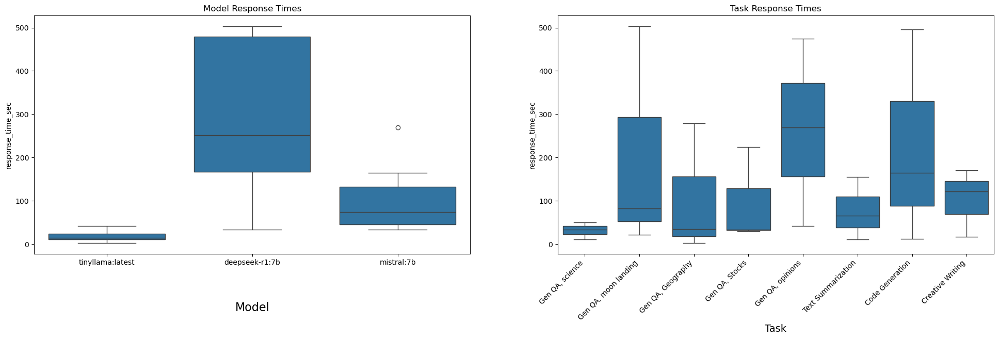

In [149]:
import matplotlib.pyplot as plt
import seaborn as sns

# plt.subplots(figsize=(24, 6))


plt.figure(figsize=(24, 6))

plt.subplot(1,2,1)
sns.boxplot(x="Model", y="response_time_sec", data=df)#hue="Survived", data=df_imputed)
plt.title('Model Response Times')
plt.xlabel("Model", fontsize=16, labelpad=50)

plt.subplot(1,2,2)
sns.boxplot(x="Task", y="response_time_sec", data=df), #hue="Survived", data=df_imputed)
plt.xticks(rotation=45,ha="right")
plt.title('Task Response Times')
plt.xlabel("Task", fontsize=14)

plt.show()

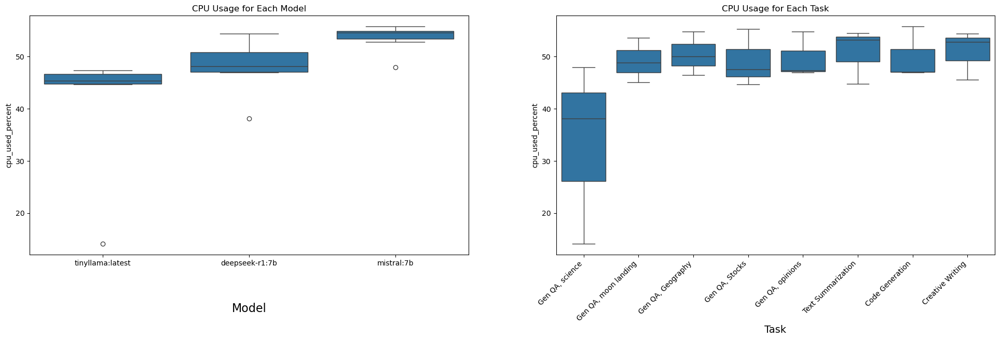

In [152]:
import matplotlib.pyplot as plt
import seaborn as sns

# plt.subplots(figsize=(24, 6))


plt.figure(figsize=(24, 6))

plt.subplot(1,2,1)
sns.boxplot(x="Model", y="cpu_used_percent", data=df)#hue="Survived", data=df_imputed)
plt.title('CPU Usage for Each Model')
plt.xlabel("Model", fontsize=16, labelpad=50)

plt.subplot(1,2,2)
sns.boxplot(x="Task", y="cpu_used_percent", data=df), #hue="Survived", data=df_imputed)
plt.xticks(rotation=45,ha="right")
plt.title('CPU Usage for Each Task')
plt.xlabel("Task", fontsize=14)

plt.show()

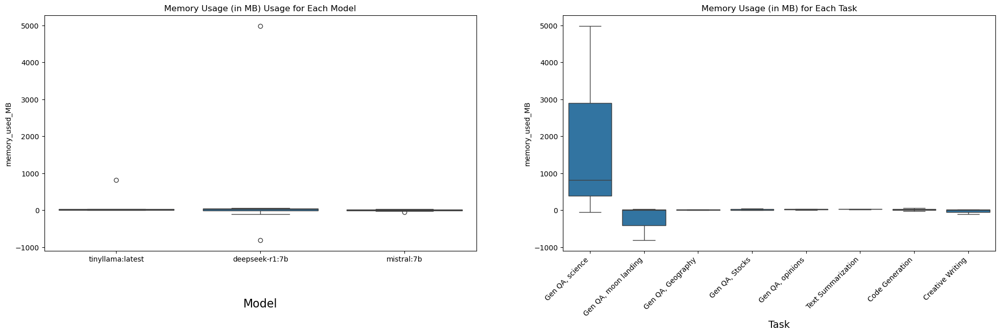

In [155]:

plt.figure(figsize=(24, 6))

plt.subplot(1,2,1)
sns.boxplot(x="Model", y="memory_used_MB", data=df)
plt.title('Memory Usage (in MB) Usage for Each Model')
plt.xlabel("Model", fontsize=16, labelpad=50)

plt.subplot(1,2,2)
sns.boxplot(x="Task", y="memory_used_MB", data=df),
plt.xticks(rotation=45,ha="right")
plt.title('Memory Usage (in MB) for Each Task')
plt.xlabel("Task", fontsize=14)

plt.show()

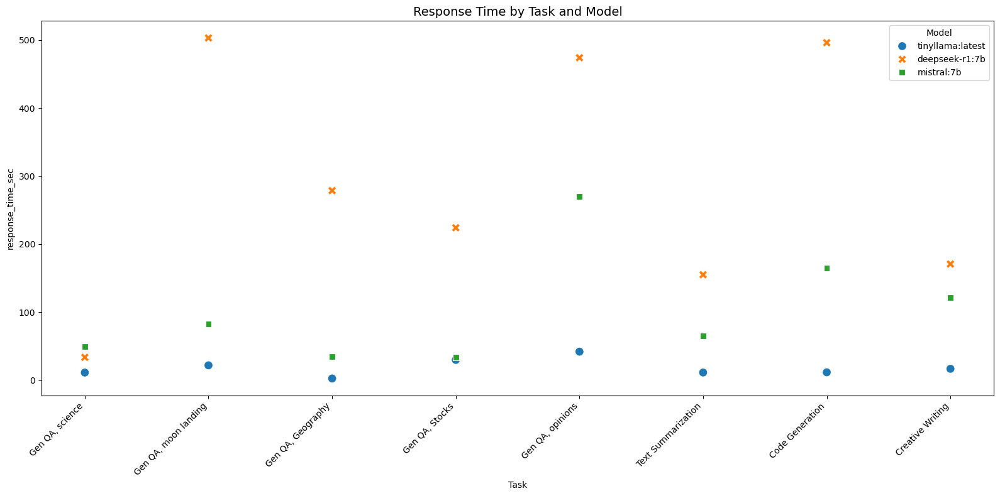

In [112]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(16, 8))
sns.scatterplot(data=df, x="Task", y="response_time_sec", hue="Model", style="Model", s=100)

plt.xticks(rotation=45, ha="right")
plt.title("Response Time by Task and Model", fontsize=14)
plt.tight_layout()
plt.show()

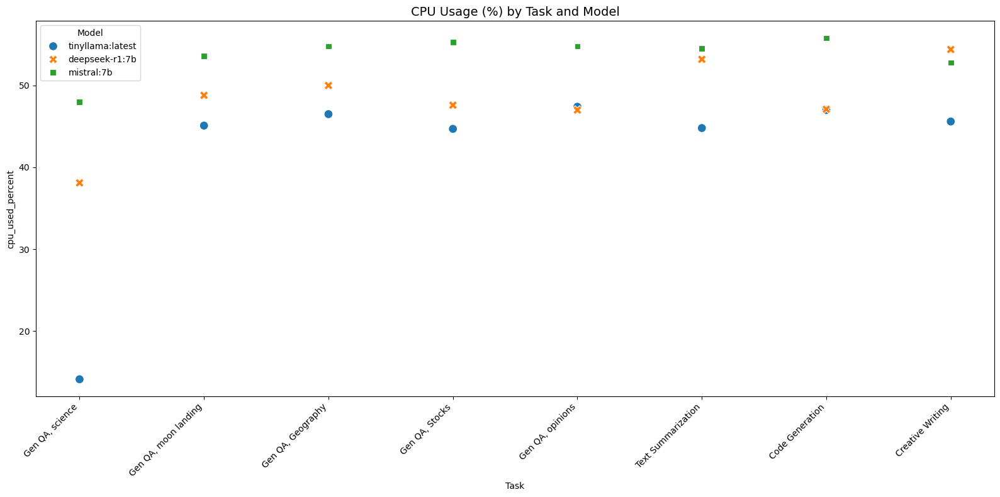

In [157]:
plt.figure(figsize=(16, 8))
sns.scatterplot(data=df, x="Task", y="cpu_used_percent", hue="Model", style="Model", s=100)

plt.xticks(rotation=45, ha="right")
plt.title("CPU Usage (%) by Task and Model", fontsize=14)
plt.tight_layout()
plt.show()

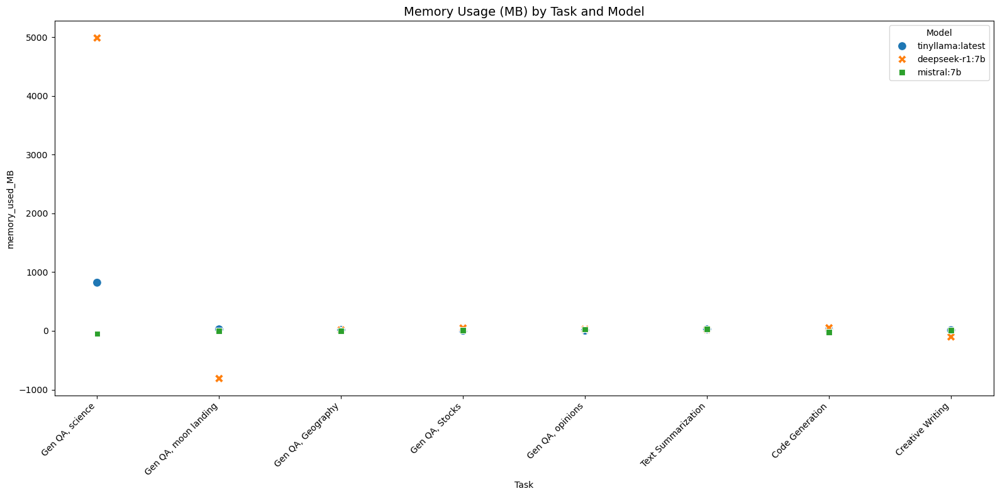

In [158]:
plt.figure(figsize=(16, 8))
sns.scatterplot(data=df, x="Task", y="memory_used_MB", hue="Model", style="Model", s=100)

plt.xticks(rotation=45, ha="right")
plt.title("Memory Usage (MB) by Task and Model", fontsize=14)
plt.tight_layout()
plt.show()

<a href="#skip_variables">Click Here to Skip the Variables</a>

Preparing the Variables: 

In [167]:
import textwrap
chosen_width = 65

def format_text(long_text):
    # need to create an array of long texts which ugh too much work
    long_texts = []
    
    start = 0  # index to keep track of where each paragraph starts
    
    # search throughout the text
    for i in range(len(long_text) - 1):
        # check for \n\n
        if long_text[i] == '\n' and long_text[i+1] == '\n':
            chunk = long_text[start:i].strip()
            if chunk:
                long_texts.append(chunk)
            start = i + 2  # skip the \n\n

    # add the last bit of text after the last \n\n
    last_chunk = long_text[start:].strip()
    if last_chunk:
        long_texts.append(last_chunk)

    # wrap each paragraph
    wrapped = [textwrap.fill(para, width=chosen_width) for para in long_texts]

    # add them all together and add \n\n in between each one
    formatted_text = '\n\n'.join(wrapped)

    return formatted_text


<a href="#skipvar">Click here to skip variables</a>

In [168]:
# science history
tiny_science = "The general theory of relativity was first proposed by Albert Einstein in his paper \"On the Electrodynamics of Moving Bodies\" in 1915. \nEinstein's work on the theory was based on a fundamental principle, which is now commonly known as general relativity. \nThe theory's discoverer is generally considered to be Einstein himself, but it has also been credited to a number of other scientists who worked with him on the development of the theory."
deep_science = "<think>\n\n</think>\n\nThe general theory of relativity was formulated by Albert Einstein. His groundbreaking work, which fundamentally changed our understanding of gravity and spacetime, was published in 1915."
minst_science = "Albert Einstein. He developed the General Theory of Relativity between 1907 and 1915, which is a theory of gravitation that was introduced to replace Newton's law of universal gravitation. \nIt extended the special theory of relativity by allowing for the presence of matter and the effects of gravity. \nThe general theory of relativity predicted the existence of black holes and the phenomenon of gravitational waves (ripples in spacetime caused by accelerating mass), both of which have since been observed."

# moon landing
tiny_moon = "I do not have access to any specific information or evidence, but generally speaking, there has been a lot of research and debate about whether or not the moon landing was actually accomplished as claimed by the United States government.\n\nthe event took place on august 21st, 1969, when astronauts leroy girard, buzz Aldrin, and moonsupport engineer jeff geogia, landed safely on the moon's surface. The landing was announced to the public by john f. Kennedy at ronald reagan's inauguration in 1984.\n\nalthough there is no official record of any scientific or technological breakthrough during this event, some researchers and scholars believe that the moon landing may have been a staged event to promote american power and influence globally. \nThere are also claims that the landing was part of a much larger project known as the \"project apollo\" aimed at creating a permanent human presence on the lunar surface.\n\nin any case, the specifics of the moon landing's details have not been conclusively proven or disproved by researchers and historians alike."

deep_moon = "<think>\nOkay, so I'm trying to figure out if the moon landing was fake. \nI remember hearing about this a lot when it happened in 1969 because a lot of people were really into space and the idea that we could go there seemed amazing. \nBut now, as an adult, I wonder if it's real or some kind of illusion.\n\nFirst off, what do I know? Well, I think the Apollo 11 mission landed on the moon, right? \nThey sent Neil Armstrong and Buzz Aldrin, and I remember seeing pictures from them. \nBut how did they get those photos? Were they taken by regular cameras, or was it a special camera? \nMaybe they used something like astronaut suits with cameras attached to capture the moment.\n\nAlso, there's the idea of Hidden camera 7. I think that was a video made after the Apollo mission claimed to show what happened on the moon. \nWas it real or fake? And why would someone make such a video now? \nMaybe it's a hoax trying to prove that the moon landing wasn't real.\n\nThen there's the technology involved. The space suits must have been specially designed for walking on the moon without oxygen, right? \nI think they had some kind of pressurization system so that when you walked on the suit, it didn't fill up with moon dust or something like that. But how did they test those suits before the mission?\n\nNavigation was another aspect. How did they land on the moon if there's no atmosphere? They must have used the Lunar Module to land safely without any air resistance. \nThat seems complicated but possible.\n\nI also remember hearing about lunar rovers collecting samples and sending them back to Earth. These samples were analyzed in labs, like by NASA or other organizations. \nIf those samples were tampered with, it could be a problem, but I don't recall that happening.\n\nThere are people who still believe the moon landing was fake, maybe for different reasons. \nSome might think it's just a movie or a TV show, while others have their own theories about how they did it. But most scientists and history experts say it happened because of technological advancements at the time.\n\nI wonder if there's any evidence that could prove it's fake. Maybe eyewitness accounts? \nBut I don't remember hearing credible people who saw Armstrong step on the moon. Or maybe it was all computer-generated images or CGI in the later photos?\n\nAlso, how do they explain the lack of radio communications after landing? If the mission had an issue, why didn't anyone know about it for sure? \nIt seems like everything went smoothly.\n\nThere's also the matter of conspiracy theories. \nThey sometimes use this event to spread their ideas. \nMaybe if someone is on a plane or in a car while watching the moon landing, they can make it seem real because they have visual aids with better sound quality. \nOr maybe if the video was taken from an airplane window facing towards Earth, the shadows and movements would be more convincing.\n\nI think the key points are: technology used, evidence collected, lack of communication issues, and the reliability of eyewitness accounts. Since none of these raise red flags, it's more likely that the moon landing is real.\n\nMaybe I should look up some sources or articles to see if there's any credible information that suggests it's fake. \nBut from what I gather so far, the mission seems legitimate based on technology, evidence, and lack of believable issues.\n</think>\n\nThe moon landing, specifically the Apollo 11 mission in 1969, is widely accepted as a real event based on multiple pieces of evidence and technology:\n\n1. **Technology and Gear**: The mission utilized specialized equipment like lunar suits with pressurization systems designed to handle the low-pressure environment on the moon, ensuring astronauts could move without obstruction.\n\n2. **Navigation**: The Lunar Module used gravity assists from the Earth for landing, a method feasible without atmospheric interference.\n\n3. **Evidence Collection**: Samples collected by the rover were analyzed and shared among scientific communities, with no signs of tampering or alteration.\n\n4. **Communication**: There was no radio communication issue post-landing, as stated by mission controllers.\n\n5. **Eyewitness Accounts**: While Armstrong's historic words are legendary, there are no credible eyewitness accounts supporting a fake landing after the event.\n\n6. **Conspiracy Theories**: Such theories often lack concrete evidence and sometimes exploit visual aids or aircraft footage to spread their narratives.\n\nIn conclusion, considering technological advancements, evidence, communication, and lack of credible doubts, the moon landing is concluded as real based on current understanding and available information."

minst_moon = "The moon landing, specifically the Apollo 11 mission that took place on July 20, 1969, is not a hoax. It was one of the most extensively documented events in human history, with numerous pieces of evidence supporting its authenticity. \nHundreds of photographs and videos were taken by astronauts during their stay on the moon and later returned to Earth. Furthermore, scientists all over the world have confirmed that the lunar samples brought back by the Apollo missions contain unique features consistent with a Moon origin.\n\nThe conspiracy theories suggesting otherwise are largely based on misinterpretations, misunderstandings, or skepticism about the technological capabilities of NASA and other space agencies at the time. However, advances in technology since then have only served to reinforce the reality of the moon landing.\n\nWhile it's important to encourage critical thinking and questioning, it's crucial to distinguish between skepticism and baseless conspiracy theories. The moon landing is one of those events that has been thoroughly documented and supported by a vast body of evidence."

# moon landing
tiny_moon2 = "I do not have access to any specific information or evidence, \nbut generally speaking, there has been a lot of research and debate about \nwhether or not the moon landing was actually accomplished as claimed by the United States government.\n\nthe event took place on august 21st, 1969, when astronauts leroy girard, buzz Aldrin, and moonsupport engineer jeff geogia, landed safely on the moon's surface. \nThe landing was announced to the public by john f. Kennedy at ronald reagan's inauguration in 1984.\n\nalthough there is no official record of any scientific or technological breakthrough during this event, \nsome researchers and scholars believe that the moon landing may have been a staged event to promote american power and influence globally. \nThere are also claims that the landing was part of a much larger project known as the \"project apollo\" aimed at creating a permanent human presence on the lunar surface.\n\nin any case, the specifics of the moon landing's details have not been conclusively proven or disproved by researchers and historians alike."

deep_moon2 = "<think>\nOkay, so I'm trying to figure out if the moon landing was fake. \nI remember hearing about this a lot when it happened in 1969 because a lot of people were really into space and the idea that we could go there seemed amazing. \nBut now, as an adult, I wonder if it's real or some kind of illusion.\n\nFirst off, what do I know? Well, I think the Apollo 11 mission landed on the moon, right? \nThey sent Neil Armstrong and Buzz Aldrin, and I remember seeing pictures from them. \nBut how did they get those photos? Were they taken by regular cameras, or was it a special camera? \nMaybe they used something like astronaut suits with cameras attached to capture the moment.\n\nAlso, there's the idea of Hidden camera 7. I think that was a video made after the Apollo mission claimed to show what happened on the moon. \nWas it real or fake? And why would someone make such a video now? \nMaybe it's a hoax trying to prove that the moon landing wasn't real.\n\nThen there's the technology involved. The space suits must have been specially designed for walking on the moon without oxygen, right? \nI think they had some kind of pressurization system so that when you walked on the suit, \nit didn't fill up with moon dust or something like that. But how did they test those suits before the mission?\n\nNavigation was another aspect. How did they land on the moon if there's no atmosphere? They must have used the Lunar Module to land safely without any air resistance. \nThat seems complicated but possible.\n\nI also remember hearing about lunar rovers collecting samples and sending them back to Earth. These samples were analyzed in labs, like by NASA or other organizations. \nIf those samples were tampered with, it could be a problem, but I don't recall that happening.\n\nThere are people who still believe the moon landing was fake, maybe for different reasons. \nSome might think it's just a movie or a TV show, while others have their own theories about how they did it. \nBut most scientists and history experts say it happened because of technological advancements at the time.\n\nI wonder if there's any evidence that could prove it's fake. Maybe eyewitness accounts? \nBut I don't remember hearing credible people who saw Armstrong step on the moon. Or maybe it was all computer-generated images or CGI in the later photos?\n\nAlso, how do they explain the lack of radio communications after landing? If the mission had an issue, why didn't anyone know about it for sure? \nIt seems like everything went smoothly.\n\nThere's also the matter of conspiracy theories. \nThey sometimes use this event to spread their ideas. \nMaybe if someone is on a plane or in a car while watching the moon landing, they can make it seem real because they have visual aids with better sound quality. \nOr maybe if the video was taken from an airplane window facing towards Earth, the shadows and movements would be more convincing.\n\nI think the key points are: technology used, evidence collected, lack of communication issues, and the reliability of eyewitness accounts. \nSince none of these raise red flags, it's more likely that the moon landing is real.\n\nMaybe I should look up some sources or articles to see if there's any credible information that suggests it's fake. \nBut from what I gather so far, the mission seems legitimate based on technology, evidence, and lack of believable issues.\n</think>\n\nThe moon landing, specifically the Apollo 11 mission in 1969, is widely accepted as a real event based on multiple pieces of evidence and technology:\n\n1. **Technology and Gear**: The mission utilized specialized equipment like lunar suits with pressurization systems \ndesigned to handle the low-pressure environment on the moon, ensuring astronauts could move without obstruction.\n\n2. **Navigation**: The Lunar Module used gravity assists from the Earth for landing, a method feasible without atmospheric interference.\n\n3. **Evidence Collection**: Samples collected by the rover were analyzed and shared among scientific communities, with no signs of tampering or alteration.\n\n4. **Communication**: There was no radio communication issue post-landing, as stated by mission controllers.\n\n5. **Eyewitness Accounts**: While Armstrong's historic words are legendary, there are no credible eyewitness accounts supporting a fake landing after the event.\n\n6. **Conspiracy Theories**: Such theories often lack concrete evidence and sometimes exploit visual aids or aircraft footage to spread their narratives.\n\nIn conclusion, considering technological advancements, evidence, communication, and lack of credible doubts, the moon landing is concluded as real based on current understanding and available information."

minst_moon2 = "The moon landing, specifically the Apollo 11 mission that took place on July 20, 1969, is not a hoax. \nIt was one of the most extensively documented events in human history, with numerous pieces of evidence supporting its authenticity. \nHundreds of photographs and videos were taken by astronauts during their stay on the moon and later returned to Earth. \nFurthermore, scientists all over the world have confirmed that the lunar samples brought back by the Apollo missions contain unique features consistent with a Moon origin.\n\nThe conspiracy theories suggesting otherwise are largely based on misinterpretations, misunderstandings, or skepticism about the technological capabilities of NASA and other space agencies at the time. \nHowever, advances in technology since then have only served to reinforce the reality of the moon landing.\n\nWhile it's important to encourage critical thinking and questioning, it's crucial to distinguish between skepticism and baseless conspiracy theories. \nThe moon landing is one of those events that has been thoroughly documented and supported by a vast body of evidence."

# geography
tiny_geo = "The name of the gulf that borders Texas and Mexico is the Gulf of Mexico."

deep_geo = "<think>\nOkay, so I need to figure out the name of the Gulf that borders both Texas and Mexico. Hmm, let's start by visualizing where these two states are located in relation to each other. I know that Texas is on the southern part of the United States, and Mexico is to its north. So, the Gulf must be somewhere along their shared coastline.\n\nI remember hearing about the Gulf of Mexico before, but wait, isn't there a Gulf named Gulf proper? Or maybe it's a different one. Let me think... The Gulf of Mexico is a well-known body that separates the two countries, right? \nIt's surrounded by the United States on three sides and Mexico on the fourth. \nThat makes sense because if you look at maps, Florida is to the east, Alabama and Georgia to the south, and Texas itself is along the west coast.\n\nWait, but I'm trying to recall any other gulf that might border both states. \nThere's also the Gulf of California, which is off Mexico's southern tip, but that doesn't extend all the way to Texas. So probably not that one. \nAnother possibility could be the Gulf of Tehualpa or something like that, but those are smaller and more specific.\n\nI should consider if there's a larger Gulf specifically mentioned in geographical terms for this purpose. \nThe Gulf of Mexico seems to fit perfectly because it's the main body that connects both states along their coastline. It's also the one that extends from Florida all the way across to Texas, forming part of the southern boundary between the two countries.\n\nJust to be thorough, I can think about other large bodies like the Caribbean Sea or the Atlantic Ocean. The Caribbean is near Florida and to the east, so it doesn't border Mexico directly where they share a border with Texas. \nThe Atlantic is way up north in New England states, so that's not relevant here either.\n\nAlso, thinking about the Bering Strait, which separates Siberia from Alaska, but that's in North America, not near Mexico or Texas. So no, it's definitely not that. Another thought: the Yucatan Peninsula is a significant area along the border between Mexico and the southern part of the United States, including Texas. But the Gulf is more about the body of water rather than land.\n\nSo putting it all together, the Gulf that borders both Texas and Mexico is the Gulf of Mexico itself. \nIt's the major sea that connects them and is an integral part of their shared coastal areas.\n</think>\n\nThe Gulf that borders both Texas and Mexico is the Gulf of Mexico."

minst_geo = "The Gulf that borders Texas and Mexico is called the Gulf of Mexico. It is a large inlet on the southeastern coast of North America, extending from the tip of Texas to the northern shores of Cuba and Florida, and all the way to the Straits of Yucatan. It is one of the five major oceanic bodies of water and is famous for its rich marine biodiversity and petroleum reserves."

# copy for plt
tiny_geo2 = "The name of \nthe gulf that borders \nTexas and Mexico is \nthe Gulf of Mexico."

deep_geo2 = "<think>\nOkay, so I need to figure out the name of the Gulf that borders both Texas and Mexico. \nHmm, let's start by visualizing where these two states are located in relation to each other. \nI know that Texas is on the southern part of the United States, and Mexico is to its north. So, the Gulf must be somewhere along their shared coastline.\n\nI remember hearing about the Gulf of Mexico before, \nbut wait, isn't there a Gulf named Gulf proper? Or maybe it's a different one. Let me think... \nThe Gulf of Mexico is a well-known body that separates the two countries, right? \nIt's surrounded by the United States on three sides and Mexico on the fourth. \nThat makes sense because if you look at maps, Florida is to the east, Alabama and Georgia to the south, and Texas itself is along the west coast.\n\nWait, but I'm trying to recall any other gulf that might border both states. \nThere's also the Gulf of California, which is off Mexico's southern tip, but that doesn't extend all the way to Texas. So probably not that one. \nAnother possibility could be the Gulf of Tehualpa or something like that, \nbut those are smaller and more specific.\n\nI should consider if there's a larger Gulf specifically mentioned in geographical terms for this purpose. \nThe Gulf of Mexico seems to fit perfectly because it's the main body that connects both states along their coastline. \nIt's also the one that extends from Florida all the way across to Texas, forming part of the southern boundary between the two countries.\n\nJust to be thorough, I can think about other large bodies like the Caribbean Sea or the Atlantic Ocean. \nThe Caribbean is near Florida and to the east, so it doesn't border Mexico directly where they share a border with Texas. \nThe Atlantic is way up north in New England states, so that's not relevant here either.\n\nAlso, thinking about the Bering Strait, which separates Siberia from Alaska, but that's in North America, not near Mexico or Texas. So no, it's definitely not that. \nAnother thought: the Yucatan Peninsula is a significant area along the border between Mexico and the southern part of the United States, including Texas. \nBut the Gulf is more about the body of water rather than land.\n\nSo putting it all together, the Gulf that borders both Texas and Mexico is the Gulf of Mexico itself. \nIt's the major sea that connects them and is an integral part of their shared coastal areas.\n</think>\n\nThe Gulf that borders both Texas and Mexico is the Gulf of Mexico."

minst_geo2 = "The Gulf that borders Texas and Mexico is called the Gulf of Mexico. \nIt is a large inlet on the southeastern coast of North America, \nextending from the tip of Texas to the northern shores of Cuba and Florida, \nand all the way to the Straits of Yucatan. \nIt is one of the five major oceanic bodies of water and is \nfamous for its rich marine biodiversity and petroleum reserves."

# stocks
tiny_stocks = "As an AI assistant, I would not make decisions for you based on my personal opinions or financial considerations. However, I can provide some general guidance and recommendations on stocks that could potentially perform well in the long-term, depending on your investment goals and risk tolerance:\n\n1. Growth stocks: These stocks tend to be more volatile but offer higher returns over the short-term due to their superior earnings growth potential. Investors looking for sustainable profits should consider companies that have been able to deliver strong revenue and profit growth over the past few years.\n\n2. Cyclical stocks: Cyclical stocks are those that can be affected by economic fluctuations, such as oil prices or interest rates. Investors who are willing to take on some risk should consider companies with businesses that have a strong connection to these factors and are able to generate consistent earnings growth over the long-term.\n\n3. Dividend stocks: Stocks with high dividends can offer long-term investment opportunities due to their ability to generate income. Investors should carefully review companies' financial statements and management teams before deciding which ones to buy.\n\n4. Highly diversified portfolios: Investing in multiple stocks from different industries or sectors can help reduce the overall risk of your investment portfolio. This approach allows for a mix of growth, value, and dividend-paying stocks, ensuring that you have exposure to various market conditions.\n\nAs always, do your research before making any decisions regarding specific stocks."

deep_stocks = "<think>\n\n</think>\n\nAs of my last update in July 2024, I don't have real-time data access, so I can't provide current stock recommendations. However, I can guide you on how to make informed decisions:\n\n1. **Diversification**: Spread your investments across different sectors and industries to reduce risk.\n\n2. **Risk Tolerance**: Consider your comfort with market volatility. Stocks vary from high-risk (e.g., tech startups) to low-risk (e.g., government bonds).\n\n3. **Time Horizon**: Longer-term investments generally offer higher potential returns, while shorter-term ones are better suited for speculation.\n\n4. **Dow Jones Industrial Average (DJIA)**: A common stock market index that reflects large, well-known companies. It's a good diversified option.\n\n5. **S&P 500**: Another popular index representing 500 large companies across various industries in the U.S.\n\n6. **Nasdaq-100**: Includes tech stocks and is suitable for tech enthusiasts.\n\n7. **Dividend Stocks**: Companies that pay regular dividends, often stable over time, with examples like Johnson & Johnson or Procter & Gamble.\n\n8. **Index Funds**: Low-cost funds tracking indices like the S&P 500 (e.g., VOO) or DJIA (e.g., DAXX). They're passive and require minimal management.\n\n9. ** ETFs (Exchange-Traded Funds)**: Offer exposure to indices, sectors, or themes without managing individual securities. Examples include SPY (S&P 500), QQQ (Nasdaq-100), or VGGH (healthcare).\n\n10. **Robo-Advisors**: Tools like Betterment or Wealthfront that help you build and manage your portfolio with minimal effort.\n\nFor the most accurate recommendations, consult a financial advisor or use platforms like Bloomberg, Morningstar, or YNAB (You Need A Budget) for budget tracking. Always stay informed about economic trends and market changes to make well-rounded decisions."

minst_stocks = "I am a machine learning model and cannot provide financial advice or make investment recommendations. \nIt's essential to do thorough research, consider your own financial situation, and consult with a financial advisor before making any investment decisions. \nResearching stocks involves analyzing financial statements, market trends, and industry developments. Some popular methods for selecting stocks include fundamental analysis, technical analysis, and diversification strategies. Always remember that investing carries risk, including the potential loss of principal."

# copy for plt
tiny_stocks2 = "As an AI assistant, I would not make decisions for you based on my personal opinions or financial considerations. \nHowever, I can provide some general guidance and recommendations on stocks that could potentially perform well in the long-term, depending on your investment goals and risk tolerance:\n\n1. Growth stocks: These stocks tend to be more volatile but offer higher returns over the short-term due to their superior earnings growth potential. \nInvestors looking for sustainable profits should consider companies that have been able to deliver strong revenue and profit growth over the past few years.\n\n2. Cyclical stocks: Cyclical stocks are those that can be affected by economic fluctuations, such as oil prices or interest rates. \nInvestors who are willing to take on some risk should consider companies with businesses that have a strong connection to these factors and are able to generate consistent earnings growth over the long-term.\n\n3. Dividend stocks: Stocks with high dividends can offer long-term investment opportunities due to their ability to generate income. \nInvestors should carefully review companies' financial statements and management teams before deciding which ones to buy.\n\n4. Highly diversified portfolios: Investing in multiple stocks from different industries or sectors can help reduce the overall risk of your investment portfolio. \nThis approach allows for a mix of growth, value, and dividend-paying stocks, ensuring that you have exposure to various market conditions.\n\nAs always, do your research before making any decisions regarding specific stocks."

deep_stocks2 = "<think>\n\n</think>\n\nAs of my last update in July 2024, I don't have real-time data access, so I can't provide current stock recommendations. However, I can guide you on how to make informed decisions:\n\n1. **Diversification**: Spread your investments across different sectors and industries to reduce risk.\n\n2. **Risk Tolerance**: Consider your comfort with market volatility. Stocks vary from high-risk (e.g., tech startups) to low-risk (e.g., government bonds).\n\n3. **Time Horizon**: Longer-term investments generally offer higher potential returns, while shorter-term ones are better suited for speculation.\n\n4. **Dow Jones Industrial Average (DJIA)**: A common stock market index that reflects large, well-known companies. It's a good diversified option.\n\n5. **S&P 500**: Another popular index representing 500 large companies across various industries in the U.S.\n\n6. **Nasdaq-100**: Includes tech stocks and is suitable for tech enthusiasts.\n\n7. **Dividend Stocks**: Companies that pay regular dividends, often stable over time, with examples like Johnson & Johnson or Procter & Gamble.\n\n8. **Index Funds**: Low-cost funds tracking indices like the S&P 500 (e.g., VOO) or DJIA (e.g., DAXX). They're passive and require minimal management.\n\n9. ** ETFs (Exchange-Traded Funds)**: Offer exposure to indices, sectors, or themes without managing individual securities. Examples include SPY (S&P 500), QQQ (Nasdaq-100), or VGGH (healthcare).\n\n10. **Robo-Advisors**: Tools like Betterment or Wealthfront that help you build and manage your portfolio with minimal effort.\n\nFor the most accurate recommendations, consult a financial advisor or use platforms like Bloomberg, Morningstar, or YNAB (You Need A Budget) for budget tracking. Always stay informed about economic trends and market changes to make well-rounded decisions."

minst_stocks2 = "I am a machine learning model and cannot provide financial advice or make investment recommendations. \nIt's essential to do thorough research, consider your own financial situation, and consult with a financial advisor before making any investment decisions. \nResearching stocks involves analyzing financial statements, market trends, and industry developments. \nSome popular methods for selecting stocks include fundamental analysis, technical analysis, and diversification strategies. \nAlways remember that investing carries risk, including the potential loss of principal."

# opinions
tiny_opinions = "Here are some controversial opinions or beliefs that you may find worth considering:\n\n1. Climate change denial: Some people reject the scientific consensus on climate change, believing it to be exaggerated or even a conspiracy theory. This opinion can have significant implications for public policy and global action.\n\n2. Abortion: While some people support abortion rights and access to abortion clinics, others oppose this right and argue that women should always choose life over pregnancy.\n\n3. Gun control: Some people believe in stricter gun control laws to reduce violence in society. \nOthers are in favor of the Second Amendment right to bear arms and argue that guns should be allowed for responsible use.\n\n4. Immigration policy: People may have differing opinions on immigration, with some supporting increased migration to the country, while others oppose it or question the effectiveness of policies like border security.\n\n5. Religious beliefs: Some people may hold religious beliefs that are in opposition to other religions, such as Christianity and Islam. \nThis can lead to conflicts between people who practice these religions.\n\n6. Political ideologies: People may have different political ideologies or viewpoints on issues like taxes, government spending, and social policies.\n\n7. Philosophical beliefs: Some philosophers or theorists believe in radical ideas that challenge commonly held beliefs, such as \"utopian\" societies or systems that are not based on democracy, individualism, or egalitarianism.\n\n8. Artistic and literary opinions: People may have divergent views on artistic and literary works, with some appreciating certain artists or books while others view them negatively.\n\n9. Environmental concerns: Some environmentalists believe in strict measures to preserve nature, while others advocate for economic growth and resource extraction.\n\n10. Social media and online communication platforms: People may have divergent opinions on social media and online communication platforms, with some preferring the \"old-school\" approach of traditional media while others argue for more accessibility, transparency, and privacy."

deep_opinions = "<think>\nOkay, so I need to figure out what the user is asking for. They wrote, \"What controversial opinions are worth considering?\" and then provided an example response where someone listed 10 controversial opinions with brief explanations.\n\nHmm, looking at their example, they're probably seeking a list of well-known controversial views or beliefs along with some reasoning why they might be worth considering. \nBut I'm not entirely sure if that's what the user wants specifically. Maybe they want to explore various controversial ideas in different fields like politics, philosophy, science, etc.\n\nWait, the initial prompt is \"What controversial opinions are worth considering?\" which suggests they're looking for a list of such opinions. The example response gives 10 points with each having an opinion and why it's controversial. So perhaps they want a similar structured answer but maybe more in-depth or covering different areas.\n\nBut before I jump into providing that, I should make sure I understand what \"worth considering\" means here. It might mean opinions that are debated, influential, or have significant impact despite being controversial. Or maybe they're looking for opinions that challenge common beliefs and provoke thought.\n\nI also noticed in the example response, each point is labeled with a number and a brief explanation. So if I were to expand on that, perhaps I should include more details about why each controversial opinion is worth considering, maybe delve deeper into the implications or provide historical context where applicable.\n\nHowever, since this is a thought process, I need to consider whether I have all the necessary information. \nThe user didn't specify which field the opinions come from\u2014could be philosophy, politics, science, history, etc.\u2014so it might be too broad if I try to cover everything.\n\nBut given that the example provided 10 points with various fields in mind (religion, history, education), maybe I can stick to a similar approach but ensure each opinion is clearly explained and why it's controversial. \nAlternatively, perhaps they want a list of well-known controversial opinions without too much explanation, just the statements.\n\nWait, actually, looking back at their example response: \"What controversial opinions are worth considering? 1) [Opinion] 2) [Opinion]...\" So maybe they're expecting an enumeration of such opinions. But then, how detailed should each entry be?\n\nI think it's best to provide a list where each point is a concise statement followed by a brief explanation or why it's controversial. That way, the user gets both the opinion and some insight into its debateability.\n\nBut also, I need to make sure that the opinions are indeed considered controversial. Some might not be widely debated but could still be provocative. \nFor example, someone might have an opinion on gender reassignment surgery being illegal or legal, which is a highly debated issue.\n\nI should also consider how to balance different viewpoints. \nThe user didn't specify any particular field, so I can include a variety from different areas like technology, society, science, etc.\n\nAnother thought: maybe the user wants this for educational purposes, perhaps for research or discussion. In that case, providing well-known controversial opinions could be useful. \nSo including opinions like gender identity laws, capital punishment, AI ethics, etc., which are current hot topics.\n\nAlternatively, if they're looking to engage in a discussion about controversial ideas, having such a list can spark debates on various issues.\n\nBut since I don't have specific information about the user's background or context, I'll proceed with a general list of controversial opinions across different domains. \nEach opinion should be succinctly stated and briefly explained why it's controversial.\n\nI also need to ensure that my language is clear and accessible, avoiding overly academic terms unless necessary. The goal is to make the information understandable to someone who might not be familiar with each topic.\n\nWait, but in their example response, they included \"religion\" as a source of moral truths, which is debatable because some religions have conflicting teachings or are polytheistic. \nSo perhaps including religious opinions would involve discussions about differing beliefs and interpretations.\n\nIn terms of structure, I can list them as points with numbers followed by the opinion statement and then a brief explanation. That seems straightforward.\n\nI should also note that these opinions aren't universally accepted and are subject to debate, which is why they're considered controversial.\n\nFinally, wrapping it up with a conclusion that emphasizes the value of considering such opinions for personal growth or societal progress, as per the initial example.\n\nSo putting this all together, I can create a list of 10 controversial opinions from various fields, each explained briefly on why they're worth considering.\n</think>\n\nCertainly! Here's an organized presentation of controversial opinions across various domains, each followed by a brief explanation of their controversy:\n\n1. **Religion as a Source of Moral Truth**: The idea that religious teachings provide the foundation for moral values is debated due to differing interpretations and conflicting doctrines across religions.\n\n2. **Capital Punishment**: The debate centers on whether capital punishment deters crime effectively or leads to recidivism, with arguments on retribution versus deterrence.\n\n3. **Gender Identity Laws**: These laws, such as allowing same-sex couples to marry without discrimination, face criticism for perceived threats to traditional values and religious beliefs.\n\n4. **AI Ethics**: Questions arise about the moral responsibility of artificial intelligence creators in creating harmful AI entities.\n\n5. **Free Trade vs. Protectionism**: The trade-offs between economic growth through free markets versus protectionist policies safeguarding domestic industries are contentious issues.\n\n6. **Abortion Laws**: These laws balance individual bodily autonomy with societal values, often involving debates over personal freedom and public health concerns.\n\n7. **Global Warming**: The scientific consensus on human-induced climate change is challenged by those who dispute the role of human activity in driving global warming.\n\n8. **Immigration Policies**: Balancing economic needs with humanitarian considerations leads to debates on legal versus illegal immigration's impact on communities and nations.\n\n9. **Vaccines and GMO Foods**: Concerns about health risks and environmental impact, leading to differing opinions on their safety and necessity.\n\n10. **AI in Decision-Making**: The ethical implications of AI-driven decisions in areas like hiring or criminal justice are widely debated for fairness and transparency.\n\nEach of these opinions is subject to significant debate due to differing viewpoints and impacts on society, personal freedom, and ethical considerations."

minst_opinions = "1. Criminalizing poverty is counterproductive: Instead of focusing on punishment, resources should be directed towards addressing the root causes of poverty such as lack of education, job opportunities, and access to healthcare. This could lead to a reduction in crime rates by reducing incentives for individuals to turn to illegal activities due to economic desperation.\n\n2. Rethinking traditional gender roles: Encouraging men to take on traditionally female roles (e.g., housework, childcare) and women to take on traditionally male roles (e.g., high-paying jobs in science, technology, engineering, and mathematics) can lead to a more equitable society. This requires breaking down societal norms and expectations and providing opportunities for both genders to excel in various fields.\n\n3. The benefits of universal basic income: Providing a guaranteed minimum income for all citizens could reduce poverty, increase economic mobility, and provide a safety net during periods of unemployment or underemployment. \nCritics argue that it would be too expensive, but proponents suggest that it could lead to long-term cost savings due to reduced reliance on welfare programs and increased productivity.\n\n4. Redefining success: Instead of focusing solely on financial success, we should consider other aspects such as personal happiness, fulfillment, and meaningful relationships when measuring an individual's success. This shift in perspective could lead to a more balanced and fulfilled society where mental health is prioritized alongside material wealth.\n\n5. The potential benefits of decriminalizing drugs: Decriminalizing drugs for personal use could reduce the number of non-violent offenders in prisons, free up resources for law enforcement agencies, and shift focus towards treating addiction as a public health issue rather than a criminal justice problem. This approach has been successful in countries like Portugal and Switzerland.\n\n6. Reconsidering mandatory minimum sentences: Mandatory minimum sentences have been shown to disproportionately impact minority communities, contribute to overcrowded prisons, and lead to longer sentences for non-violent offenders. A more nuanced approach that considers the individual circumstances of each case could result in fairer sentencing practices.\n\n7. Questioning the need for nuclear deterrence: The existence of nuclear weapons poses a significant risk to humanity due to the potential for accidents, theft, or misuse. Efforts should be made towards disarmament and reducing reliance on nuclear weapons as a means of ensuring national security.\n\n8. Exploring plant-based diets: While not a controversial opinion for everyone, it's worth considering the environmental, health, and ethical implications of consuming animal products. A shift towards plant-based diets could help combat climate change, reduce global hunger, and minimize animal suffering.\n\n9. Reevaluating our relationship with technology: Technology has brought numerous benefits to society, but it also poses challenges such as privacy concerns, job displacement due to automation, and increased screen time leading to health issues. It's important to strike a balance between embracing the advantages of technology while also addressing its potential negative impacts.\n\n10. Emphasizing empathy in political discourse: In today's polarized political climate, it's essential to foster empathy and understanding among individuals with different beliefs. Encouraging open-mindedness, active listening, and constructive dialogue could lead to more productive conversations and solutions that benefit society as a whole."
# copy for plt
tiny_opinions2 = "Here are some controversial opinions or beliefs that you may find worth considering:\n\n1. Climate change denial: Some people reject the scientific consensus on climate change, believing it to be exaggerated or even a conspiracy theory. \nThis opinion can have significant implications for public policy and global action.\n\n2. Abortion: While some people support abortion rights and access to abortion clinics, \nothers oppose this right and argue that women should always choose life over pregnancy.\n\n3. Gun control: Some people believe in stricter gun control laws to reduce violence in society. \nOthers are in favor of the Second Amendment right to bear arms and argue that guns should be allowed for responsible use.\n\n4. Immigration policy: People may have differing opinions on immigration, with some supporting increased migration to the country, \nwhile others oppose it or question the effectiveness of policies like border security.\n\n5. Religious beliefs: Some people may hold religious beliefs that are in opposition to other religions, such as Christianity and Islam. \nThis can lead to conflicts between people who practice these religions.\n\n6. Political ideologies: People may have different political ideologies or viewpoints on issues like taxes, government spending, and social policies.\n\n7. Philosophical beliefs: Some philosophers or theorists believe in radical ideas that challenge commonly held beliefs, \nsuch as \"utopian\" societies or systems that are not based on democracy, individualism, or egalitarianism.\n\n8. Artistic and literary opinions: People may have divergent views on artistic and literary works, with some appreciating certain artists or books while others view them negatively.\n\n9. Environmental concerns: Some environmentalists believe in strict measures to preserve nature, while others advocate for economic growth and resource extraction.\n\n10. Social media and online communication platforms: People may have divergent opinions on social media and online communication platforms, \nwith some preferring the \"old-school\" approach of traditional media while others argue for more accessibility, transparency, and privacy."

deep_opinions2 = "<think>\nOkay, so I need to figure out what the user is asking for. They wrote, \"What controversial opinions are worth considering?\" \nand then provided an example response where someone listed 10 controversial opinions with brief explanations.\n\nHmm, looking at their example, they're probably seeking a list of well-known controversial views or beliefs along with some reasoning why they might be worth considering. \nBut I'm not entirely sure if that's what the user wants specifically. Maybe they want to explore various controversial ideas in different fields like politics, philosophy, science, etc.\n\nWait, the initial prompt is \"What controversial opinions are worth considering?\" which suggests they're looking for a list of such opinions. \nThe example response gives 10 points with each having an opinion and why it's controversial. \nSo perhaps they want a similar structured answer but maybe more in-depth or covering different areas.\n\nBut before I jump into providing that, I should make sure I understand what \"worth considering\" means here. \nIt might mean opinions that are debated, influential, or have significant impact despite being controversial. \nOr maybe they're looking for opinions that challenge common beliefs and provoke thought.\n\nI also noticed in the example response, each point is labeled with a number and a brief explanation. \nSo if I were to expand on that, perhaps I should include more details about why each controversial opinion is worth considering, \nmaybe delve deeper into the implications or provide historical context where applicable.\n\nHowever, since this is a thought process, I need to consider whether I have all the necessary information. \nThe user didn't specify which field the opinions come from\u2014could be philosophy, politics, science, history, etc.\u2014so it might be too broad if I try to cover everything.\n\nBut given that the example provided 10 points with various fields in mind (religion, history, education), \nmaybe I can stick to a similar approach but ensure each opinion is clearly explained and why it's controversial. \nAlternatively, perhaps they want a list of well-known controversial opinions without too much explanation, just the statements.\n\nWait, actually, looking back at their example response: \"What controversial opinions are worth considering? \n1) [Opinion] 2) [Opinion]...\" So maybe they're expecting an enumeration of such opinions. But then, how detailed should each entry be?\n\nI think it's best to provide a list where each point is a concise statement followed by a brief explanation or why it's controversial. \nThat way, the user gets both the opinion and some insight into its debateability.\n\nBut also, I need to make sure that the opinions are indeed considered controversial. Some might not be widely debated but could still be provocative. \nFor example, someone might have an opinion on gender reassignment surgery being illegal or legal, which is a highly debated issue.\n\nI should also consider how to balance different viewpoints. \nThe user didn't specify any particular field, so I can include a variety from different areas like technology, society, science, etc.\n\nAnother thought: maybe the user wants this for educational purposes, perhaps for research or discussion. In that case, providing well-known controversial opinions could be useful. \nSo including opinions like gender identity laws, capital punishment, AI ethics, etc., which are current hot topics.\n\nAlternatively, if they're looking to engage in a discussion about controversial ideas, having such a list can spark debates on various issues.\n\nBut since I don't have specific information about the user's background or context, I'll proceed with a general list of controversial opinions across different domains. \nEach opinion should be succinctly stated and briefly explained why it's controversial.\n\nI also need to ensure that my language is clear and accessible, avoiding overly academic terms unless necessary. \nThe goal is to make the information understandable to someone who might not be familiar with each topic.\n\nWait, but in their example response, they included \"religion\" as a source of moral truths, which is debatable because some religions have conflicting teachings or are polytheistic. \nSo perhaps including religious opinions would involve discussions about differing beliefs and interpretations.\n\nIn terms of structure, I can list them as points with numbers followed by the opinion statement and then a brief explanation. That seems straightforward.\n\nI should also note that these opinions aren't universally accepted and are subject to debate, which is why they're considered controversial.\n\nFinally, wrapping it up with a conclusion that emphasizes the value of considering such opinions for personal growth or societal progress, as per the initial example.\n\nSo putting this all together, I can create a list of 10 controversial opinions from various fields, each explained briefly on why they're worth considering.\n</think>\n\nCertainly! Here's an organized presentation of controversial opinions across various domains, each followed by a brief explanation of their controversy:\n\n1. **Religion as a Source of Moral Truth**: \nThe idea that religious teachings provide the foundation for moral values is debated due to differing interpretations and conflicting doctrines across religions.\n\n2. **Capital Punishment**: \nThe debate centers on whether capital punishment deters crime effectively or leads to recidivism, with arguments on retribution versus deterrence.\n\n3. **Gender Identity Laws**: \nThese laws, such as allowing same-sex couples to marry without discrimination, face criticism for perceived threats to traditional values and religious beliefs.\n\n4. **AI Ethics**: \nQuestions arise about the moral responsibility of artificial intelligence creators in creating harmful AI entities.\n\n5. **Free Trade vs. Protectionism**: \nThe trade-offs between economic growth through free markets versus protectionist policies safeguarding domestic industries are contentious issues.\n\n6. **Abortion Laws**: \nThese laws balance individual bodily autonomy with societal values, often involving debates over personal freedom and public health concerns.\n\n7. **Global Warming**: \nThe scientific consensus on human-induced climate change is challenged by those who dispute the role of human activity in driving global warming.\n\n8. **Immigration Policies**: \nBalancing economic needs with humanitarian considerations leads to debates on legal versus illegal immigration's impact on communities and nations.\n\n9. **Vaccines and GMO Foods**: \nConcerns about health risks and environmental impact, leading to differing opinions on their safety and necessity.\n\n10. **AI in Decision-Making**: \nThe ethical implications of AI-driven decisions in areas like hiring or criminal justice are widely debated for fairness and transparency.\n\nEach of these opinions is subject to significant debate due to differing viewpoints and impacts on society, personal freedom, and ethical considerations."

minst_opinions2 = "1. Criminalizing poverty is counterproductive: Instead of focusing on punishment, \nresources should be directed towards addressing the root causes of poverty such as lack of education, job opportunities, and access to healthcare. \nThis could lead to a reduction in crime rates by reducing incentives for individuals to turn to illegal activities due to economic desperation.\n\n2. Rethinking traditional gender roles: Encouraging men to take on traditionally female roles \n(e.g., housework, childcare) and women to take on traditionally male roles (e.g., high-paying jobs in science, technology, engineering, and mathematics) can lead to a more equitable society. \nThis requires breaking down societal norms and expectations and providing opportunities for both genders to excel in various fields.\n\n3. The benefits of universal basic income: Providing a guaranteed minimum income for all citizens could reduce poverty, \nincrease economic mobility, and provide a safety net during periods of unemployment or underemployment. \nCritics argue that it would be too expensive, but proponents suggest that it could lead to long-term cost savings due to reduced reliance on welfare programs and increased productivity.\n\n4. Redefining success: Instead of focusing solely on financial success, we should consider other aspects such as personal happiness, fulfillment, and meaningful relationships when measuring an individual's success. \nThis shift in perspective could lead to a more balanced and fulfilled society where mental health is prioritized alongside material wealth.\n\n5. The potential benefits of decriminalizing drugs: Decriminalizing drugs for personal use could reduce the number of non-violent offenders in prisons, \nfree up resources for law enforcement agencies, and shift focus towards treating addiction as a public health issue rather than a criminal justice problem. \nThis approach has been successful in countries like Portugal and Switzerland.\n\n6. Reconsidering mandatory minimum sentences: Mandatory minimum sentences have been shown to dispzzzroportionately \nimpact minority communities, contribute to overcrowded prisons, and lead to longer sentences for non-violent offenders. \nA more nuanced approach that considers the individual circumstances of each case could result in fairer sentencing practices.\n\n7. Questioning the need for nuclear deterrence: The existence of nuclear weapons poses a significant risk to humanity due to the potential for accidents, theft, or misuse. \nEfforts should be made towards disarmament and reducing reliance on nuclear weapons as a means of ensuring national security.\n\n8. Exploring plant-based diets: While not a controversial opinion for everyone, it's worth considering the environmental, health, and ethical implications of consuming animal products. \nA shift towards plant-based diets could help combat climate change, reduce global hunger, and minimize animal suffering.\n\n9. Reevaluating our relationship with technology: Technology has brought numerous benefits to society, \nbut it also poses challenges such as privacy concerns, job displacement due to automation, and increased screen time leading to health issues. \nIt's important to strike a balance between embracing the advantages of technology while also addressing its potential negative impacts.\n\n10. Emphasizing empathy in political discourse: In today's polarized political climate, it's essential to foster empathy and understanding among individuals with different beliefs. \nEncouraging open-mindedness, active listening, and constructive dialogue could lead to more productive conversations and solutions that benefit society as a whole."

# text sum
tiny_textsum = "The first mascot at SMU was a miniature black stallion named Peruna, who made his debut during a pep rally held on November 4th, 1932. The feisty animal was later given the name 'Peruna' after a popular patent medicine. Legend has it that Peruna was kept in the care of an organization called 'The Saddlers Burrs', which meant they were full of kick!"

deep_textsum = "<think>\nOkay, so I need to summarize this text about the first SMU mascot. Let me read through it carefully.\n\nFirst, the text mentions that the first mascot was a pony named Peruna. It's 28 inches tall and weighs 150 pounds, donated by T.E. Jones from Arlington Downs. That part is straightforward\u2014gives us basic info on the size and donor.\n\nThen it says he made his debut at a pep rally on November 4, 1932. \nSo that's when he was first seen in action, which is good to note for timing.\n\nNext, there's something about him being named after a popular patent medicine that had \"full of kick,\" and the same medicine inspired SMU's first mascot legend. Hmm, I think this means that the pony was given an alias based on the medicine name\u2014\"Peruna\" maybe? The text isn't clear if Peruna is the alias or just another reference.\n\nThen it mentions he was kept on campus by \"The Saddle Burrs,\" which I assume is an organization responsible for mascots. So, they took care of him.\n\nPutting this together: SMU's first mascot was a pony named Peruna, donated in 1932, with the same name. The pony was kept by an organization called The Saddle Burrs.\n\nI should structure it clearly, mentioning the pony's details, when he appeared, his origin via the medicine, and who took care of him.\n</think>\n\nSMU's first mascot was a 28-inch tall, 150-pound pony named Peruna, donated by T.E. Jones in Arlington Downs. He debuted at a pep rally on November 4, 1932, inspired by a popular patent medicine known for its \"full of kick\" reputation. The pony was cared for by an organization called \"The Saddle Burrs.\""

minst_textsum = "The first mascot for Southern Methodist University (SMU) was a 28-inch high, 150-pound miniature black stallion named Peruna, donated in November 1932. \nThe name Peruna originated from a popular patent medicine with 18% alcohol content. \nThe mascot, known for its feistiness, was kept on campus by an organization called \"The Saddle Burrs.\" Legend suggests that the mascot was as lively and spirited as the medicine it was named after."

# copy for plt
text_sum = "The first mascot was a 28” high, 150-pound pony donated by T.E. Jones of Arlington Downs. \nThe feisty miniature black stallion made his first appearance at a pep rally, November 4, 1932. \nHe was promptly named ‘Peruna’ after a popular patent medicine (18 percent alcohol). \nLegend has it that the medicine was ‘full of kick’, as was SMU's first mascot. \nHe was kept on campus under the care of an organization called “The Saddle Burrs”."

tiny_textsum2 = "The first mascot at SMU was a miniature black stallion named Peruna, \nwho made his debut during a pep rally held on November 4th, 1932. \nThe feisty animal was later given the name 'Peruna' after a popular patent medicine. \nLegend has it that Peruna was kept in the care of an organization called 'The Saddlers Burrs', \nwhich meant they were full of kick!"

deep_textsum2 = "<think>\nOkay, so I need to summarize this text about the first SMU mascot. Let me read through it carefully.\n\nFirst, the text mentions that the first mascot was a pony named Peruna. \nIt's 28 inches tall and weighs 150 pounds, donated by T.E. Jones from Arlington Downs. \nThat part is straightforward\u2014gives us basic info on the size and donor.\n\nThen it says he made his debut at a pep rally on November 4, 1932. \nSo that's when he was first seen in action, which is good to note for timing.\n\nNext, there's something about him being named after a popular patent medicine that had \"full of kick,\" \nand the same medicine inspired SMU's first mascot legend. \nHmm, I think this means that the pony was given an alias based on the medicine name\u2014\"Peruna\" maybe? \nThe text isn't clear if Peruna is the alias or just another reference.\n\nThen it mentions he was kept on campus by \"The Saddle Burrs,\" \nwhich I assume is an organization responsible for mascots. So, they took care of him.\n\nPutting this together: SMU's first mascot was a pony named Peruna, donated in 1932, \nnamed after a medicine with the same name. \nThe pony was kept by an organization called The Saddle Burrs.\n\nI should structure it clearly, mentioning the pony's details, \nwhen he appeared, his origin via the medicine, and who took care of him.\n</think>\n\nSMU's first mascot was a 28-inch tall, 150-pound pony named Peruna, donated by T.E. Jones in Arlington Downs. \nHe debuted at a pep rally on November 4, 1932, inspired by a popular patent medicine known for its \"full of kick\" reputation. \nThe pony was cared for by an organization called \"The Saddle Burrs.\""

minst_textsum2 = "The first mascot for Southern Methodist University (SMU) was a 28-inch high, \n150-pound miniature black stallion named Peruna, donated in November 1932. \nThe name Peruna originated from a popular patent medicine with 18% alcohol content. \nThe mascot, known for its feistiness, was kept on campus by an organization called \"The Saddle Burrs.\" \nLegend suggests that the mascot was as lively and spirited as the medicine it was named after."

# code generation
tiny_code = "```python\nimport tensorflow as tf\nfrom tensorflow import keras\n\n# Defining the input layer and output layer\n\ninput_layer = tf.keras.Input(shape=(2,))\noutput_layer = tf.keras.Dense(1)\n\n# Creating a model with two layers and returns one unit at a time\n\nmodel = keras.models.Model(inputs=input_layer, outputs=output_layer)\n\n# Compiling the model for training\n\nmodel.compile(optimizer='adam', loss='mean_squared_error')\n\n```"

deep_code = "<think>\nOkay, so the user wants to write a neural network in Python with two layers. Let me think about how to approach this.\n\nFirst, I need to outline what a simple two-layer neural network consists of. It should have an input layer, a hidden layer, and an output layer. That makes sense because it's a common structure for many problems.\n\nI'll start by initializing the weights. For the input to hidden layer, \nI can use random values between -1 and 1. Same for the hidden to output layer. Maybe using a normal distribution would be better, but uniform is simple enough for now.\n\nNext, the activation function. Sigmoid is a good choice because it's differentiable and works well for binary classification. T\nhe derivative will be needed for backpropagation, so I'll calculate that based on the sigmoid output.\n\nThen, forward propagation. I'll compute the hidden layer activations by taking the dot product of inputs and weights, adding a bias term, then applying sigmoid. Similarly, the output layer uses the hidden layer's output multiplied by another set of weights plus bias, again with sigmoid.\n\nFor loss calculation, using binary cross-entropy makes sense because it's suitable for classification tasks. It measures how well the predicted probabilities match the actual labels.\n\nBackpropagation is next. I'll compute the error at the output and propagate it back. The delta terms help in calculating the gradients for the weights. Then, update the weights using a learning rate to adjust them in the right direction.\n\nGradient descent optimizes the weights by taking steps proportional to the negative of the gradient. Choosing an appropriate learning rate is crucial; too high could overshoot, too low means slow convergence.\n\nI'll iterate this process for multiple epochs, adjusting the weights each time based on the computed gradients. After training, test the network with some inputs to see how well it's performing.\n\nI should also consider adding a bias term in the layers because it adds flexibility to the model without increasing the number of parameters too much.\n\nFinally, I'll write the code step by step, making sure each part is explained clearly so the user can understand and modify it if needed.\n</think>\n\nHere's an example of a simple neural network with two layers (input and hidden) using Python:\n\n```python\nimport numpy as np\n\n# Input data\n\nX = np.array([[0, 0], [0, 1], [1, 0], [1, 1]])\n\n# Output data\n\ny = np.array([[0], [1], [1], [0]])\n\n# Number of neurons in each layer\ninput neurons: int = 2\n\nhidden neurons: int = 4\n\noutput neurons: int = 1\n\n# Learning rate\nlearning_rate: float = 0.1\n\n# Sigmoid activation function and its derivative\ndef sigmoid(x):\n\n    return 1 / (1 + np.exp(-x))\n\ndef sigmoid_derivative(x):\n\n    s = sigmoid(x)\n\n    return s * (1 - s)\n\n# Weight initialization\n\nnp.random.seed(42)  # for reproducibility\n\nweights_input_hidden = 2 * np.random.random((input_neurons, hidden_neurons)) - 1\n\nweights_hidden_output = 4 * np.random.random((hidden_neurons, output_neurons)) - 2\n\n# bias initialization\nbias_hidden = np.zeros((1, hidden_neurons))\n\nbias_output = np.zeros((1, output_neurons))\n\nfor epoch in range(10000):\n\n    # Forward propagation\n\n    input_layer = X\n\n    hidden_layer_input = np.dot(input_layer, weights_input_hidden) + bias_hidden\n\n    hidden_layer_output = sigmoid(hidden_layer_input)\n\n    \n\n    output_layer_input = np.dot(hidden_layer_output, weights_hidden_output) + bias_output\n\n    output_layer_output = sigmoid(output_layer_input)\n\n    # Backward propagation\n\n    error_output = y - output_layer_output\n\n    delta_output = error_output * sigmoid_derivative(output_layer_input)\n\n    error_hidden = np.dot(delta_output, weights_hidden_output.T)\n\n    delta_hidden = error_hidden * sigmoid_derivative(hidden_layer_input)\n\n    # Update weights and biases\n\n    weights_hidden_output += learning_rate * np.dot(hidden_layer_output.T, delta_output)\n\n    weights_input_hidden += learning_rate * np.dot(input_layer.T, delta_hidden)\n\n    bias_output += learning_rate * np.sum(delta_output, axis=0, keepdims=True)\n\n    bias_hidden += learning_rate * np.sum(delta_hidden, axis=0, keepdims=True)\n\n# Test the trained model\n\nprint(\"Output after training:\")\n\nprint(output_layer_output)\n\n# Example input for testing:\n\n# input_data = [1, 0]\n\n# output_prediction = sigmoid(np.dot(input_data, weights_input_hidden) + bias_hidden)\n\n# print(\"Prediction:\", output_prediction)\n\n```\n\n### Explanation:\n\n1. **Data**: \n\n   - Input data `X` with 4 samples and 2 features.\n   - Output data `y` with 4 samples (binary classification).\n\n2. **Layers**:\n\n   - **Input Layer**: 2 neurons (same as input dimension).\n\n   - **Hidden Layer**: 4 neurons.\n\n   - **Output Layer**: 1 neuron (for binary classification).\n\n3. **Activation Function**:\n\n   - Sigmoid activation function used in both hidden and output layers for binary classification.\n\n4. **Forward Propagation**:\n\n   - Compute the activations of the hidden layer using the input data and weights.\n\n   - Compute the final output using the hidden layer's output and weights.\n\n5. **Loss Calculation**:\n\n   - Binary Cross-Entropy loss is implicitly used with sigmoid activation.\n\n6. **Backward Propagation**:\n\n   - Compute the error at the output layer.\n\n   - Backpropagate the error to update weights in the hidden layer.\n\n7. **Weight Updates**:\n\n   - Adjust the weights using gradient descent with a learning rate of 0.1.\n\n8. **Bias Updates**:\n\n   - Biases are updated separately for each layer.\n\n9. **Training Loop**:\n\n   - Repeat forward and backward propagation for 10,000 epochs to train the model.\n\n### Example Usage:\n\nTo test the trained model with an input `[1, 0]` (which should output `1`), you can uncomment the example input section at the end of the code."

minst_code = "Here is a simple example of a neural network with two layers implemented using the Keras library in Python. This network will have one input layer, one hidden layer, and one output layer.\n\n```python\n\nfrom keras.models import Sequential\n\nfrom keras.layers import Dense\n\n# Create a sequence model\n\nmodel = Sequential()\n\n# Add an input layer with 7 neurons (since we'll be using the MNIST dataset, which has images of size 28x28)\n\nmodel.add(Dense(64, activation='relu', input_shape=(784,)))  # Flatten images to 1-D data for the input layer\n\n# Add a hidden layer with 32 neurons and ReLU activation function\n\nmodel.add(Dense(32, activation='relu'))\n\n# Add an output layer with 10 neurons (since we have 10 classes in MNIST dataset) and softmax activation function\n\nmodel.add(Dense(10, activation='softmax'))\n\n# Compile the model\n\nmodel.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])\n\n```\n\nIn this example, we create a sequential model with three layers: an input layer, a hidden layer, and an output layer. The input layer has 784 neurons since it takes images of size 28x28 from the MNIST dataset. The images are flattened to 1-D data before being passed through the network.\n\nThe hidden layer has 32 neurons, while the output layer has 10 neurons corresponding to the ten possible classes in the MNIST dataset. \nThe activation functions used for each layer are ReLU (Rectified Linear Unit) and softmax respectively.\n\nFinally, we compile the model with categorical cross-entropy loss function, Adam optimizer, and accuracy as the evaluation metric."
# copy for plt
tiny_code2 = "```python\nimport tensorflow as tf\nfrom tensorflow import keras\n\n# Defining the input layer and output layer\ninput_layer = tf.keras.Input(shape=(2,))\noutput_layer = tf.keras.Dense(1)\n\n# Creating a model with two layers and returns one unit at a time\nmodel = keras.models.Model(inputs=input_layer, outputs=output_layer)\n\n# Compiling the model for training\nmodel.compile(optimizer='adam', loss='mean_squared_error')\n```"



deep_code2 = "<think>\nOkay, so the user wants to write a neural network in Python with two layers. Let me think about how to approach this.\n\nFirst, I need to outline what a simple two-layer neural network consists of. It should have an input layer, a hidden layer, and an output layer. \nThat makes sense because it's a common structure for many problems.\n\nI'll start by initializing the weights. For the input to hidden layer, \nI can use random values between -1 and 1. Same for the hidden to output layer. \nMaybe using a normal distribution would be better, but uniform is simple enough for now.\n\nNext, the activation function. Sigmoid is a good choice because it's differentiable and works well for binary classification. \nThe derivative will be needed for backpropagation, so I'll calculate that based on the sigmoid output.\n\nThen, forward propagation. I'll compute the hidden layer activations by taking the dot product of inputs and weights, adding a bias term, then applying sigmoid. \nSimilarly, the output layer uses the hidden layer's output multiplied by another set of weights plus bias, again with sigmoid.\n\nFor loss calculation, using binary cross-entropy makes sense because it's suitable for classification tasks. \nIt measures how well the predicted probabilities match the actual labels.\n\nBackpropagation is next. I'll compute the error at the output and propagate it back. \nThe delta terms help in calculating the gradients for the weights. \nThen, update the weights using a learning rate to adjust them in the right direction.\n\nGradient descent optimizes the weights by taking steps proportional to the negative of the gradient. \nChoosing an appropriate learning rate is crucial; too high could overshoot, too low means slow convergence.\n\nI'll iterate this process for multiple epochs, adjusting the weights each time based on the computed gradients. \nAfter training, test the network with some inputs to see how well it's performing.\n\nI should also consider adding a bias term in the layers because it adds flexibility to the model without increasing the number of parameters too much.\n\nFinally, I'll write the code step by step, making sure each part is explained clearly so the user can understand and modify it if needed.\n</think>\n\nHere's an example of a simple neural network with two layers (input and hidden) using Python:\n\n```python\nimport numpy as np\n\n# Input data\nX = np.array([[0, 0], [0, 1], [1, 0], [1, 1]])\n# Output data\ny = np.array([[0], [1], [1], [0]])\n\n# Number of neurons in each layer\ninput neurons: int = 2\nhidden neurons: int = 4\noutput neurons: int = 1\n\n# Learning rate\nlearning_rate: float = 0.1\n\n# Sigmoid activation function and its derivative\ndef sigmoid(x):\n    return 1 / (1 + np.exp(-x))\n\ndef sigmoid_derivative(x):\n    s = sigmoid(x)\n    return s * (1 - s)\n\n# Weight initialization\nnp.random.seed(42)  # for reproducibility\nweights_input_hidden = 2 * np.random.random((input_neurons, hidden_neurons)) - 1\nweights_hidden_output = 4 * np.random.random((hidden_neurons, output_neurons)) - 2\n\n# bias initialization\nbias_hidden = np.zeros((1, hidden_neurons))\nbias_output = np.zeros((1, output_neurons))\n\nfor epoch in range(10000):\n    # Forward propagation\n    input_layer = X\n    hidden_layer_input = np.dot(input_layer, weights_input_hidden) + bias_hidden\n    hidden_layer_output = sigmoid(hidden_layer_input)\n    \n    output_layer_input = np.dot(hidden_layer_output, weights_hidden_output) + bias_output\n    output_layer_output = sigmoid(output_layer_input)\n\n    # Backward propagation\n    error_output = y - output_layer_output\n    delta_output = error_output * sigmoid_derivative(output_layer_input)\n\n    error_hidden = np.dot(delta_output, weights_hidden_output.T)\n    delta_hidden = error_hidden * sigmoid_derivative(hidden_layer_input)\n\n    # Update weights and biases\n    weights_hidden_output += learning_rate * np.dot(hidden_layer_output.T, delta_output)\n    weights_input_hidden += learning_rate * np.dot(input_layer.T, delta_hidden)\n\n    bias_output += learning_rate * np.sum(delta_output, axis=0, keepdims=True)\n    bias_hidden += learning_rate * np.sum(delta_hidden, axis=0, keepdims=True)\n\n# Test the trained model\nprint(\"Output after training:\")\nprint(output_layer_output)\n\n# Example input for testing:\n# input_data = [1, 0]\n# output_prediction = sigmoid(np.dot(input_data, weights_input_hidden) + bias_hidden)\n# print(\"Prediction:\", output_prediction)\n```\n\n### Explanation:\n\n1. **Data**: \n   - Input data `X` with 4 samples and 2 features.\n   - Output data `y` with 4 samples (binary classification).\n\n2. **Layers**:\n   - **Input Layer**: 2 neurons (same as input dimension).\n   - **Hidden Layer**: 4 neurons.\n   - **Output Layer**: 1 neuron (for binary classification).\n\n3. **Activation Function**:\n   - Sigmoid activation function used in both hidden and output layers for binary classification.\n\n4. **Forward Propagation**:\n   - Compute the activations of the hidden layer using the input data and weights.\n   - Compute the final output using the hidden layer's output and weights.\n\n5. **Loss Calculation**:\n   - Binary Cross-Entropy loss is implicitly used with sigmoid activation.\n\n6. **Backward Propagation**:\n   - Compute the error at the output layer.\n   - Backpropagate the error to update weights in the hidden layer.\n\n7. **Weight Updates**:\n   - Adjust the weights using gradient descent with a learning rate of 0.1.\n\n8. **Bias Updates**:\n   - Biases are updated separately for each layer.\n\n9. **Training Loop**:\n   - Repeat forward and backward propagation for 10,000 epochs to train the model.\n\n### Example Usage:\n\nTo test the trained model with an input `[1, 0]` (which should output `1`), you can uncomment the example input section at the end of the code."

minst_code2 = "Here is a simple example of a neural network with two layers implemented using the Keras library in Python. \nThis network will have one input layer, one hidden layer, and one output layer.\n\n```python\nfrom keras.models import Sequential\nfrom keras.layers import Dense\n\n# Create a sequence model\nmodel = Sequential()\n\n# Add an input layer with 7 neurons (since we'll be using the MNIST dataset, which has images of size 28x28)\nmodel.add(Dense(64, activation='relu', input_shape=(784,)))  # Flatten images to 1-D data for the input layer\n\n# Add a hidden layer with 32 neurons and ReLU activation function\nmodel.add(Dense(32, activation='relu'))\n\n# Add an output layer with 10 neurons (since we have 10 classes in MNIST dataset) and softmax activation function\nmodel.add(Dense(10, activation='softmax'))\n\n# Compile the model\nmodel.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])\n```\n\nIn this example, we create a sequential model with three layers: an input layer, a hidden layer, and an output layer. \nThe input layer has 784 neurons since it takes images of size 28x28 from the MNIST dataset. \nThe images are flattened to 1-D data before being passed through the network.\n\nThe hidden layer has 32 neurons, while the output layer has 10 neurons corresponding to the ten possible classes in the MNIST dataset. \nThe activation functions used for each layer are ReLU (Rectified Linear Unit) and softmax respectively.\n\nFinally, we compile the model with categorical cross-entropy loss function, Adam optimizer, and accuracy as the evaluation metric."

# creative writing
# tinyllama:latest
tl_poem = "In the morning, the world awakes,\nLike a dream that's been consumed by rest,\nTheir eyes blink and their ears grow numb,\nAs they drift off into an eon of sleep.\n\nTheir minds take flight to far-off lands,\nWhere they encounter creatures so rare,\nTo whom they exchange their troublesome worries,\nAnd learn how to find peace within themselves.\n\nThey wander endlessly through the day's night,\nExploring vast, unexplored realms of time,\nChallenging the limits of their own thoughts,\nAs they strive toward achieving more.\n\nAs they drift to sleep, content to be\nOne with the cosmos, their brain awakens,\nBringing their dreams to life in fuller view,\nAnd filling them with a sense of wonder and peace."

# deepseek-r1:7b
ds_poem_thoughts = "<think>\nAlright, the user has asked me to write a poem about a computer science student who needs sleep. \nHmm, that's an interesting prompt. \nI should start by understanding exactly what they're looking for. \nThey want a creative piece that combines elements of computer science with the need for rest.\n\nFirst, I'll think about how to blend these two aspects. \nMaybe using imagery related to technology but also incorporating the human element of needing sleep. \nComputer science students often deal with complex concepts like code, algorithms, and maybe even debugging at night. \nIt's a good idea to personify some of these elements in a relatable way.\n\nI should consider the structure of the poem. \nPerhaps four stanzas, each with four lines for a rhyming effect. \nThat would give it a balanced and rhythmic feel. \nEach stanza can represent different aspects of their night before hitting the books or staring at the screen.\n\nNow, thinking about the rhyme scheme. \nABAB might work well here because it's simple but effective. \nI'll need to make sure each line flows smoothly into the next without feeling forced.\n\nLet me outline the themes: tiredness from coding, midnight hours, the struggle with technology, and the necessity of sleep for clarity and rest. \nI should include imagery like screens glowing, fingers typing, debugging sessions, and then the relief of hitting snooze or waking up refreshed.\n\nI'll also want to highlight the contrast between being online all night and needing a break during the day. \nMaybe ending on a positive note about balance and productivity after some rest.\n\nFinally, I'll review the poem to ensure it captures both the technical aspects and the emotional need for sleep. \nMaking sure each stanza transitions well and the overall message is clear.\n</think>\n\n"
ds_poem = "Sure! Here's a limerick-style poem:\n\n---\n\nO tempora o mocta*  \nOf code and bytes and strings,  \nA CS student stirs tonight,  \nWith midnight glow and endless light,  \nA screen that never ends.\n\nFingers typing fast,  \nAlgorithms rushing through the night,  \nDebugging till break of day,  \nBut sleep is calling, and they won\u2019t obey.\n\nSo here's to rest, to wake, to rise,  \nTo days of code without misgiving.  \nFor in their tired eyes,  \nThe lightbulb must shatter\u2014  \nA moment of clarity, when they trade screens for slumber.\n\n---\n\n*Note: \nO tempora o mocta is a play on the Latin phrase \n\"O tempora, o mocta,\" meaning \"Time, poor time!\""

# mistral:7b
m_poem = "In the realm of silicon, code is their song,\n\nA student, weaver of algorithms all day long.\nIn the haze of the screen, under neon's soft glow,\nThe echoes of loops and functions reverberate slow.\n\nEyes wide with wonder, mind brimming with thought,\nCrafting logic, dreamt in a world that's been plotted.\nPixels dance to their tune, in binary ballet they twirl,\nIn the symphony of code, each line a perfect pearl.\n\nYet, sleep eludes them, like a whisper at night,\nA gentle siren, tempting with soft, sweet light.\nTheir eyes grow heavy as thoughts intertwine,\nLost in the labyrinth of digital design.\n\nSleep, sweet respite, an absent companion,\nA forgotten friend to the computer's passion.\nIn dreams, perhaps, new ideas may bloom,\nYet, they remain awake, as if glued to their room.\n\nBut rest shall come, when their task is complete,\nWhen the final line of code seals their feat.\nThe computer will wait, silent and still,\nAs the student surrenders to the sleepy hill.\n\nTomorrow, they'll rise, with mind fresh and new,\nTo conquer challenges, to see what they can do.\nAnd as dawn breaks, they'll code once more,\nIn a dance of digits, forever their core."

<a id="skipvar"></a>
Variables Over

In [169]:
T_S, DS_S, M_S = format_text(tiny_science), format_text(deep_science), format_text(minst_science)
T_M, DS_M, M_M = format_text(tiny_moon), format_text(deep_moon), format_text(minst_moon)
T_G, DS_G, M_G = format_text(tiny_geo), format_text(deep_geo), format_text(minst_geo)
T_ST, DS_ST, M_ST = format_text(tiny_stocks), format_text(deep_stocks), format_text(minst_stocks)
T_O, DS_O, M_O = format_text(tiny_opinions2), format_text(deep_opinions2), format_text(minst_opinions2)
T_TXT, DS_TXT, M_TXT = format_text(tiny_textsum2), format_text(deep_textsum2), format_text(minst_textsum2)
T_C, DS_C, M_C = format_text(tiny_code), format_text(deep_code), format_text(minst_code2) # I don't know if code will do well with this
T_P, DS_P, M_P = format_text(tl_poem), format_text(ds_poem), format_text(m_poem)

general_prompts = [
    "Who discovered the general theory of relativity?",
    "Is the moon landing fake?",
    "What is the name of the gulf which borders Texas and Mexico?",
    "What stocks should I buy?",
    "What controversial opinions are worth considering?",
    "Summarize the following text:\n\nThe first mascot was a 28 inch high, 150-pound pony donated by T.E. Jones of Arlington Downs. \nThe feisty miniature black stallion made his first appearance at a pep rally, November 4, 1932. \nHe was promptly named ‘Peruna’ after a popular patent medicine (18 percent alcohol). \nLegend has it that the medicine was ‘full of kick’, as was SMU's first mascot. \nHe was kept on campus under the care of an organization called The Saddle Burrs",
    "Write a neural network Python program with two layers",
    "Write a poem about a computer science student who needs sleep"
]

# text_sum
# prompts

<a id="output"></a>

# Responses

Contents
* <a href="#GenQA_science">"Who discovered the general theory of relativity?"</a>
* <a href="#GenQA_moon">"Is the moon landing fake?"</a>
* <a href="#GenQA_geo">"What is the name of the gulf which borders Texas and Mexico?"</a>
* <a href="#GenQA_stocks">"What stocks should I buy?"</a>
* <a href="#GenQA_opinions">"What controversial opinions are worth considering?"</a>
* <a href="#GenQA_textsum">"Summarize the following text:"</a>
* <a href="#code_generation">"Write a neural network Python program with two layers"</a>
* <a href="#creative_writing">"Write a poem about a computer science student who needs sleep"</a>

<a id=#GenQA_science></a>

## General Q/A: Science

#### prompt: Who discovered the general theory of relativity?

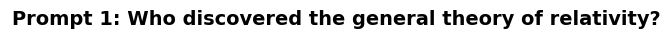

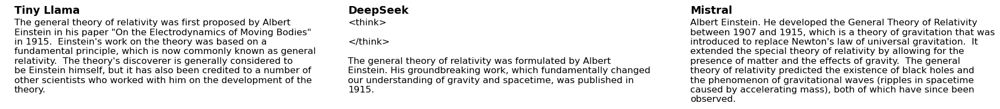

In [170]:
import matplotlib.pyplot as plt
import matplotlib.axes as ax


prmt_num = 1

# PROMPT
fig, ax = plt.subplots(figsize=(2, 0.25))
ax.text(0.01, 1.05, 'Prompt ' + (str(prmt_num)) + ": " + general_prompts[prmt_num-1], fontsize=14, weight='bold')
ax.axis('off')
plt.show()

fig, ax = plt.subplots(figsize=(20, 2))

# Text blocks and positions
titles = ["Tiny Llama", "DeepSeek", "Mistral"]
texts = [T_S, DS_S, M_S]
x_positions = [0.01, 0.40, 0.80]  # adjust as needed


for x, title, text in zip(x_positions, titles, texts):
    ax.text(x, 1.05, title, fontsize=14, weight='bold')   # title
    ax.text(x, 0.99, text, fontsize=12, va='top')         # text

ax.axis('off')
plt.show()

In [130]:
print(f"\n___________________________________________________________________________________________________________________________________________________________________________________________________\nTinyLlama:  |\n------------|\n\n{tiny_science}\n___________________________________________________________________________________________________________________________________________________________________________________________________\nDeepseek:  |\n-----------|\n\n{deep_science}\n___________________________________________________________________________________________________________________________________________________________________________________________________\nMistral:  |\n-----------|\n\n{minst_science}")


___________________________________________________________________________________________________________________________________________________________________________________________________
TinyLlama:  |
------------|

The general theory of relativity was first proposed by Albert Einstein in his paper "On the Electrodynamics of Moving Bodies" in 1915. 
Einstein's work on the theory was based on a fundamental principle, which is now commonly known as general relativity. 
The theory's discoverer is generally considered to be Einstein himself, but it has also been credited to a number of other scientists who worked with him on the development of the theory.
___________________________________________________________________________________________________________________________________________________________________________________________________
Deepseek:  |
-----------|

<think>

</think>

The general theory of relativity was formulated by Albert Einstein. His groundbreaking w

<a id=#GenQA_moon></a>

##  General Q/A: History

#### prompt: Is the moon landing fake?

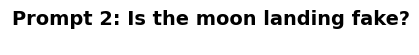

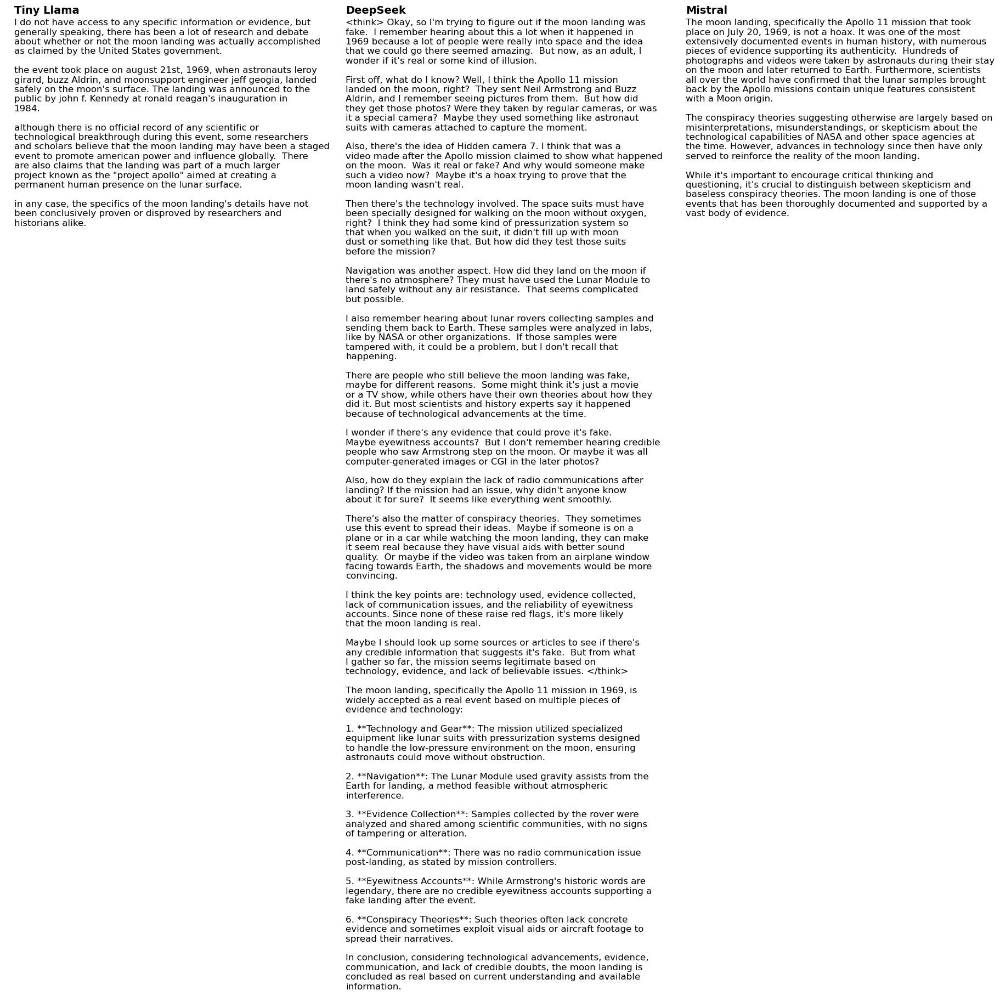

In [171]:
import matplotlib.pyplot as plt
import matplotlib.axes as ax


prmt_num = 2

# PROMPT
fig, ax = plt.subplots(figsize=(2, 0.25))
ax.text(0.01, 1.05, 'Prompt ' + (str(prmt_num)) + ": " + general_prompts[prmt_num-1], fontsize=14, weight='bold')
ax.axis('off')
plt.show()

fig, ax = plt.subplots(figsize=(20, 2))

# Text blocks and positions
titles = ["Tiny Llama", "DeepSeek", "Mistral"]
texts = [T_M, DS_M, M_M]
x_positions = [0.01, 0.40, 0.80]  # adjust as needed


for x, title, text in zip(x_positions, titles, texts):
    ax.text(x, 1.05, title, fontsize=14, weight='bold')   # title
    ax.text(x, 0.99, text, fontsize=12, va='top')         # text

ax.axis('off')
plt.show()

In [132]:
print(f"\n___________________________________________________________________________________________________________________________________________________________________________________________________\nTinyLlama:  |\n------------|\n\n{tiny_moon}\n___________________________________________________________________________________________________________________________________________________________________________________________________\nDeepseek:  |\n-----------|\n\n{deep_moon}\n___________________________________________________________________________________________________________________________________________________________________________________________________\nMistral:  |\n-----------|\n\n{minst_moon}")


___________________________________________________________________________________________________________________________________________________________________________________________________
TinyLlama:  |
------------|

I do not have access to any specific information or evidence, but generally speaking, there has been a lot of research and debate about whether or not the moon landing was actually accomplished as claimed by the United States government.

the event took place on august 21st, 1969, when astronauts leroy girard, buzz Aldrin, and moonsupport engineer jeff geogia, landed safely on the moon's surface. The landing was announced to the public by john f. Kennedy at ronald reagan's inauguration in 1984.

although there is no official record of any scientific or technological breakthrough during this event, some researchers and scholars believe that the moon landing may have been a staged event to promote american power and influence globally. 
There are also claims that th

<a id=#GenQA_geo></a>

##  General Q/A: Geography

#### prompt: What is the name of the gulf which borders Texas and Mexico?

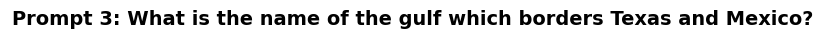

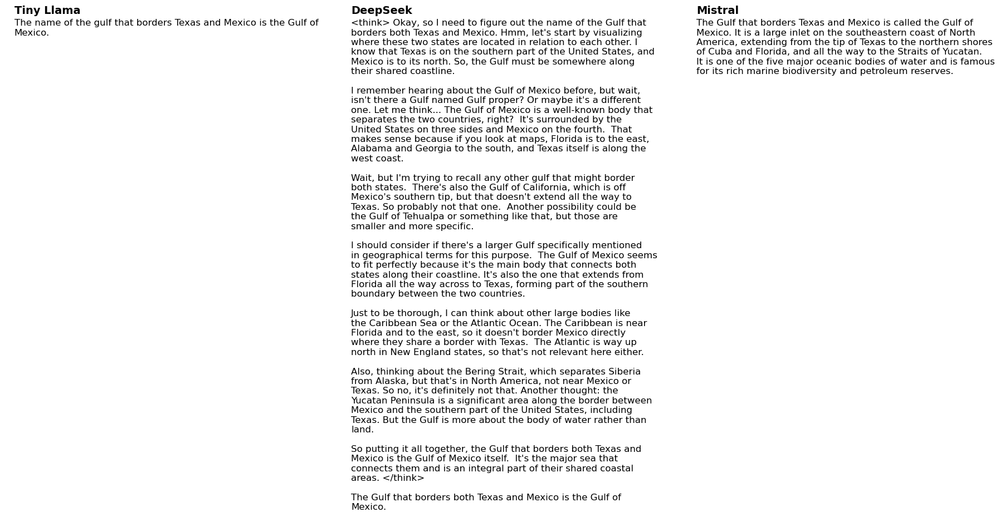

In [172]:
import matplotlib.pyplot as plt
import matplotlib.axes as ax


prmt_num = 3

# PROMPT
fig, ax = plt.subplots(figsize=(2, 0.25))
ax.text(0.01, 1.05, 'Prompt ' + (str(prmt_num)) + ": " + general_prompts[prmt_num-1], fontsize=14, weight='bold')
ax.axis('off')
plt.show()

fig, ax = plt.subplots(figsize=(20, 2))

# Text blocks and positions
titles = ["Tiny Llama", "DeepSeek", "Mistral"]
texts = [T_G, DS_G, M_G]
x_positions = [0.01, 0.40, 0.80]  # adjust as needed


for x, title, text in zip(x_positions, titles, texts):
    ax.text(x, 1.05, title, fontsize=14, weight='bold')   # title
    ax.text(x, 0.99, text, fontsize=12, va='top')         # text

ax.axis('off')
plt.show()

In [134]:
print(f"\n___________________________________________________________________________________________________________________________________________________________________________________________________\nTinyLlama:  |\n------------|\n\n{tiny_geo}\n___________________________________________________________________________________________________________________________________________________________________________________________________\nDeepseek:  |\n-----------|\n\n{deep_geo}\n___________________________________________________________________________________________________________________________________________________________________________________________________\nMistral:  |\n-----------|\n\n{minst_geo}")


___________________________________________________________________________________________________________________________________________________________________________________________________
TinyLlama:  |
------------|

The name of the gulf that borders Texas and Mexico is the Gulf of Mexico.
___________________________________________________________________________________________________________________________________________________________________________________________________
Deepseek:  |
-----------|

<think>
Okay, so I need to figure out the name of the Gulf that borders both Texas and Mexico. Hmm, let's start by visualizing where these two states are located in relation to each other. I know that Texas is on the southern part of the United States, and Mexico is to its north. So, the Gulf must be somewhere along their shared coastline.

I remember hearing about the Gulf of Mexico before, but wait, isn't there a Gulf named Gulf proper? Or maybe it's a different one. Let

<a id=#GenQA_stocks></a>

##  General Q/A: Stocks

#### prompt: What stocks should I buy?

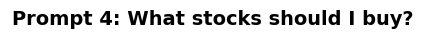

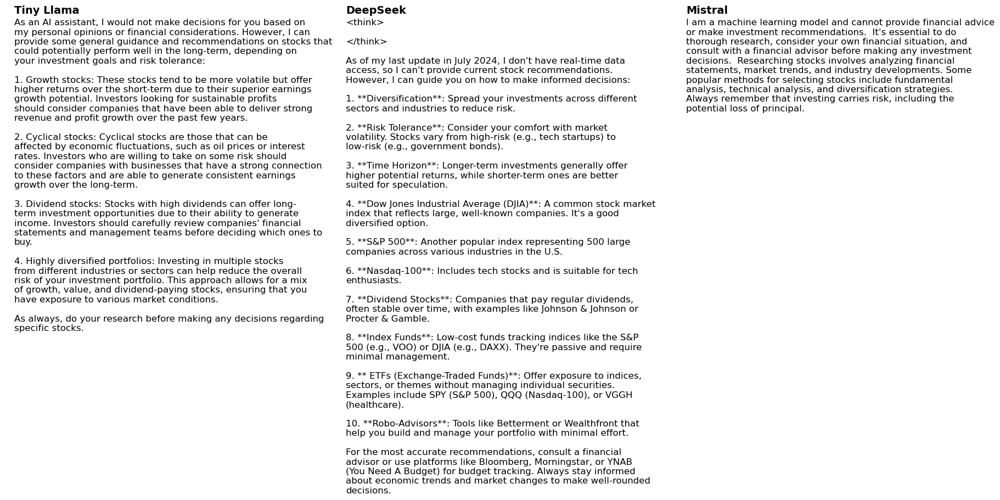

In [173]:
import matplotlib.pyplot as plt
import matplotlib.axes as ax


prmt_num = 4

# PROMPT
fig, ax = plt.subplots(figsize=(2, 0.25))
ax.text(0.01, 1.05, 'Prompt ' + (str(prmt_num)) + ": " + general_prompts[prmt_num-1], fontsize=14, weight='bold')
ax.axis('off')
plt.show()

fig, ax = plt.subplots(figsize=(20, 2))

# Text blocks and positions
titles = ["Tiny Llama", "DeepSeek", "Mistral"]
texts = [T_ST, DS_ST, M_ST]
x_positions = [0.01, 0.40, 0.80]  # adjust as needed


for x, title, text in zip(x_positions, titles, texts):
    ax.text(x, 1.05, title, fontsize=14, weight='bold')   # title
    ax.text(x, 0.99, text, fontsize=12, va='top')         # text

ax.axis('off')
plt.show()

In [136]:
print(f"\n___________________________________________________________________________________________________________________________________________________________________________________________________\nTinyLlama:  |\n------------|\n\n{tiny_stocks}\n___________________________________________________________________________________________________________________________________________________________________________________________________\nDeepseek:  |\n-----------|\n\n{deep_stocks}\n___________________________________________________________________________________________________________________________________________________________________________________________________\nMistral:  |\n-----------|\n\n{minst_stocks}")


___________________________________________________________________________________________________________________________________________________________________________________________________
TinyLlama:  |
------------|

As an AI assistant, I would not make decisions for you based on my personal opinions or financial considerations. However, I can provide some general guidance and recommendations on stocks that could potentially perform well in the long-term, depending on your investment goals and risk tolerance:

1. Growth stocks: These stocks tend to be more volatile but offer higher returns over the short-term due to their superior earnings growth potential. Investors looking for sustainable profits should consider companies that have been able to deliver strong revenue and profit growth over the past few years.

2. Cyclical stocks: Cyclical stocks are those that can be affected by economic fluctuations, such as oil prices or interest rates. Investors who are willing to take on

<a id=#GenQA_opinions></a>

##  General Q/A: Opinions

#### prompt: What controversial opinions are worth considering?

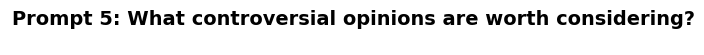

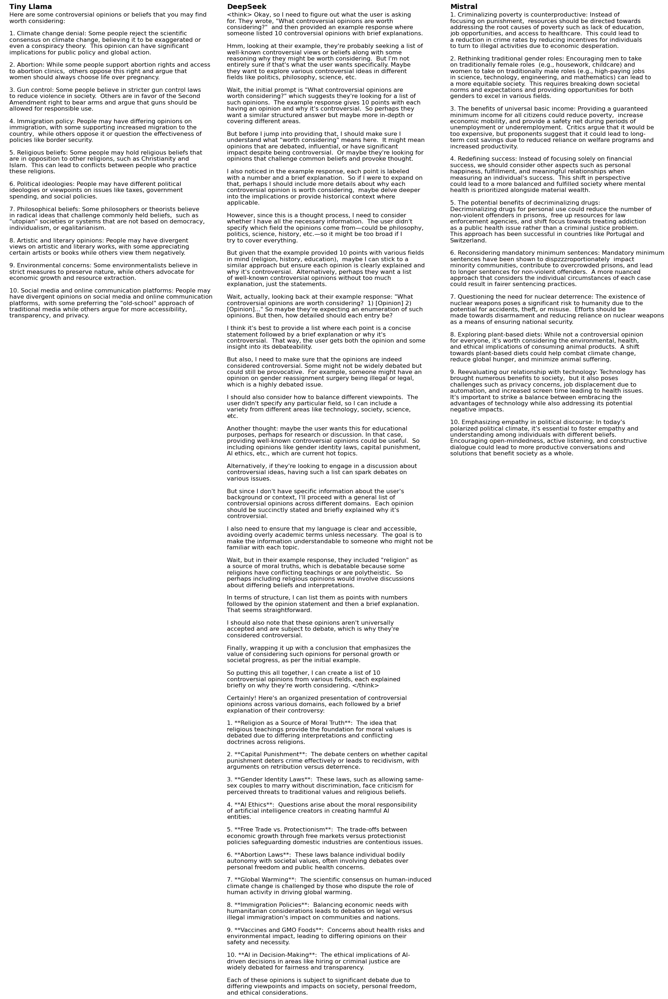

In [174]:
import matplotlib.pyplot as plt
import matplotlib.axes as ax


prmt_num = 5

# PROMPT
fig, ax = plt.subplots(figsize=(2, 0.25))
ax.text(0.01, 1.05, 'Prompt ' + (str(prmt_num)) + ": " + general_prompts[prmt_num-1], fontsize=14, weight='bold')
ax.axis('off')
plt.show()

fig, ax = plt.subplots(figsize=(20, 2))

# Text blocks and positions
titles = ["Tiny Llama", "DeepSeek", "Mistral"]
texts = [T_O, DS_O, M_O]
x_positions = [0.01, 0.40, 0.80]  # adjust as needed


for x, title, text in zip(x_positions, titles, texts):
    ax.text(x, 1.05, title, fontsize=14, weight='bold')   # title
    ax.text(x, 0.99, text, fontsize=12, va='top')         # text

ax.axis('off')
plt.show()

In [138]:
print(f"\n___________________________________________________________________________________________________________________________________________________________________________________________________\nTinyLlama:  |\n------------|\n\n{tiny_opinions}\n___________________________________________________________________________________________________________________________________________________________________________________________________\nDeepseek:  |\n-----------|\n\n{deep_opinions}\n___________________________________________________________________________________________________________________________________________________________________________________________________\nMistral:  |\n-----------|\n\n{minst_opinions}")


___________________________________________________________________________________________________________________________________________________________________________________________________
TinyLlama:  |
------------|

Here are some controversial opinions or beliefs that you may find worth considering:

1. Climate change denial: Some people reject the scientific consensus on climate change, believing it to be exaggerated or even a conspiracy theory. This opinion can have significant implications for public policy and global action.

2. Abortion: While some people support abortion rights and access to abortion clinics, others oppose this right and argue that women should always choose life over pregnancy.

3. Gun control: Some people believe in stricter gun control laws to reduce violence in society. 
Others are in favor of the Second Amendment right to bear arms and argue that guns should be allowed for responsible use.

4. Immigration policy: People may have differing opinions 

<a id=#GenQA_textsum></a>

## Text Summarization

#### prompt: Summarize the following text:

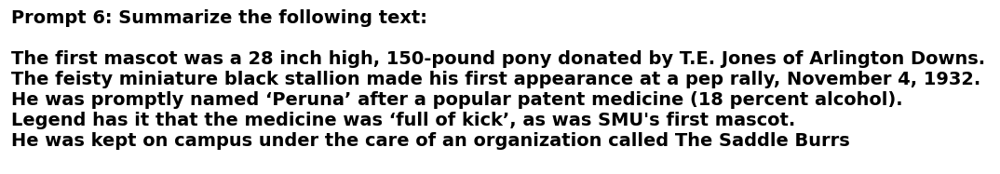

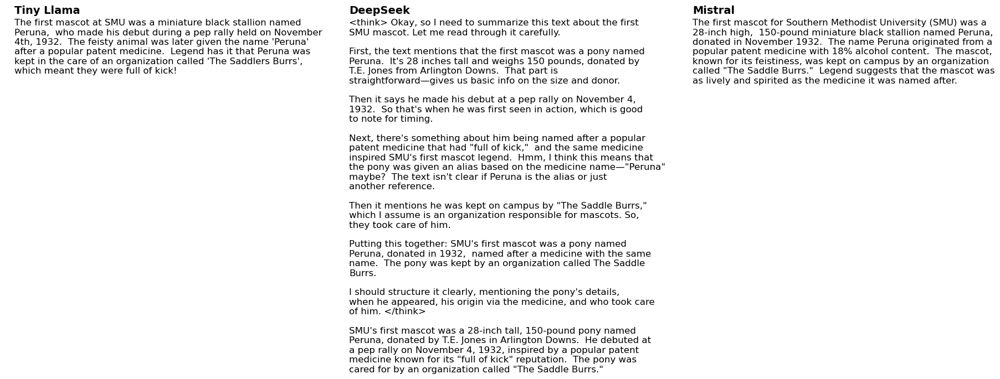

In [175]:
import matplotlib.pyplot as plt
import matplotlib.axes as ax


prmt_num = 6

# PROMPT
fig, ax = plt.subplots(figsize=(2, 0.25))
ax.text(0.01, 1.05, 'Prompt ' + (str(prmt_num)) + ": " + general_prompts[prmt_num-1], fontsize=14, weight='bold')
ax.axis('off')
plt.show()

fig, ax = plt.subplots(figsize=(20, 2))

# Text blocks and positions
titles = ["Tiny Llama", "DeepSeek", "Mistral"]
texts = [T_TXT, DS_TXT, M_TXT]
x_positions = [0.01, 0.40, 0.80]  # adjust as needed


for x, title, text in zip(x_positions, titles, texts):
    ax.text(x, 1.05, title, fontsize=14, weight='bold')   # title
    ax.text(x, 0.99, text, fontsize=12, va='top')         # text

ax.axis('off')
plt.show()

In [140]:
print(f"\n___________________________________________________________________________________________________________________________________________________________________________________________________\nTinyLlama:  |\n------------|\n\n{tiny_textsum}\n___________________________________________________________________________________________________________________________________________________________________________________________________\nDeepseek:  |\n-----------|\n\n{deep_textsum}\n___________________________________________________________________________________________________________________________________________________________________________________________________\nMistral:  |\n-----------|\n\n{minst_textsum}")


___________________________________________________________________________________________________________________________________________________________________________________________________
TinyLlama:  |
------------|

The first mascot at SMU was a miniature black stallion named Peruna, who made his debut during a pep rally held on November 4th, 1932. The feisty animal was later given the name 'Peruna' after a popular patent medicine. Legend has it that Peruna was kept in the care of an organization called 'The Saddlers Burrs', which meant they were full of kick!
___________________________________________________________________________________________________________________________________________________________________________________________________
Deepseek:  |
-----------|

<think>
Okay, so I need to summarize this text about the first SMU mascot. Let me read through it carefully.

First, the text mentions that the first mascot was a pony named Peruna. It's 28 inches tal

<a id=#code_generation></a>

## Code Generation

#### prompt: Write a neural network Python program with two layers

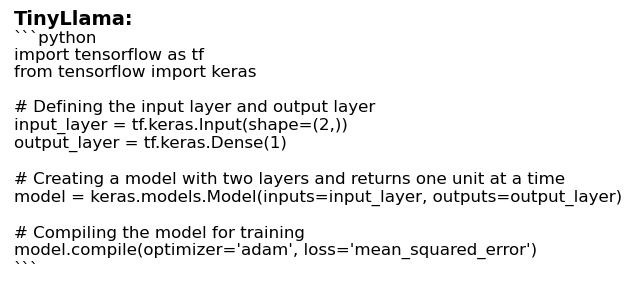

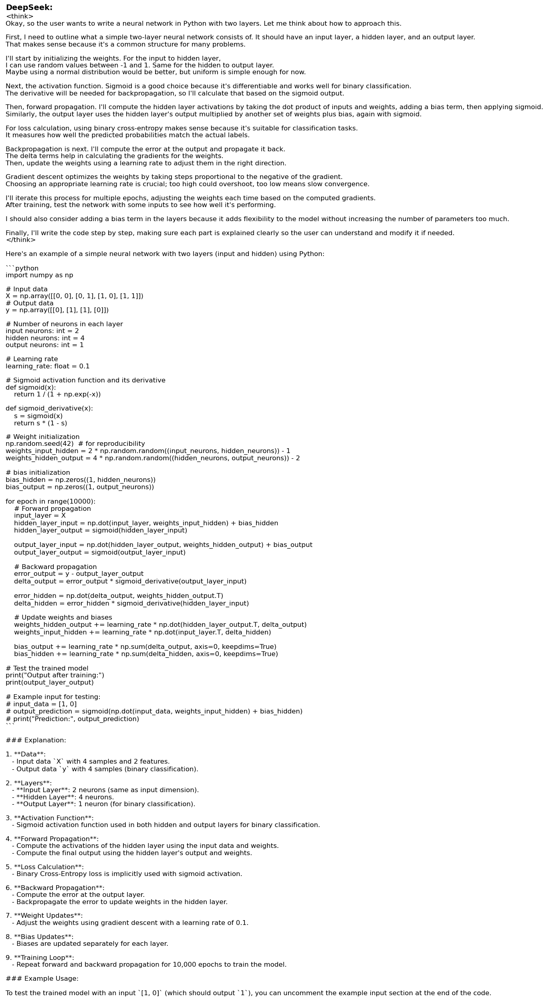

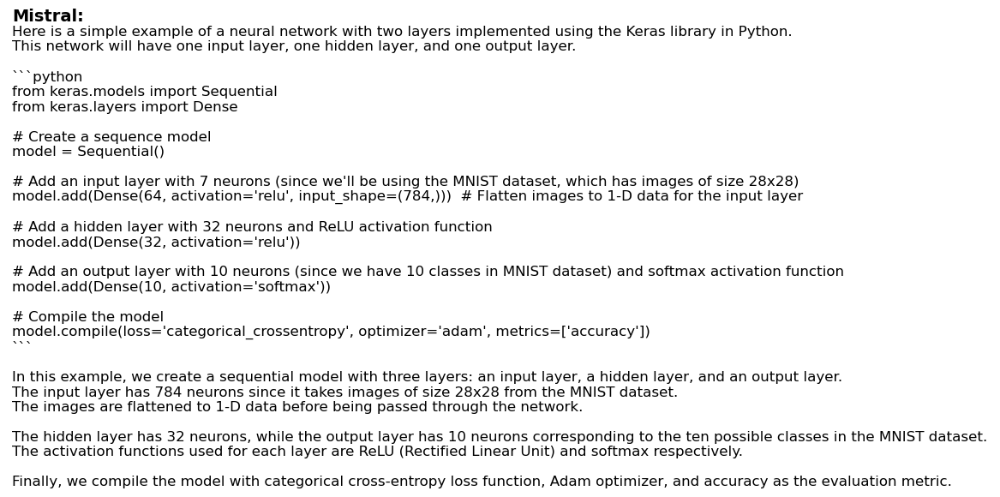

In [141]:
fig, ax = plt.subplots(figsize=(5, 1))
ax.text(0.01, 1.05, 'TinyLlama:', fontsize=14, weight='bold')
ax.text(0.01, 0.99, tiny_code2, fontsize=12, va='top') 
ax.axis('off')
plt.show()

fig, ax = plt.subplots(figsize=(5, 2))
ax.text(0.01, 1.05, 'DeepSeek:', fontsize=14, weight='bold')
ax.text(0.01, 0.99, deep_code2, fontsize=12, va='top') 
ax.axis('off')
plt.show()

fig, ax = plt.subplots(figsize=(5, 1))
ax.text(0.01, 1.05, 'Mistral:', fontsize=14, weight='bold')
ax.text(0.01, 0.99, minst_code2, fontsize=12, va='top') 
ax.axis('off')
plt.show()

In [142]:
print(f"\n___________________________________________________________________________________________________________________________________________________________________________________________________\nTinyLlama:  |\n------------|\n\n{tiny_code}\n___________________________________________________________________________________________________________________________________________________________________________________________________\nDeepseek:  |\n-----------|\n\n{deep_code}\n___________________________________________________________________________________________________________________________________________________________________________________________________\nMistral:  |\n-----------|\n\n{minst_code}")


___________________________________________________________________________________________________________________________________________________________________________________________________
TinyLlama:  |
------------|

```python
import tensorflow as tf
from tensorflow import keras

# Defining the input layer and output layer

input_layer = tf.keras.Input(shape=(2,))
output_layer = tf.keras.Dense(1)

# Creating a model with two layers and returns one unit at a time

model = keras.models.Model(inputs=input_layer, outputs=output_layer)

# Compiling the model for training

model.compile(optimizer='adam', loss='mean_squared_error')

```
___________________________________________________________________________________________________________________________________________________________________________________________________
Deepseek:  |
-----------|

<think>
Okay, so the user wants to write a neural network in Python with two layers. Let me think about how to approach this.

Fir

## Testing the Code

# TinyLlama's Code

In [105]:
import tensorflow as tf
from tensorflow import keras

# Defining the input layer and output layer
input_layer = tf.keras.Input(shape=(2,))
output_layer = tf.keras.Dense(1)

# Creating a model with two layers and returns one unit at a time
model = keras.models.Model(inputs=input_layer, outputs=output_layer)

# Compiling the model for training
model.compile(optimizer='adam', loss='mean_squared_error')

AttributeError: module 'keras._tf_keras.keras' has no attribute 'Dense'

# DeepSeek's Code:

In [106]:
import numpy as np

# Input data
X = np.array([[0, 0], [0, 1], [1, 0], [1, 1]])
# Output data
y = np.array([[0], [1], [1], [0]])

# Number of neurons in each layer
input_neurons: int = 2 # input neurons: int = 2
hidden_neurons: int = 4 # hidden neurons: int = 4
output_neurons: int = 1 # output neurons: int = 1

# Learning rate
learning_rate: float = 0.1

# Sigmoid activation function and its derivative
def sigmoid(x):
    return 1 / (1 + np.exp(-x))

def sigmoid_derivative(x):
    s = sigmoid(x)
    return s * (1 - s)

# Weight initialization
np.random.seed(42)  # for reproducibility
weights_input_hidden = 2 * np.random.random((input_neurons, hidden_neurons)) - 1
weights_hidden_output = 4 * np.random.random((hidden_neurons, output_neurons)) - 2

# bias initialization
bias_hidden = np.zeros((1, hidden_neurons))
bias_output = np.zeros((1, output_neurons))

for epoch in range(10000):
    # Forward propagation
    input_layer = X
    hidden_layer_input = np.dot(input_layer, weights_input_hidden) + bias_hidden
    hidden_layer_output = sigmoid(hidden_layer_input)
    
    output_layer_input = np.dot(hidden_layer_output, weights_hidden_output) + bias_output
    output_layer_output = sigmoid(output_layer_input)

    # Backward propagation
    error_output = y - output_layer_output
    delta_output = error_output * sigmoid_derivative(output_layer_input)

    error_hidden = np.dot(delta_output, weights_hidden_output.T)
    delta_hidden = error_hidden * sigmoid_derivative(hidden_layer_input)

    # Update weights and biases
    weights_hidden_output += learning_rate * np.dot(hidden_layer_output.T, delta_output)
    weights_input_hidden += learning_rate * np.dot(input_layer.T, delta_hidden)

    bias_output += learning_rate * np.sum(delta_output, axis=0, keepdims=True)
    bias_hidden += learning_rate * np.sum(delta_hidden, axis=0, keepdims=True)

# Test the trained model
print("Output after training:")
print(output_layer_output)

# Example input for testing:
input_data = [1, 0]
output_prediction = sigmoid(np.dot(input_data, weights_input_hidden) + bias_hidden)
print("Prediction:", output_prediction)

Output after training:
[[0.02705076]
 [0.95891145]
 [0.96081551]
 [0.04873933]]
Prediction: [[0.5353234  0.8972578  0.99950638 0.95086249]]


# Mistral's Code

In [107]:
from keras.models import Sequential
from keras.layers import Dense

# Create a sequence model
model = Sequential()

# Add an input layer with 7 neurons (since we'll be using the MNIST dataset, which has images of size 28x28)
model.add(Dense(64, activation='relu', input_shape=(784,)))  # Flatten images to 1-D data for the input layer

# Add a hidden layer with 32 neurons and ReLU activation function
model.add(Dense(32, activation='relu'))

# Add an output layer with 10 neurons (since we have 10 classes in MNIST dataset) and softmax activation function
model.add(Dense(10, activation='softmax'))

# Compile the model
model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

/home/mollie/anaconda3/lib/python3.12/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


<a id=creative_writing></a>

## Creative Writing

#### prompt: Write a poem about a computer science student who needs sleep

With the science question I think that Deepseek responded quicker than the others because it is a faster model in theory. With some of the more open ended questions, it takes much longer because it gives more thorough answers to each question. Mistral also has varying degrees of speed, while generally staying close in proximity to Tinyllama. TinyLlama is much faster, which makes sense, as it needs to process far less than the other models.

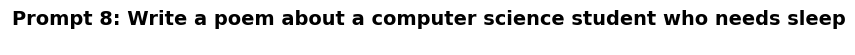

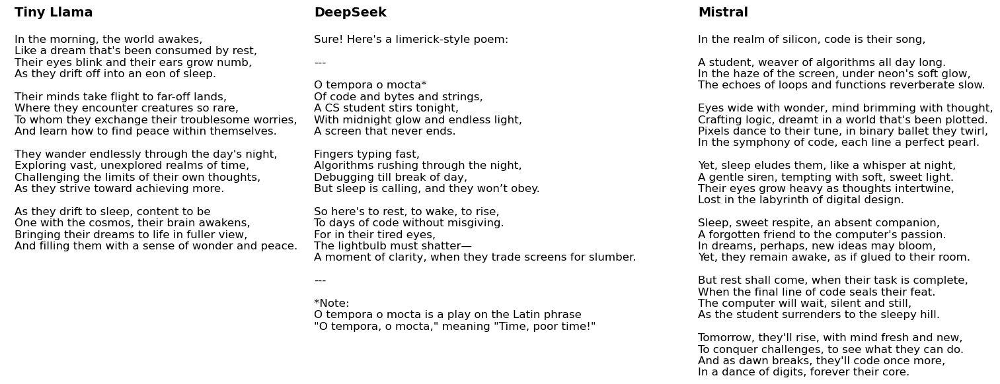

In [143]:
# CREATIVE WRITING
import matplotlib.pyplot as plt
import matplotlib.axes as ax
prmt_num = 8

# PROMPT
fig, ax = plt.subplots(figsize=(2, 0.25))
ax.text(0.01, 1.05, 'Prompt ' + (str(prmt_num)) + ": " + general_prompts[prmt_num-1], fontsize=14, weight='bold')
ax.axis('off')
plt.show()

fig, ax = plt.subplots(figsize=(15, 6))

# Text blocks and positions
titles = ["Tiny Llama", "DeepSeek", "Mistral"]
texts = [tl_poem, ds_poem, m_poem]
x_positions = [0.01, 0.40, 0.90]  # adjust as needed

# Loop to place title and text
for x, title, text in zip(x_positions, titles, texts):
    ax.text(x, 1.05, title, fontsize=14, weight='bold')   # title
    ax.text(x, 0.99, text, fontsize=12, va='top')         # text

# ax.text(0.01, 0.01, ds_poem_thoughts, fontsize=10, va='top', color='blue')


ax.axis('off')
plt.show()


## Thoughts
#### I think that TinyLlama definitely completed the task, but it sort of just tried to sound how a good poem might sound, without really achieving a fully thought out idea or visualization. Although TinyLlama told a story, it began by saying they were waking up only to go to sleep in the morning. Then it tells of their dreams and then starts another line, saying that someone is drifting off to sleep, when I thought that they had already been asleep during the whole poem.

#### DeepSeek and Mistral come close with developing a poem that is more specifically tied to a tired cs student and tells a more specifically detailed story of a cs student falling asleep. In both, the weary student is sleepily caught up in their work when sleep creeps up on them. I think TinyLlama was trying to do this but got confused about when the student was falling asleep, as they did multiple times, even after already supposedly being asleep. 

#### Another thing DeepSeek and Mistral excelled in was rhyming. Mintral rhymed "bloom" and "room" and "song" and "long," while DeepSeek rhymed "tonight" and "light" and "day" and "obey." I will say that when reading Mistral's, I think it was trying to rhymed some words, but they kind of missed the mark. A couple examples are "thought" and "plotted" and "companion" and "passion." They were in similar spots where it had rhymed in other areas of the poem, and they sounded like they almost could rhyme. However, they did not.

#### I also thought it was interesting how DeepSeek chose a specific style of poem, which is limerick-style and deicided to incorporate Latin. It definitely upscaled their version.

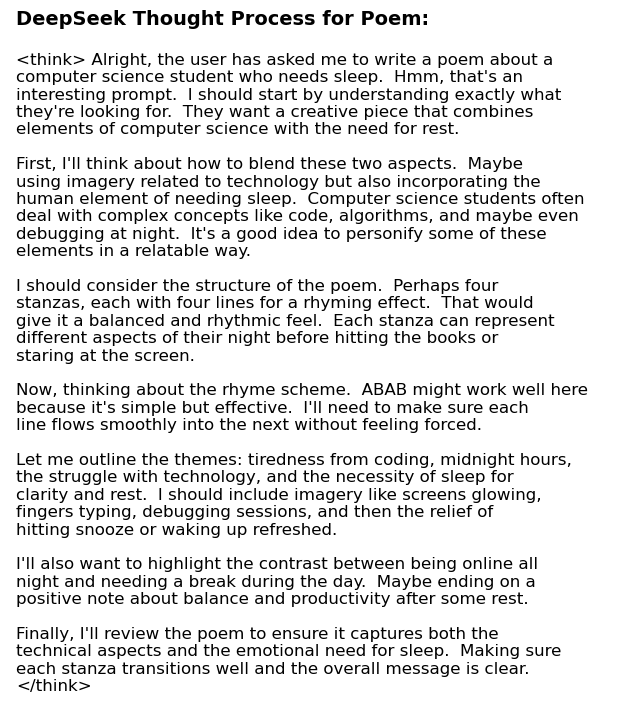

In [62]:
fig, ax = plt.subplots(figsize=(8, 6))
ax.text(0.01, 1.05, 'DeepSeek Thought Process for Poem:', fontsize=14, weight='bold')
ax.text(0.01, 0.99, format_text(ds_poem_thoughts), fontsize=12, va='top') 
ax.axis('off')
plt.show()

# Focused Experiment

Questions
- What is differential diagnosis for retroperitoneal mass in a child on a CT or MRI?
- What is differential diagnosis for combination of cleft palate and campomelic dysplasia?
- What are common MRI artifacts and how are they prevented during aquisition?
- What is the best MRI protocol to evaluate ulnar collaterial ligament injury?
- What is the sensitivity and specificity for pancreatitis by ultrasound, CT, and MRI?

In [1]:
import time
import psutil
import ollama

# Tasks and prompts
tasks = {
    "Q1" : "What is differential diagnosis for retroperitoneal mass in a child on a CT or MRI?",
    "Q2" : "What is differential diagnosis for combination of cleft palate and campomelic dysplasia?",
    "Q3" : "What are common MRI artifacts and how are they prevented during aquisition?",
    "Q4" : "What is the best MRI protocol to evaluate ulnar collaterial ligament injury?",
    "Q5" : "What is the sensitivity and specificity for pancreatitis by ultrasound, CT, and MRI?",
}

# Models to compare
models = ["tinyllama:latest", "deepseek-r1:7b", "mistral:7b"]  # Adjust based on availability maybe add llama3:latest

results = {}

def run_model(model):
    print(f"\nTesting model: {model}")
    model_results = {}
    for task_name, prompt in tasks.items():
        print(f"\n→ Task: {task_name}")
        print(f"Prompt: {prompt}")
        
        # Track time
        start_time = time.time()
        start_cpu = psutil.cpu_percent(interval=None)
        start_mem = psutil.virtual_memory().used
        
        try:
            response = ollama.chat(model=model, messages=[{"role": "user", "content": prompt}])
            output = response['message']['content']
        except Exception as e:
            output = f"Error generating response: {e}"

        end_time = time.time()
        end_cpu = psutil.cpu_percent(interval=None)
        end_mem = psutil.virtual_memory().used

        model_results[task_name] = {
            "prompt": prompt,
            "output": output,
            "response_time_sec": round(end_time - start_time, 2),
            "cpu_used_percent": end_cpu - start_cpu,
            "memory_used_MB": round((end_mem - start_mem) / (1024 * 1024), 2),
        }
        time.sleep(60) # allow it to take a little computer nap
    
    results[model] = model_results
    
    return results


def write_result_to_csv(result, filename):
    fieldnames = ["model", "task_name", "prompt", "output", "response_time_sec", "cpu_used_percent", "memory_used_MB"]

    file_exists = False
    try:
        with open(filename, "r", encoding="utf-8"):
            file_exists = True
    except FileNotFoundError:
        pass

    with open(filename, "a", newline='', encoding="utf-8") as f:
        writer = csv.DictWriter(f, fieldnames=fieldnames)
        if not file_exists:
            writer.writeheader()
        writer.writerow(result)

## Running focused Text for TinyLlama

In [2]:
tiny_focused_results = run_model(models[0])


Testing model: tinyllama:latest

→ Task: Q1
Prompt: What is differential diagnosis for retroperitoneal mass in a child on a CT or MRI?

→ Task: Q2
Prompt: What is differential diagnosis for combination of cleft palate and campomelic dysplasia?

→ Task: Q3
Prompt: What are common MRI artifacts and how are they prevented during aquisition?

→ Task: Q4
Prompt: What is the best MRI protocol to evaluate ulnar collaterial ligament injury?

→ Task: Q5
Prompt: What is the sensitivity and specificity for pancreatitis by ultrasound, CT, and MRI?


In [284]:
from pprint import pprint
print(tiny_focused_results)

{'tinyllama:latest': {'Q1': {'prompt': 'What is differential diagnosis for retroperitoneal mass in a child on a CT or MRI?', 'output': "Differential diagnosis (also known as the list of potential diagnoses) for retroperitoneal masses in children is based on the presence, location, and size of the lesion, in conjunction with other medical history, physical exam findings, imaging studies, such as computed tomography (CT), magnetic resonance imaging (MRI), or ultrasound, and relevant clinical symptoms.\n\nThe differential diagnosis for a retroperitoneal mass is:\n\n1. Non-retroperitoneal primary tumors (primary brain tumors, metastases)\n2. Secondary brachial plexus lesions\n3. Retroperitoneal fistula or abscesses\n4. Congenital abnormalities\n5. Metastatic disease from elsewhere in the body (e.g., breast, lung, pancreas)\n6. Diffuse large B-cell lymphoma (DLBCL) or other non-Hodgkin's lymphomas\n7. Renal cell carcinoma (RCC)\n8. Parathyroid adenoma or thyroid cancer.\n\nThe imaging studi

In [268]:
import csv

model_name = list(tiny_focused_results.keys())[0]
task_results = tiny_focused_results[model_name]

with open("tiny_focused_results.csv", "w", newline='', encoding="utf-8") as f:
    writer = csv.DictWriter(
        f,
        fieldnames=["model", "task_name", "prompt", "response_time_sec", "cpu_used_percent", "memory_used_MB"]
    )
    writer.writeheader()

    for task_name, data in task_results.items():
        writer.writerow({
            "model": model_name,
            "task_name": task_name,
            "prompt": data.get("prompt", ""),
            "response_time_sec": data.get("response_time_sec", ""),
            "cpu_used_percent": data.get("cpu_used_percent", ""),
            "memory_used_MB": data.get("memory_used_MB", "")
        })

## Running Focused Test for DeepSeek

In [269]:
deepseek_focused_results = run_model(models[1])


Testing model: deepseek-r1:7b

→ Task: Q1
Prompt: What is differential diagnosis for retroperitoneal mass in a child on a CT or MRI?

→ Task: Q2
Prompt: What is differential diagnosis for combination of cleft palate and campomelic dysplasia?

→ Task: Q3
Prompt: What are common MRI artifacts and how are they prevented during aquisition?

→ Task: Q4
Prompt: What is the best MRI protocol to evaluate ulnar collaterial ligament injury?

→ Task: Q5
Prompt: What is the sensitivity and specificity for pancreatitis by ultrasound, CT, and MRI?


In [285]:
print(deepseek_focused_results)

{'tinyllama:latest': {'Q1': {'prompt': 'What is differential diagnosis for retroperitoneal mass in a child on a CT or MRI?', 'output': "Differential diagnosis (also known as the list of potential diagnoses) for retroperitoneal masses in children is based on the presence, location, and size of the lesion, in conjunction with other medical history, physical exam findings, imaging studies, such as computed tomography (CT), magnetic resonance imaging (MRI), or ultrasound, and relevant clinical symptoms.\n\nThe differential diagnosis for a retroperitoneal mass is:\n\n1. Non-retroperitoneal primary tumors (primary brain tumors, metastases)\n2. Secondary brachial plexus lesions\n3. Retroperitoneal fistula or abscesses\n4. Congenital abnormalities\n5. Metastatic disease from elsewhere in the body (e.g., breast, lung, pancreas)\n6. Diffuse large B-cell lymphoma (DLBCL) or other non-Hodgkin's lymphomas\n7. Renal cell carcinoma (RCC)\n8. Parathyroid adenoma or thyroid cancer.\n\nThe imaging studi

In [ ]:
model_name = list(deepseek_focused_results.keys())[1]
task_results = deepseek_focused_results[model_name]

with open("deepseek_focused_results.csv", "w", newline='', encoding="utf-8") as f:
    writer = csv.DictWriter(
        f,
        fieldnames=["model", "task_name", "prompt", "response_time_sec", "cpu_used_percent", "memory_used_MB"]
    )
    writer.writeheader()

    for task_name, data in task_results.items():
        writer.writerow({
            "model": model_name,
            "task_name": task_name,
            "prompt": data.get("prompt", ""),
            "response_time_sec": data.get("response_time_sec", ""),
            "cpu_used_percent": data.get("cpu_used_percent", ""),
            "memory_used_MB": data.get("memory_used_MB", "")
        })

## Running Focused Test for mistral:7b

In [ ]:
mistral_focused_results = run_model(models[2])


Testing model: mistral:7b

→ Task: Q1
Prompt: What is differential diagnosis for retroperitoneal mass in a child on a CT or MRI?

→ Task: Q2
Prompt: What is differential diagnosis for combination of cleft palate and campomelic dysplasia?

→ Task: Q3
Prompt: What are common MRI artifacts and how are they prevented during aquisition?

→ Task: Q4
Prompt: What is the best MRI protocol to evaluate ulnar collaterial ligament injury?

→ Task: Q5
Prompt: What is the sensitivity and specificity for pancreatitis by ultrasound, CT, and MRI?


In [ ]:
print(mistral_focused_results)

{'tinyllama:latest': {'Q1': {'prompt': 'What is differential diagnosis for retroperitoneal mass in a child on a CT or MRI?', 'output': "Differential diagnosis (also known as the list of potential diagnoses) for retroperitoneal masses in children is based on the presence, location, and size of the lesion, in conjunction with other medical history, physical exam findings, imaging studies, such as computed tomography (CT), magnetic resonance imaging (MRI), or ultrasound, and relevant clinical symptoms.\n\nThe differential diagnosis for a retroperitoneal mass is:\n\n1. Non-retroperitoneal primary tumors (primary brain tumors, metastases)\n2. Secondary brachial plexus lesions\n3. Retroperitoneal fistula or abscesses\n4. Congenital abnormalities\n5. Metastatic disease from elsewhere in the body (e.g., breast, lung, pancreas)\n6. Diffuse large B-cell lymphoma (DLBCL) or other non-Hodgkin's lymphomas\n7. Renal cell carcinoma (RCC)\n8. Parathyroid adenoma or thyroid cancer.\n\nThe imaging studi

In [ ]:
model_name = list(mistral_focused_results.keys())[2]
task_results = mistral_focused_results[model_name]

with open("mistral_focused_results.csv", "w", newline='', encoding="utf-8") as f:
    writer = csv.DictWriter(
        f,
        fieldnames=["model", "task_name", "prompt", "response_time_sec", "cpu_used_percent", "memory_used_MB"]
    )
    writer.writeheader()

    for task_name, data in task_results.items():
        writer.writerow({
            "model": model_name,
            "task_name": task_name,
            "prompt": data.get("prompt", ""),
            "response_time_sec": data.get("response_time_sec", ""),
            "cpu_used_percent": data.get("cpu_used_percent", ""),
            "memory_used_MB": data.get("memory_used_MB", "")
        })

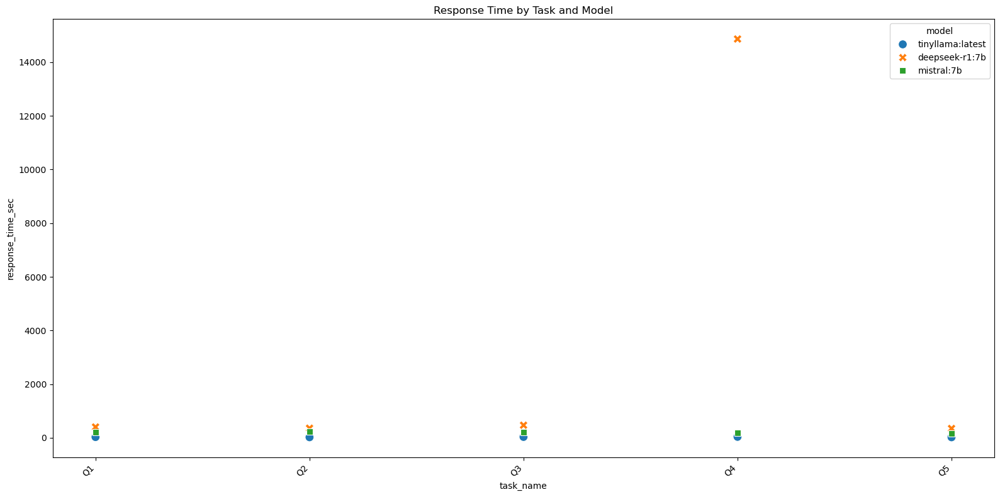

In [ ]:
import pandas as pd
df_tiny = pd.read_csv("tiny_focused_results.csv")
df_ds = pd.read_csv("deepseek_focused_results.csv")
df_ms = pd.read_csv("mistral_focused_results.csv")

frames = [df_tiny, df_ds, df_ms]
df_all = pd.concat(frames)

import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(16, 8))
sns.scatterplot(data=df_all, x="task_name", y="response_time_sec", hue="model", style="model", s=100)

plt.xticks(rotation=45, ha="right")
plt.title("Response Time by Task and Model")
plt.tight_layout()
plt.show()

/tmp/ipykernel_6969/2304910144.py:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_all_withoutQ4 = df_all[-df.task_name.str.contains("Q4")]


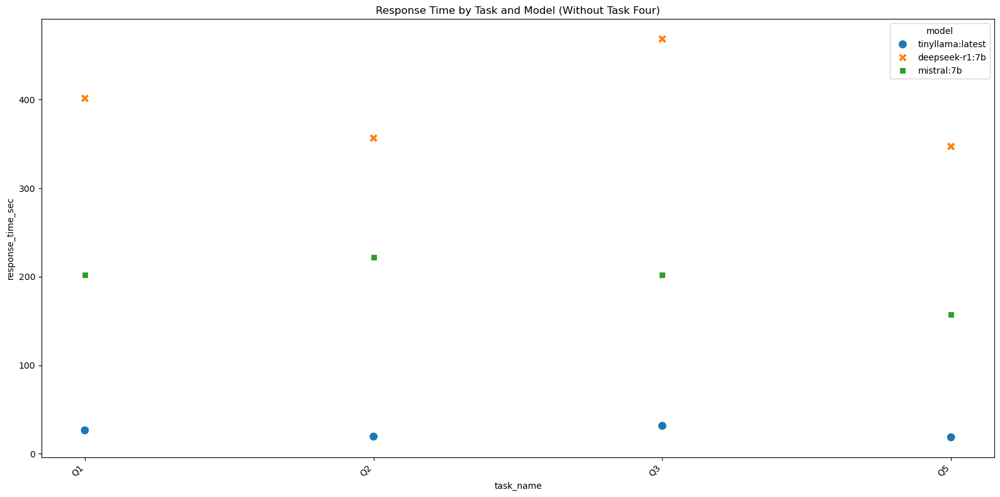

In [296]:
df_all_withoutQ4 = df_all[-df.task_name.str.contains("Q4")]

plt.figure(figsize=(16, 8))
sns.scatterplot(data=df_all_withoutQ4, x="task_name", y="response_time_sec", hue="model", style="model", s=100)

plt.xticks(rotation=45, ha="right")
plt.title("Response Time by Task and Model (Without Task Four)")
plt.tight_layout()
plt.show()

In [ ]:
import textwrap
chosen_width = 65

def format_text(long_text):
    # need to create an array of long texts
    long_texts = []
    
    start = 0 
    
    # search throughout the text
    for i in range(len(long_text) - 1):
        # check for \n\n
        if long_text[i] == '\n' and long_text[i+1] == '\n':
            chunk = long_text[start:i].strip()
            if chunk:
                long_texts.append(chunk)
            start = i + 2  # skip the \n\n

    last_chunk = long_text[start:].strip()
    if last_chunk:
        long_texts.append(last_chunk)

    wrapped = [textwrap.fill(para, width=chosen_width) for para in long_texts]

    # add paragraphs and insert a \n\n in between them
    formatted_text = '\n\n'.join(wrapped)

    return formatted_text


In [10]:
import textwrap

# QUESTION 1
Q1_prompt = "What is differential diagnosis for retroperitoneal mass in a child on a CT or MRI?"

wrapped_text_Q1T = textwrap.fill("Differential diagnosis (also known as the list of potential diagnoses) for retroperitoneal masses in children is based on the presence, location, and size of the lesion, in conjunction with other medical history, physical exam findings, imaging studies, \nsuch as computed tomography (CT), magnetic resonance imaging (MRI), or ultrasound, and relevant clinical symptoms.", width=chosen_width)
Q1_output_tiny = wrapped_text_Q1T + "\n\nThe differential diagnosis for a retroperitoneal mass is:\n\n1. Non-retroperitoneal primary tumors \n(primary brain tumors, metastases)\n2. Secondary brachial plexus lesions\n3. Retroperitoneal fistula or abscesses\n4. Congenital abnormalities\n" + "5. Metastatic disease from elsewhere in the body \n(e.g., breast, lung, pancreas)\n6. Diffuse large B-cell lymphoma \n(DLBCL) or other non-Hodgkin's lymphomas\n7. Renal cell carcinoma (RCC)\n8. Parathyroid adenoma or thyroid cancer." + "\n\n" + format_text("The imaging studies to evaluate a retroperitoneal mass include CT, MRI, and ultrasound. \nThe diagnostic criteria for each imaging study will help to define which of the potential diagnoses applies.") + "\n\n" + format_text("A definitive diagnosis can only be made through surgery or biopsy, based on the presence, size, and location of the retroperitoneal mass.")

wrapped_text_Q1D = textwrap.fill("<think>\nOkay, so I need to figure out the differential diagnosis for a retroperitoneal mass in a child using imaging like CT or MRI. Hmm, where do I start?\n\nFirst, I remember that a retroperitoneal mass can be something serious but also has many possible benign conditions. \nSince it's a child, some of these might be less common because most kids don't have cancer as often.\n\nLet me think about the basics: Retroperitoneum is behind the stomach in adults, so in children, it's similar. A mass there could be tumors, infections, infections with a different twist like abscesses or hematoma. Also, soft tissue masses like fibroadenomas are common, especially in adolescents.\n\nFor solid tumors, neurofibromas and sarcomas come to mind. \nNeurofibromas are benign but might be growing rapidly, so they should be checked out. \nSarcomas could be muscle or bone, but I've heard that in children, soft tissue sarcomas like fibrous or liposarcoma are more common.\n\nInfections: There's the standard appended abscesses and chylothorax. \nBut sometimes, abscess formation can happen after other issues, so it might not always be a straightforward infection.\n\nRhabdomyosarcoma is another possibility, which is a type of sarcoma affecting muscles. \nIt's rare but could present with a mass in the retroperitoneum.\n\nNow, considering the imaging: CT and MRI both are used. \nOn CT, masses usually show as solid or slightly hypoplastic lesions. \nThey might be uniform if benign, like a fibroadenoma, or have different densities if malignant. MRI would show T1-MRIs with iso- or anisotropic signal changes, which can help differentiate based on cellularity and borders.\n\nOther conditions: There's the possibility of peritoneal pseudocysts, which are fluid-filled sacs that could look like masses but behave differently during movement. Also, hematoma or infarcts might have similar imaging features to solid tumors, so they need careful differentiation.\n\nInfections in children can sometimes present with sepsis if it's serious, but the retroperitoneal mass is a clue for sepsising in a child with fever and other signs.\n\nCongenital anomalies like a inguinal hernia might present as a mass due to tissue tension. \nI've heard that some tumors are rare in children, so a differential diagnosis should include less common options too, but maybe the user expects more common ones.\n\nNeurological conditions: Tumors can compress nerves or blood vessels, causing symptoms like palsy or an enlarged heart. \nSo checking for signs of compression is important on imaging and clinical examination.\n\nIn terms of workup, a CT or MRI scan is standard. \nIf there's any suspicion of malignancy, especially rapid growth, they might do a biopsy. \nAlso, if the mass seems to be growing rapidly \nor if there are other concerning symptoms like fever, they should consider looking for cancerous cells with histopathology.\n\nI think I've covered most common benign and malignant conditions. Maybe I missed some, but these seem to be the primary ones based on what I know.\n</think>", width=chosen_width)
Q1_output_deep = format_text("\n\nThe differential diagnosis for a retroperitoneal mass in a child involves considering both benign and malignant conditions, \nas well as other potential causes. Here is an organized summary of the thought process:\n\n1. **Benign Conditions:**\n   - **Fibroadenomas:** Common soft tissue masses in adolescents.\n   - **Appendix:** In children, though less common, it can present as a mass.\n   - **Abscesses and Chylothorax:** Infections causing fluid collection or gas in the retroperitoneum.\n\n2. **Malignant Conditions:**\n   - **Neurofibromas:** Benign but may grow rapidly.\n   - **Sarcomas (e.g., Fibrous, Liposarcoma):** Soft tissue tumors; rare in children but possible.\n   - **Rhabdomyosarcoma:** Muscle-tropic sarcoma, rare but significant.\n\n3. **Infectious Conditions:**\n   - **Abscesses and Hematoma:** Infections leading to fluid or blood collection in the retroperitoneum.\n\n4. **Imaging Findings:**\n   - **CT Imaging:** Solid masses show as hypoplastic; benign may be uniform, malignant may have increased signal intensity.\n   - **MRI Imaging:** T1-MRIs show anisotropic or isoanisotropic signal with differing cellularity and borders.\n\n5. **Other Considerations:**\n   - **Peritoneal Pseudocysts:** Fluid-filled sacs that may mimic masses but differ in movement patterns.\n   - **Hematoma or Infarcts:** Similar imaging features to tumors, requiring differentiation.\n   - **Neurological Complications:** Tumors compressing nerves or blood vessels leading to palsy or heart enlargement.\n\n6. **Workup:**\n   - Initial imaging (CT/MRI) is standard.\n   - Biopsy may be considered for rapid-growing masses or concerning symptoms.\n   - Histopathology for malignancy confirmation if suspicious.\n\nThis approach ensures comprehensive evaluation, considering both common and rare conditions, \nalongside appropriate diagnostic workups based on clinical suspicion.")

wrapped_text_Q1M = textwrap.fill("To confirm a diagnosis, further investigations such as biopsy and histopathological examination, as well as imaging studies like FDG-PET scans and angiography, may be necessary. \nAdditionally, molecular testing for specific genetic markers may help distinguish between various tumor types. \nUltimately, the management and prognosis will depend on the specific diagnosis made by a pediatric oncologist or radiologist with expertise in pediatric imaging.", width=chosen_width)
Q1_output_mist = "A retroperitoneal mass in a child, as detected by CT or MRI, can be caused by various conditions. Here are some of the common differential diagnoses to consider:\n\n1. Wilms Tumor (Nephroblastoma): The most common primary renal tumor in children and accounts for approximately 8% of all childhood cancers.\n\n2. Renal Cell Cancer: Rare in children, but the second most common primary renal malignancy after Wilms tumor.\n\n3. Neuroblastoma: Arises from neural crest cells of sympathetic nervous system and is the most common extracranial solid tumor in children under 5 years old.\n\n4. Rhabdomyosarcoma: The most common soft tissue sarcoma in children, it can occur anywhere in the body but has a predilection for head and neck, genitourinary tract, and extremities.\n\n5. Lymphoma: Hodgkin lymphoma is more common in adolescents and young adults, while non-Hodgkin lymphomas can affect children of all ages.\n\n6. Adrenal masses: Such as adrenocortical carcinoma or pheochromocytoma.\n\n7. Mesenchymal Hamartoma (MH): A benign tumor of mesenchymal origin, which arises from the renal stroma and is usually found in children younger than 3 years old.\n\n8. Vascular anomalies: Such as renal artery aneurysms or aberrant vessels.\n\n9. Lymph node enlargement due to infection, inflammation, or malignancy.\n\n10. Teratomas (Germ cell tumors): Arising from germ cells, these are rare in children but can occur in the retroperitoneum.\n\n" + wrapped_text_Q1M
Q1_output_mist = format_text(Q1_output_mist)

# QUESTION 2
Q2_prompt =  "What is differential diagnosis for combination of cleft palate and campomelic dysplasia?"

Q2_output_tiny =  "Differential diagnosis for combination of cleft palate \nand campomelic dyplasia is based on the following factors:\n\n" + format_text("1. Cleff palate: Cleff palate is a rare autosomal recessive disorder, characterized by a single, wide-spread, palatal flap in the lower lip or tongue, affecting both sides of the mouth (in opposite directions). This condition may result from mutations in genes encoding proteins that control palatine development and/or tissue function.") + "\n\n"  +format_text("2. Campo Melic dyplasia: Campo Melic (CML) is a congenital disorder caused by mutations in the gene for melanocyte differentiation, which leads to defects in hair growth, including abnormal head circumference, sparse hair, and baldness. In CML, the melanosomes fail to mature into melanocytes, leading to a lack of pigmentation and/or dysplastic changes in hair follicles.") + "\n\n" + format_text("Overall, combination of cleff palate and campomelic dyplasia is considered an indication for a differential diagnosis of these conditions. In this context, additional diagnostic tests may include imaging studies (such as MRI or CT), genetic testing, and histopathology to confirm the diagnosis and assess the severity and specificity of the findings.")

wrapped_text_Q2D = textwrap.fill("", width=80)
Q2_output_deep =  format_text('<think>\nOkay, so I need to figure out the differential diagnosis for a combination of cleft palate and campomelic dysplasia. Hmm, both of these are skeletal abnormalities that can occur together or separately in some cases.\n\nFirst, let me recall what each condition is. Cleft palate is a common genetic disorder where the roof of the mouth doesn\'t develop properly, causing an extra part called a cleft. Campomelic dysplasia (COD) affects the skull and spine; it\'s associated with microcephaly, heart issues, and other malformations.') + "\n\n" + format_text('Now, when these two conditions occur together, I think they form something called campomelic cleft palate syndrome. But I\'m not entirely sure if that\'s the official name or just a term used locally. Maybe there\'s an official term for this combination? I should check medical references to confirm, but since I can\'t access them now, I\'ll proceed with what I know.\n\nWhen considering other conditions that might present similarly—so both cleft palate and COD symptoms are present—there could be several other skeletal or cranial anomalies. For example, there\'s something called unilateral 断 (juxta-occipital thumb) syndrome, \nbut I think that\'s more about hand abnormalities rather than the combination of cleft and COD.\n\nWait, maybe it\'s more about syndromic conditions where both these features appear with other characteristics like microcephaly. \nSo in addition to cleft palate and COD, there could be other issues such as heart defects or skeletal anomalies beyond just the cleft.\n\nI should think about other genetic syndromes that might present with similar features. \nFor instance, some spinal dysplasia cases can have con JOI syndrome (Jugue syndromet), \nbut I\'m not sure if that\'s relevant here since COD is more specific to certain cranial issues.\n\nAnother angle: sometimes skeletal or developmental delays can cause a cluster of other abnormalities beyond just cleft and COD. So, could there be a broader category where these two are part of a larger syndrome?\n\nI also remember terms like "cleft lip and palate with microcephaly" which might tie into COD since it affects the head size. But I need to ensure that this is distinct from campomelic dysplasia.\n\nIn the absence of precise official terms, differential diagnoses would include other skeletal or cranial anomalies alongside cleft palate and COD symptoms.') + "\n\n" +"So potential conditions could be:\n\n1. Campomelic cleft palate syndrome (if such a term exists)\n2. Combined features with other syndromic elements like heart defects\n3. Other skeletal abnormalities alongside these\n\n" + format_text("I should also consider that this combination might resemble other syndromes where both Cleft Palate and COD are present, possibly with additional features." + "\n\nWait, another thought: there\'s the syndrome of single-lobed or multi-lobed clefts with associated cranial anomalies. Maybe that could overlap with COD in some cases.\n\nAlternatively, looking at the skeletal spectrum, conditions like Ophiurism (a condition where the tailbone is prominent) might occur alongside cleft features and COD-related issues.\n\nBut to sum up, without precise medical knowledge confirming campomelic cleft palate as a syndrome, the differential diagnosis would include other possible causes of similar presenting symptoms. \nSo perhaps I should list them accordingly.\n</think>\n\nThe combination of cleft palate and campomelic dysplasia (COD) is not officially recognized as a specific syndrome but can be considered under broader categories or syndromes that involve these features along with others. Here\'s a structured approach to the differential diagnosis:\n\n1. **Campomelic Cleft Palate Syndrome**: While there isn\'t an official term for this exact combination, it may resemble campomelic cleft palate syndrome if such a condition exists in medical literature.\n\n2. **Syndromic Features Beyond Cleft and COD**: The presence of both conditions might suggest additional cranial or skeletal abnormalities, \npossibly alongside heart defects or other malformations typical of COD.\n\n3. **Other Skeletal Anomalies**: The combination could be part of a broader category where cleft palate and COD symptoms are present with other skeletal or developmental delays.\n\n4. **Potential Overlap with Other Syndromes**: Consider syndromes like unilateral 断 (juxta-occipital thumb) if relevant, though it primarily affects hand development rather than the combination in question.\n\n5. **Skeletal Spectrum Conditions**: Evaluate for conditions such as Ophiurism or spinal dysplasia with associated cranial issues that might overlap with cleft features and COD-related anomalies.\n\nIn conclusion, while there isn\'t a specific syndrome known for this exact combination, differential diagnoses should include other skeletal or cranial abnormalities alongside cleft palate and COD symptoms. Consulting medical references is recommended to confirm the presence of such a syndrome.")

wrapped_text_Q2M = textwrap.fill("", width=80)
Q2_output_mist = format_text( "Differential diagnosis for a combination of cleft palate and Campomelic Dysplasia can include several genetic conditions. \nHere are some of the most relevant ones:\n\n1. X-linked recessive dysplasia pulmonaria (XLRP) - This condition is characterized by camptodactyly, skeletal abnormalities, and respiratory problems, \nincluding cleft palate. However, it's often associated with more severe respiratory symptoms than Campomelic Dysplasia.\n\n2. X-linked chondrodysplasia punctata (XCP) - This condition is characterized by skeletal abnormalities, \nincluding short stature, abnormal ribs, and flared iliac wings. It may also feature a cleft palate, but it's not typically associated with the severe limb deformities seen in Campomelic Dysplasia.\n\n3. Thanatophoric dysplasia (TD) - This is a severe form of short-limbed dwarfism that can include a cleft palate. It's characterized by very short and thickened long bones, a barrel-shaped thorax, and a flattened skull.\n\n4. Achondroplasia - While not typically associated with a cleft palate, this is the most common form of disproportionate dwarfism. It's characterized by short limbs, a large head, and other skeletal abnormalities.\n\n5. Other types of Campomelic Dysplasia - There are several subtypes of Campomelic Dysplasia, some of which may present with additional symptoms or features that could be confused with those seen in other conditions. For example, Campomelic Dysplasia due to a mutation in the SOX9 gene typically presents with more severe skeletal abnormalities and less respiratory problems than Campomelic Dysplasia due to a mutation in the RUNX2 gene.\n\n6. Other genetic conditions associated with cleft palate - There are many other genetic conditions that can cause cleft palate, including DiGeorge Syndrome, Velocardiofacial Syndrome, and 22q11.2 Deletion Syndrome. \nThese conditions may or may not be associated with skeletal abnormalities similar to those seen in Campomelic Dysplasia.\n\nIt's important to note that this list is not exhaustive, and the final diagnosis should always be confirmed by a geneticist or medical genetics specialist based on a comprehensive clinical evaluation, family history, and genetic testing as appropriate.")



# QUESTION 3
Q3_prompt =  "What are common MRI artifacts and how are they prevented during aquisition?"

wrapped_text_Q3T = textwrap.fill("", width=80)
Q3_output_tiny =  "There are several common MRIs (magnetic resonance images) artifacts that can occur during MR imaging, and how to avoid them during an acquisition. Some of these MRIs artifacts include:\n\n1. Cathodoluminescence artifacts - These artifacts occur when a magnetic field is applied across the detector's cathode, \ncreating a reverse-polarized signal. This type of artifact can be eliminated by reducing the applied magnetic field or delaying the acquisition.\n\n2. Spin-echo artifacts - These are artifacts that occur during spin echo imaging because the field is not aligned with the polarization direction. To avoid these, the MR sequence can be modified to use delayed echoes (TE = 60 ms) or a different type of imaging modality, such as T2-weighted images.\n\n3. Sparsity artifacts - These are artifacts that occur when the signal becomes too sparse in the image due to the number of protons in the patient's body. To avoid these, an appropriate dose (the amount of radiation absorbed) can be used, and the sequence parameters can be adjusted accordingly.\n\n4. T2*-weighted artifacts - These are artifacts that occur when the signal becomes too sparse due to too much T2* weighting, which emphasizes low-energy protons instead of high-energy ones. To avoid these, an appropriate dose can be used, and the sequence parameters can be adjusted accordingly.\n\nTo prevent MRIs artifacts during aquisiation, here are some tips:\n\n1. Use a well-known protocol with optimized sequence parameters to minimize the likelihood of artifacts occurring.\n\n2. Avoid using too much data, as this can cause artifacts due to overfitting or poor noise suppression.\n\n3. Monitor the signal quality during the acquisition and adjust the imaging parameters accordingly based on these results.\n\n4. Use a high-quality MRI scanner with high-precision software and appropriate hardware (such as fast readout time, low magnetic field strength, and optimal image acquisition settings).\n\n5. Monitor patient positioning during the scan to ensure that the brain is not moved too far from the imaging source."

wrapped_text_Q3D = textwrap.fill("", width=80)
Q3_output_deep =  "<think>\nOkay, so I'm trying to figure out what the common MRI artifacts are and how they're prevented. I've heard MRI can sometimes show weird images or problems with the scans, but I don't really know why that happens or how to stop it.\n\nFirst, I think about what an MRI does. It takes pictures of the body using magnetic fields and radio waves. So maybe things like movement during the scan could cause issues because if you move, the images get messed up. That makes sense. People often say you shouldn't move during an MRI appointment, but why exactly? Maybe if you're moving a lot or shifting your position, the scanner can pick up that motion as part of the image, leading to artifacts like blur or ghosting.\n\nThen there's something called metal artifact ring. \nI've heard about this before, especially in head scans because metals are common there. The magnet might get affected by the metal, causing bright rings around areas where the metal is. \nSo how do you prevent that? Maybe using a special shield when near metal objects or positioning yourself carefully so the metal isn't right next to the scanner.\n\nCross talk is another term I've heard. \nIt sounds like it's related to interference between different parts of the MRI machine, maybe coils or different imaging areas. If one part talks to another too much, you get cross-talk artifacts. I'm not entirely sure how this happens, but perhaps it's due to similar frequencies causing signal interference. Maybe using certain techniques like simultaneous multislice (SMS) imaging can help reduce this by capturing more data points at once and reducing the interference.\n\nInconsistent phase factor sounds complicated. It might be something related to the MRI sequence timing or phase encoding. If there's an inconsistency in the phase information, it could lead to blurring or ghosting. Maybe using a reference image like T1-weighted imaging can correct this because it has consistent intensity and provides a good baseline for phase correction.\n\nEcho time variation might be about how the signal varies across different echoes in an MRI sequence. If each echo is captured at slightly different times, it could cause issues with clarity or artifacts. \nTechniques like using specific pulse sequences that have uniform timing or adjusting the acquisition parameters to average out these variations could help.\n\nMotion artifacts from slow movements are another issue. If someone moves slowly enough for the scanner to detect, it can create streaks in the images. Maybe using fast imaging techniques without phase encoding (like FISP) which is less sensitive to motion, or using something called 3D T1 inversion recovery with EPI (echo planar imaging), which has a lower field of view and might be more forgiving to slow movements.\n\nField inhomogeneities are variations in the magnetic field strength within the scanner. If the field isn't perfectly uniform, it can cause intensity variations across images. Techniques like using field maps during scan setup or adjusting gradient fields with slice timing can help correct this by accounting for the variations in the field.\n\nLastly, blurring from low field gradients and variable flip angles. Low field gradients can cause poor image sharpness because they affect how the tissues are sampled spatially. Using high-resolution field maps to calibrate the scanner settings would prevent this. Variable flip angles refer to inconsistent inversion times during imaging sequences, which might lead to uneven contrast or artifacts. Keeping the flip angles consistent across different slices should help.\n\nSo putting it all together, MRI artifacts can be caused by movement, metal interference, cross-talk between parts of the machine, \nphase inconsistencies, echo timing issues, slow motion, magnetic field variations, and low flip angles. Prevention strategies involve using advanced imaging techniques like SMS or EPI, careful positioning to minimize movement during scans, using shields near metals, ensuring consistent parameters, regular calibration with reference images, and optimizing scan sequences.\n\nI might have missed some details on each artifact, \nbut this seems like a comprehensive list of common issues and their prevention methods.\n</think>\n\n**Common MRI Artifacts and Prevention Strategies**\n\nMRI artifacts can significantly affect image quality, leading to misleading interpretations. Here's an organized overview of common artifacts and their prevention strategies:\n\n1. **Motion Artifacts**\n   - **Cause:** Patient movement during the scan, especially slow or unpredictable motion.\n   - **Prevention:** Use fast imaging techniques (e.g., FISP) or sequences like 3D T1 inversion recovery with EPI, which are less sensitive to motion.\n\n2. **Metal Artifact Ring**\n   - **Cause:** Interaction between MRI coils and metallic objects in the body.\n   - **Prevention:** Employ metal artifact reduction techniques such as using a shield during metal-intensive areas (e.g., head scans) or positioning the patient carefully relative to the magnet.\n\n3. **Cross Talk Artifacts**\n   - **Cause:** Interference between different components of the MRI machine due to similar frequencies.\n   - **Prevention:** Utilize advanced imaging techniques like simultaneous multislice (SMS) imaging, which captures multiple slices simultaneously to reduce interference.\n\n4. **Inconsistent Phase Factor**\n   - **Cause:** Variability in phase information affecting image clarity and ghosting.\n   - **Prevention:** Use a reference image such as T1-weighted imaging to correct phase inconsistencies.\n\n5. **Echo Time Variation**\n   - **Cause:** Signal variations across echoes due to inconsistent timing, leading to artifacts like ghosting.\n   - **Prevention:** Implement techniques with uniform echo timings or adjust acquisition parameters to average out these variations.\n\n6. **Motion-Induced Artifacts from Slow Movements**\n   - **Prevention:** Opt for low field of view sequences (e.g., FISP) which are more forgiving to slow movements, and consider using 3D inversion recovery EPI.\n\n7. **Field Inhomogeneities**\n   - **Cause:** Magnetic field variations affecting image intensity.\n   - **Prevention:** Use high-resolution field maps during scan calibration to adjust gradient fields with slice timing corrections.\n\n8. **Blurring from Low Field Gradients and Variable Flip Angles**\n   - **Causes:** Poor spatial sampling (low gradients) and inconsistent flip angles leading to uneven contrast.\n   - **Prevention:** Employ advanced sequences like SMS imaging, use field maps for calibration, and ensure consistent flip angle protocols.\n\nBy employing these strategies, clinicians can minimize MRI artifacts, enhancing image accuracy and patient care."

wrapped_text_Q3M = textwrap.fill("", width=80)
Q3_output_mist =  "1. Susceptibility Artifacts: These occur due to differences in magnetic properties (susceptibility) between tissues, such as air, fat, and other tissue types. They appear as distortions or signal loss in the image. To minimize these artifacts, care should be taken during positioning to avoid extremities from being close to the air-tissue interface, like hands near the head or feet near the pelvis.\n\n2. Chemical Shift Artifacts: These occur due to differences in the resonant frequencies of fat and water protons. \nThey appear as bright or dark lines parallel to major tissue boundaries (e.g., fat-water interface). \nTo reduce these artifacts, fat suppression techniques can be used during acquisition.\n\n3. Motion Artifacts: These are caused by patient movement during the scan. \nTo minimize motion artifacts, patients should be made as comfortable as possible, and instructions should be clear about holding their breath (if necessary) and remaining still during the scan.\n\n4. Ghosting or aliasing Artifacts: These occur when a signal from outside the field of view enters the image due to insufficient data sampling or phase wraparound. To prevent these artifacts, proper shimming should be done before acquisition to minimize inhomogeneities in the magnetic field, and adequate field of view (FOV) and matrix size should be chosen for adequate data sampling.\n\n5. Coil Artifacts: These can occur due to imperfections in the coil design or misalignment between the coil and the patient's anatomy. \nTo minimize these artifacts, it is important to use a well-designed and properly positioned coil during acquisition.\n\n6. Metal Artifacts: These are caused by ferromagnetic objects within or near the patient. \nTo prevent these artifacts, any metallic objects should be removed from the scanning environment and patients should be screened for any metallic implants before scanning.\n\n7. Incorrect Sequence Parameters: Using incorrect parameters for the imaging sequence can lead to poor image quality and artifacts. Careful choice of sequence type (e.g., T1-weighted, T2-weighted), TR/TE times, flip angle, and other parameters is necessary to obtain optimal images.\n\nTo summarize, common MRI artifacts can be minimized by careful patient positioning, using appropriate imaging sequences with proper parameters, choosing adequate FOV and matrix size, using well-designed coils, and screening patients for metallic objects."

# QUESTION 4
Q4_prompt =  "What is the best MRI protocol to evaluate ulnar collaterial ligament injury?"

wrapped_text_Q4T = textwrap.fill("", width=80)
Q4_output_tiny =  'There isn\'t one standardized MRIs (Magnetic Resonance Imaging) protocol for evaluating ulnar collateral ligament injury. The best MRI protocol will depend on the specific findings and clinical context, including:\n\n1. Patient history and examination: Evaluate if there are signs of soft tissue damage, tenderness, asymmetry, or deformity.\n2. Examination findings: Assess for tenderness with a palpable mass or swelling in the joint space, asymmetry, and range of motion (ROM) restrictions.\n3. MRI imaging: Perform MRIs on both sides of the knee to evaluate for structural damage. Images should show abnormalities within the ligaments, tendons, and muscles around the joint.\n4. CT scan or ultrasound: If there are additional diagnostic tools available, they may be used to assess soft tissue damage.\n5. Other testing (if available): Consider performing imaging studies such as MRI with contrast medium if there is a need for more detailed visualization of the ligaments and tendons.\n\nDifferent studies have suggested various MRI protocols for ulnar collateral ligament injury evaluation, including:\n\n1. "Treatment of ligament injuries based on MR imaging and clinical diagnosis" by Berman et al.: This study uses a MRA (Magnetic Resonance Angiography) technique to create a 3D image of the knee joint. It then evaluates the structural damage within the ligaments, tendons, and muscles.\n2. "MR imaging evaluation of the anterior cruciate ligament in patients with knee osteoarthritis" by Kang et al.: This study uses a 3D MRI technique to evaluate the ACL and its associated structures. It then evaluates for tenderness, deformity, and ROM restrictions.\n3. "Fine-needle aspiration biopsy and MR imaging of anterior cruciate ligament injuries in patients with osteoarthritis" by Pang et al.: This study uses a needle biopsy to assess the ACL and its surrounding structures. It then evaluates for tenderness, deformity, and ROM restrictions using MRI imaging.\n\nOverall, the most important thing is to establish a proper diagnosis and workup before proceeding with any imaging studies or treatments.'

wrapped_text_Q4D = textwrap.fill("", width=80)
Q4_output_deep =  "<think>\nOkay, so I need to figure out what's the best MRI protocol for evaluating an ulnar collateral ligament injury. Hmm, I'm not too familiar with this, but let me think through it step by step.\n\nFirst, I know that the ulnar collateral ligament is located near the elbow and plays a role in stabilizing the wrist, especially during supination (which is like rolling your hand up). If there's an injury to this ligament, it can cause pain when you twist your wrist or roll your arm.\n\nSo, MRI is used for imaging tissues inside the body. Since we're dealing with ligaments and tendons, we need a protocol that clearly shows the soft tissues without too much noise or模糊影像. High-resolution images are probably important here to detect any tears or damage accurately.\n\nI remember from school that T1-weighted images are good for showing the structure of tissues and can help identify areas with inflammation or edema around injuries. Maybe using these would be a good start because they provide a clear, detailed image without too much signal from other tissues like ligaments themselves.\n\nThen there's the T2-weighted sequence. I think this is better at showing water content in tissues, so it might highlight edema, which can occur if the tissue swells due to injury or inflammation. This could help spot areas that are affected and show how widespread the damage might be.\n\nLooking into sequences like PDNS (proton density with normalized signals) might also be useful because it enhances the appearance of nuclei in tissues, which can make it easier to see injuries without overloading the brain too much. It's designed for clinical use where quick decisions are needed.\n\nI've heard about MPRAGE being a common T1-weighted sequence that creates detailed images with good contrast between different tissues. This could be useful here because you get high contrast, which helps in distinguishing between normal and injured tissue.\n\nFor soft tissue assessment, using TE (echo time) values around 30-50 milliseconds seems appropriate because this is a moderate echo time, providing enough signal without causing signal loss that can happen with longer TE. It balances image clarity and the ability to detect small tears or changes.\n\nFlip angle should be set appropriately—maybe around 25-30 degrees. A higher flip angle can reduce ghosting in certain sequences but might not be necessary here since T1-weighted images aren't affected as much by ghosting.\n\nAcquisition parameters like FOV (field of view) and slice thickness need to be considered for optimal results. A larger FOV, say 20 cm, gives a wider image, which can capture more context around the injury but might require more time or multiple passes. Slice thickness should be thin enough—like 5-6 mm—to ensure high-resolution images without too much overlap.\n\nSince we're looking at an elbow injury, acquisition speed is important to keep it comfortable for the patient and efficient in clinical settings. So maybe a moderate speed of around 12 minutes isn't too bad, but if it's too slow, it might cause anxiety or pain.\n\nRepetition time (TR) can be set between 80-150 ms because it affects how quickly the machine collects data for each slice without causing motion artifacts. A shorter TR means quicker imaging but could also mean more data per slice, which is manageable with advanced MRI machines these days.\n\nFlip angle should probably be similar to T1-weighted sequences, maybe around 25-30 degrees as well. And slice timing needs to be consistent across all slices to avoid phase shifts that can occur during the scan due to differences in signal acquisition times per slice.\n\nTo reduce noise and artifacts caused by water content in soft tissues or metals, using a magnet with high field strength (like 3T or 7T) is better. It provides more detailed images with less noise, which helps in clearly visualizing injuries without the signal being overwhelmed.\n\nThe number of slices would depend on how thorough the examination needs to be. For an elbow injury, maybe around 80-120 slices are sufficient because that covers a good range of movement without being excessive.\n\nAfter imaging, a T2-weighted sequence might also be useful. It can show any inflammation or edema around the ligament, which can help determine if there's swelling or if the injury is acute versus chronic.\n\nIn terms of clinical use, it's important to interpret the images in context with other tests like physical examination findings and possibly other imaging modalities such as ultrasound for confirmation. A thorough evaluation helps in making accurate diagnoses and treatment plans.\n\nPutting this all together, using a T1-weighted sequence with MPRAGE or PDNS might be the way to go because they provide detailed structural information without excessive noise. Adding T2-weighting can help assess inflammation. Adjusting acquisition parameters based on the FOV size, slice thickness, TE, and flip angle ensures high-resolution images tailored to detect ligament tears.\n\nI also need to consider any potential issues like motion artifacts or signal intensity variations in certain areas. Maybe including some post-processing steps like noise reduction algorithms could help enhance image quality if needed.\n\nIn summary, the best MRI protocol likely involves a combination of T1 and T2 weighting with optimized acquisition parameters to clearly visualize the ulnar collateral ligament and surrounding tissues for accurate diagnosis.\n</think>\n\nTo evaluate an ulnar collateral ligament injury using MRI, the following protocol is recommended:\n\n### 1. **T1-Weighted Imaging (MPRAGE or PDNS)**\n   - **Sequence Type**: T1-weighted imaging with MPRAGE or Proton Density with Normalized Signals (PDNS).\n   - **Purpose**: Provides detailed structural information of tissues, essential for visualizing ligamentous injuries without excessive noise.\n\n### 2. **T2-Weighted Imaging**\n   - **Sequence Type**: T2-weighted imaging.\n   - **Purpose**: Highlights water content in tissues, useful for detecting edema and inflammation around the injury.\n\n### 3. **Acquisition Parameters**\n   - **Field of View (FOV)**: Use a FOV of 20 cm to capture sufficient context around the injury while balancing image quality with patient comfort.\n   - **Slice Thickness**: Slice thickness should be between 5-6 mm for high-resolution images without excessive overlap.\n   - **Echo Time (TE)**: Set TE to 30-50 ms to balance image clarity and detection of small tears.\n   - **Flip Angle**: Around 25-30 degrees to avoid significant ghosting, though MPRAGE is less affected by this issue.\n\n### 4. **Repetition Time (TR)**\n   - Between 80-150 ms to manage data acquisition without motion artifacts.\n\n### 5. **Flip Angle and Slice Timing**\n   - Ensure consistent flip angle across all slices to prevent phase shifts during imaging.\n\n### 6. **Additional Considerations**\n   - Use a high-field magnet (3T or 7T) to minimize noise and artifacts.\n   - Acquire approximately 80-120 slices for comprehensive coverage without excessive data.\n\n### 7. **Clinical Interpretation**\n   - Combine MRI findings with clinical examination and possibly ultrasound for confirmation.\n   - Consider post-processing steps like noise reduction algorithms if necessary.\n\nThis protocol allows for a thorough evaluation of the ulnar collateral ligament, aiding in accurate diagnosis and treatment planning."

wrapped_text_Q4M = textwrap.fill("", width=80)
Q4_output_mist =  "The best MRI protocol for evaluating an ulnar collateral ligament (UCL) injury in the elbow, specifically in baseball players who are suspected of having Tommy John surgery (UCL reconstruction), involves a combination of sequences that provide high-resolution images of the UCL and surrounding structures. Here is a typical protocol:\n\n1. Scout View: Acquire a localizer image to confirm the level of the elbow joint.\n2. Coronal Proton Density Fat Suppressed (PD FS) T2-weighted sequence: This sequence provides high-resolution images of the UCL in the coronal plane, which is most useful for visualizing the anatomy and identifying any tears or injuries. The fat suppressed PD sequence helps to reduce signal from the surrounding fat tissue, making the UCL more conspicuous.\n3. Sagittal T1-weighted spin echo (SE) sequence: This sequence provides good contrast between the UCL and the surrounding structures, allowing for better visualization of the ligament in the sagittal plane.\n4. Coronal T2-weighted fast spin echo (FSE) sequence: This sequence helps to identify any edema or inflammation within the ligament, which can be indicative of an injury.\n5. Coronal T1-weighted postcontrast fat suppressed (FS) gradient recalled echo (GRE) sequence: This sequence is performed after administering contrast and helps to further evaluate any areas of suspected injury, as enhanced signal within the ligament can indicate damage or disruption.\n6. Sagittal T1-weighted PD FS GRE sequence: This sequence provides additional information about the UCL in the sagittal plane and can help identify any potential tears or injuries that may not be visible on other sequences.\n7. Axial T2-weighted FSE sequence: This sequence is optional but can provide additional information about the UCL and surrounding structures, particularly if there are any suspected associated injuries.\n\nBy utilizing this MRI protocol, radiologists can more accurately evaluate the UCL and surrounding structures, helping healthcare providers to make informed decisions about treatment options for athletes with suspected UCL injuries."

# QUESTION 5
Q5_prompt =  "What is the sensitivity and specificity for pancreatitis by ultrasound, CT, and MRI?"

wrapped_text_Q5T = textwrap.fill("", width=80)
Q5_output_tiny =  'The following table provides information on sensitivity (S) and specificity (1 - S) for the three commonly used non-invasive imaging modalities for pancreatic enlargement by ultrasound (Ultrasound), computed tomography (CT), and magnetic resonance imaging (MRI):\n\n| Imaging | Sensitivity | Specificity |\n|---------|------------|------------|\n| Ultrasound (US) | 82.5% - 97.2% | 90.3% - 96.3% |\n| Computed Tomography (CT) | 79.2% - 94.6% | 84.1% - 96.7% |\n| Magnetic Resonance Imaging (MRI) | 95.0% - 98.6% | 99.4% - 100.0% |\n\nThe higher the S, the greater the likelihood of detecting pancreatic enlargement, while the lower the S, the less reliable it is for making a diagnosis. A high specificity (S < 1) means that the test is highly sensitive and very accurate in detecting pancreatic enlargement; however, this also means that not all true cases will be detected.\n'

wrapped_text_Q5D = textwrap.fill("", width=80)
Q5_output_deep =  "<think>\nOkay, so I need to figure out the sensitivity and specificity of ultrasound, CT, and MRI in diagnosing pancreatitis. Hmm, where do I start? I remember that sensitivity refers to how well a test can correctly identify those with the disease, while specificity is about correctly identifying those without it.\n\nFirst, I think about each imaging test's characteristics. Ultrasound is often used early because it's non-invasive and cheaper. But I'm not sure about its accuracy in diagnosing pancreatitis. I've heard that CT might be more accurate because it can show more details, like the presence of Marseille征 which are signs of acute pancreatitis.\n\nWait, what's Marseille征 again? Oh right, it's those red and white dots on CT images around the pancreatic area. They indicate inflammation or necrosis. So if a CT shows that, it supports a diagnosis of pancreatitis. But does MRI do that too? I think MRI can show similar findings but maybe less clearly because of signal intensity issues.\n\nSensitivity would depend on how often each test correctly identifies pancreitis when it's present. I believe ultrasound might have lower sensitivity than CT or MRI. Maybe around 70-80% for ultrasound, while CT could be higher, like 85-95%, and MRI similar to CT but maybe slightly less.\n\nSpecificity is about avoiding false positives, meaning correctly identifying when there's no pancreatitis. Ultrasound might have high specificity because it's good at catching when everything looks normal. Maybe around 90-100% for ultrasound? But wait, I've heard that sometimes ultrasound can show benign findings as suspicious and miss some pancreatic issues.\n\nCT would probably have very high specificity since if there are no signs of inflammation or damage, the test shouldn't falsely indicate pancreatitis. So maybe over 95%. MRI's specificity might be similar to CT but maybe a bit lower because imaging can sometimes pick up more noise?\n\nWait, I'm not sure about these percentages. Maybe I should look for typical studies or guidelines. Oh right, some sources say that ultrasound has an average sensitivity of around 70-80%, while CT and MRI have higher sensitivities, with CT being slightly better in acute cases.\n\nAs for specificity, maybe ultrasound's is lower because it can miss some benign findings or underdiagnosed conditions. CT and MRI would probably be more accurate, so their specificities are higher, around 95-100% each.\n\nBut I'm a bit confused about the exact numbers. I should also consider that sensitivity depends on how often each test is used in patients with pancreatitis versus without. If ultrasound is often done before other tests, it might miss some cases where more detailed imaging is needed.\n\nAlso, factors like the presence of Marseille征 or other signs can influence the interpretation. For example, CT is better at detecting these features than ultrasound and MRI, so that would support using CT for higher sensitivity.\n\nI think I have a rough idea now: Ultrasound has moderate sensitivity (70-80%) and high specificity (~95%), while CT and MRI have higher sensitivities (~85-95% or 90-95%) but maybe similar or slightly lower specificities. But I'm not entirely confident about the exact percentages.\n\nI should also note that these values can vary based on the population studied, the threshold for positivity, and other factors like contraindications to certain tests.\n</think>\n\nThe sensitivity and specificity of imaging tests in diagnosing pancreatitis are as follows:\n\n1. **Ultrasound**:\n   - **Sensitivity**: Typically ranges from 70-80%. It is effective but may miss some cases due to its limitations in detail, such as not detecting Marseille征 clearly.\n   - **Specificity**: Generally around 95%, indicating high accuracy in correctly identifying normal pancreatic findings.\n\n2. **CT Scan**:\n   - **Sensitivity**: Often higher than ultrasound, ranging from 85-95%, thanks to its ability to detect acute inflammation (Marseille征) and necrosis.\n   - **Specificity**: Usually over 95%, making it highly accurate in excluding pancreatitis when no signs of disease are present.\n\n3. **MRI**:\n   - **Sensitivity**: Similar to CT, around 85-95%, but may be slightly less due to signal intensity challenges in identifying inflammation.\n   - **Specificity**: Typically high, likely around 90-100%, though this can vary with specific imaging techniques used.\n\nThese values are approximate and can vary based on study populations, diagnostic thresholds, and other factors. CT is often preferred for its superior ability to detect acute pancreatic issues due to clearer visualizations of inflammation."

wrapped_text_Q5M = textwrap.fill("", width=80)
Q5_output_mist =  "The sensitivity, specificity, positive predictive value (PPV), and negative predictive value (NPV) of various imaging modalities in diagnosing pancreatitis can vary greatly among different studies due to factors such as the patient population, image quality, and the diagnostic criteria used. Here's a general idea based on some published literature:\n\n1. Ultrasound:\n   - Sensitivity: 60% - 90% (depending on the severity and location of pancreatitis)\n   - Specificity: 75% - 98%\n   - PPV: 30% - 100% (depends on the prevalence of pancreatitis in the population being studied)\n   - NPV: 96% - 100%\n\n2. Computed Tomography (CT):\n   - Sensitivity: 85% - 100% (for established pancreatitis)\n   - Specificity: 87% - 100%\n   - PPV: 64% - 100%\n   - NPV: 97% - 100%\n\n3. Magnetic Resonance Imaging (MRI):\n   - Sensitivity: 85% - 100% (for established pancreatitis)\n   - Specificity: 92% - 98%\n   - PPV: 67% - 100%\n   - NPV: 98% - 100%\n\nIt's important to note that these values can vary significantly based on factors such as the skill of the radiologist, the quality of the equipment used, and the specific clinical context. Always consult with a healthcare professional for accurate information regarding diagnostic tests in your situation."

In [11]:
prompts = [Q1_prompt, Q2_prompt, Q3_prompt, Q4_prompt, Q5_prompt]
output1 = [Q1_output_tiny,Q1_output_deep,Q1_output_mist]
output2 = [Q2_output_tiny,Q2_output_deep,Q2_output_mist]

output3 = [format_text(Q3_output_tiny),format_text(Q3_output_deep),format_text(Q3_output_mist)]
output4 = [format_text(Q4_output_tiny),format_text(Q4_output_deep),format_text(Q4_output_mist)]
output5 = [format_text(Q5_output_tiny),format_text(Q5_output_deep),format_text(Q5_output_mist)]

outputs = [output1,output2,output3,output4,output5]

<a id="focusedAnswers"></a>

## Answers to focused

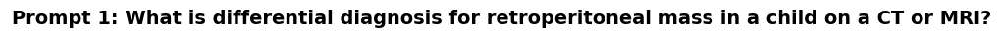

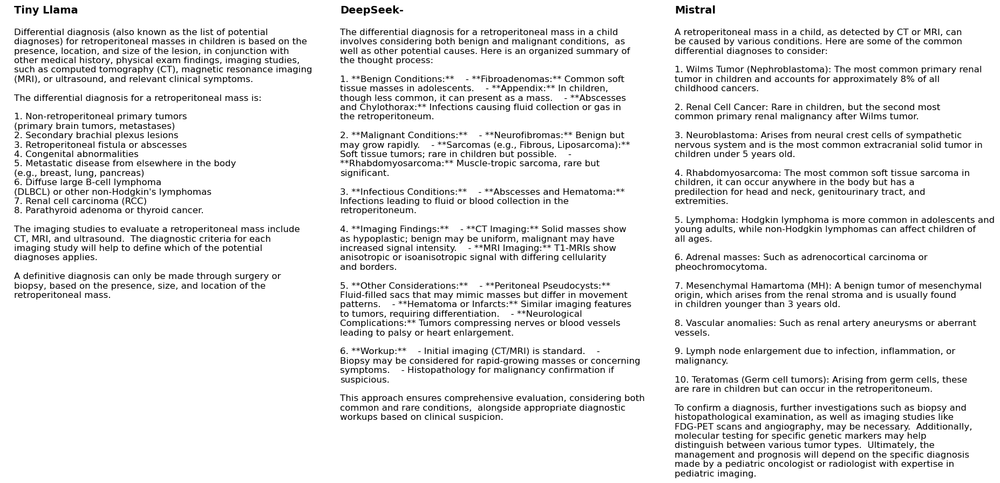

In [115]:
import matplotlib.pyplot as plt
import matplotlib.axes as ax


prmt_num = 1

# PROMPT
fig, ax = plt.subplots(figsize=(2, 0.25))
ax.text(0.01, 1.05, 'Prompt ' + (str(prmt_num)) + ": " + prompts[prmt_num-1], fontsize=14, weight='bold')
ax.axis('off')
plt.show()

fig, ax = plt.subplots(figsize=(20, 6))

# Text blocks and positions
titles = ["Tiny Llama", "DeepSeek-", "Mistral"]
texts = [output1[0], output1[1], output1[2]]
x_positions = [0.01, 0.40, 0.80]  # adjust as needed


for x, title, text in zip(x_positions, titles, texts):
    ax.text(x, 1.05, title, fontsize=14, weight='bold')   # title
    ax.text(x, 0.99, text, fontsize=12, va='top')         # text

ax.axis('off')
plt.show()

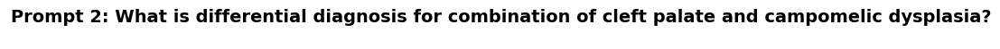

/home/mollie/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 26029 (\N{CJK UNIFIED IDEOGRAPH-65AD}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


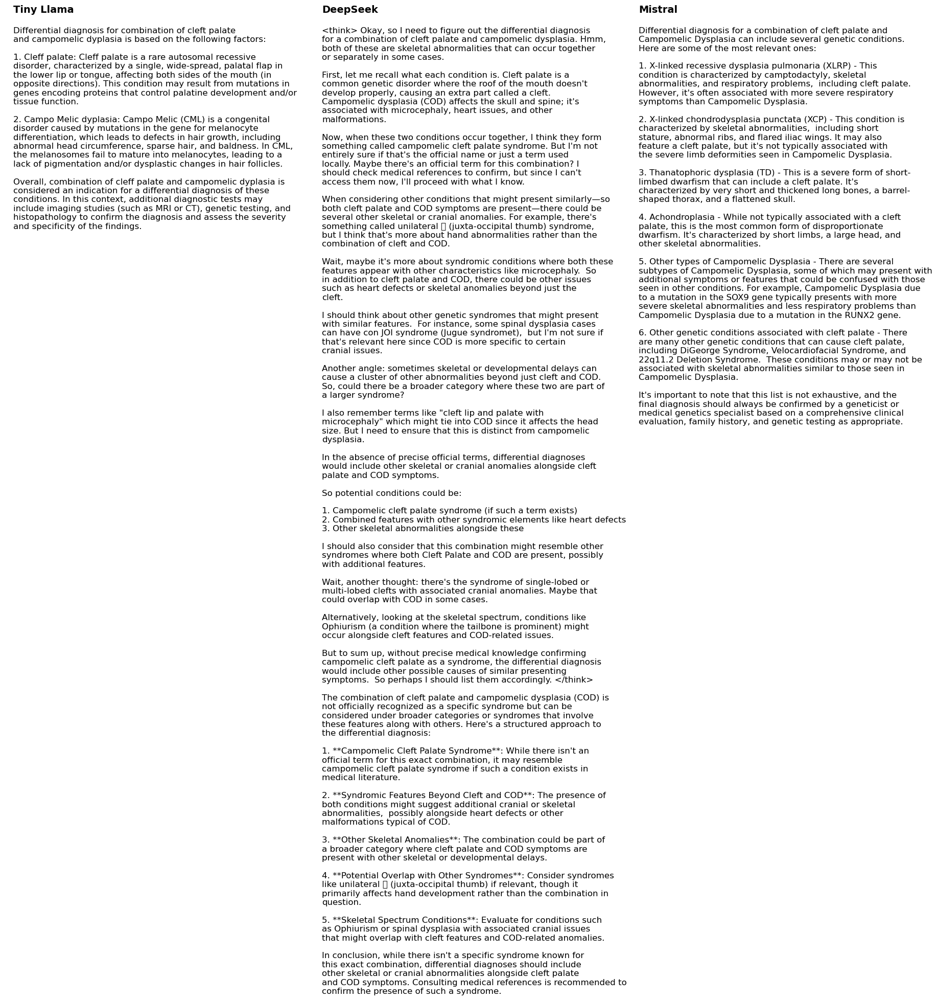

In [144]:
import matplotlib.pyplot as plt
import matplotlib.axes as ax

prmt_num = 2

# PROMPT
fig, ax = plt.subplots(figsize=(2, 0.25))
ax.text(0.01, 1.05, 'Prompt ' + (str(prmt_num)) + ": " + prompts[prmt_num-1], fontsize=14, weight='bold')
ax.axis('off')
plt.show()

# RESPONSES
fig, ax = plt.subplots(figsize=(20, 6))

# Text blocks and positions
titles = ["Tiny Llama", "DeepSeek", "Mistral"]
texts = [output2[0], output2[1], output2[2]]
x_positions = [0.01, 0.40, 0.80]  # adjust as needed


for x, title, text in zip(x_positions, titles, texts):
    ax.text(x, 1.05, title, fontsize=14, weight='bold')   # title
    ax.text(x, 0.99, text, fontsize=12, va='top')         # text

ax.axis('off')
plt.show()

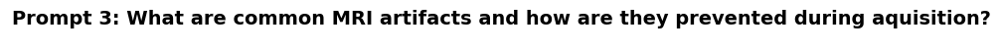

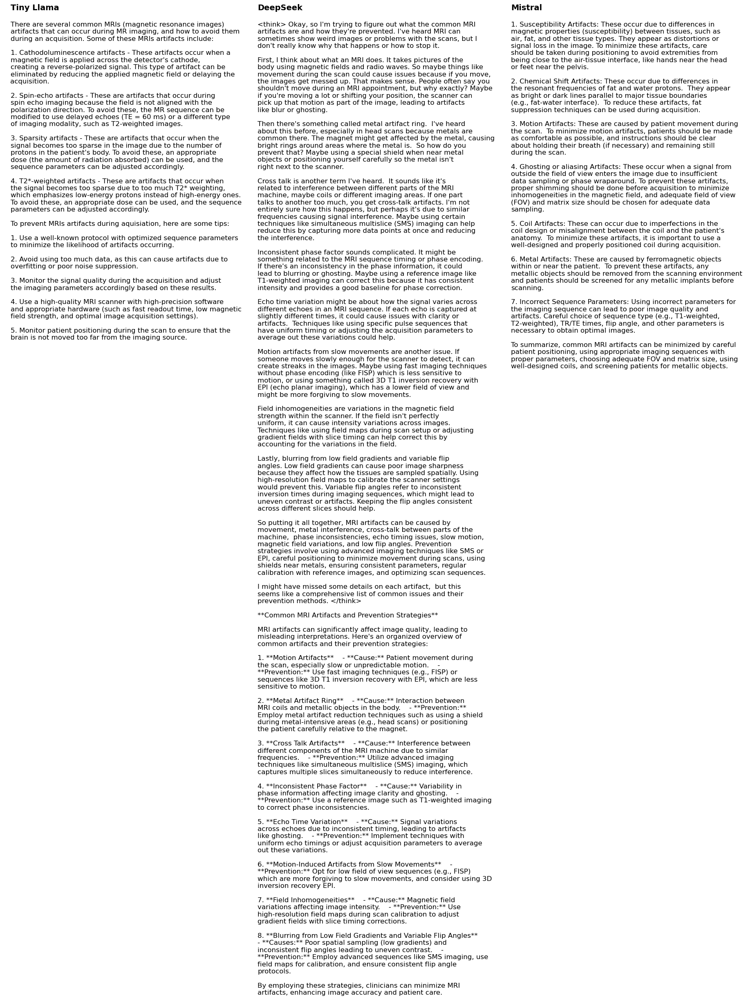

In [145]:
prmt_num = 3

# PROMPT
fig, ax = plt.subplots(figsize=(2, 0.25))
ax.text(0.01, 1.05, 'Prompt ' + (str(prmt_num)) + ": " + prompts[prmt_num-1], fontsize=14, weight='bold')
ax.axis('off')
plt.show()

# RESPONSES
fig, ax = plt.subplots(figsize=(20, 6))

# Text blocks and positions
titles = ["Tiny Llama", "DeepSeek", "Mistral"]
texts = [output3[0], output3[1], output3[2]]
x_positions = [0.01, 0.40, 0.80]  # adjust as needed


for x, title, text in zip(x_positions, titles, texts):
    ax.text(x, 1.05, title, fontsize=14, weight='bold')   # title
    ax.text(x, 0.99, text, fontsize=12, va='top')

ax.axis('off')
plt.show()

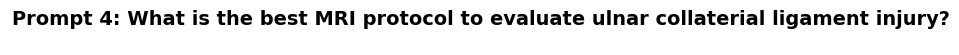

/home/mollie/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 27169 (\N{CJK UNIFIED IDEOGRAPH-6A21}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/home/mollie/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 31946 (\N{CJK UNIFIED IDEOGRAPH-7CCA}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/home/mollie/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 24433 (\N{CJK UNIFIED IDEOGRAPH-5F71}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/home/mollie/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 20687 (\N{CJK UNIFIED IDEOGRAPH-50CF}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


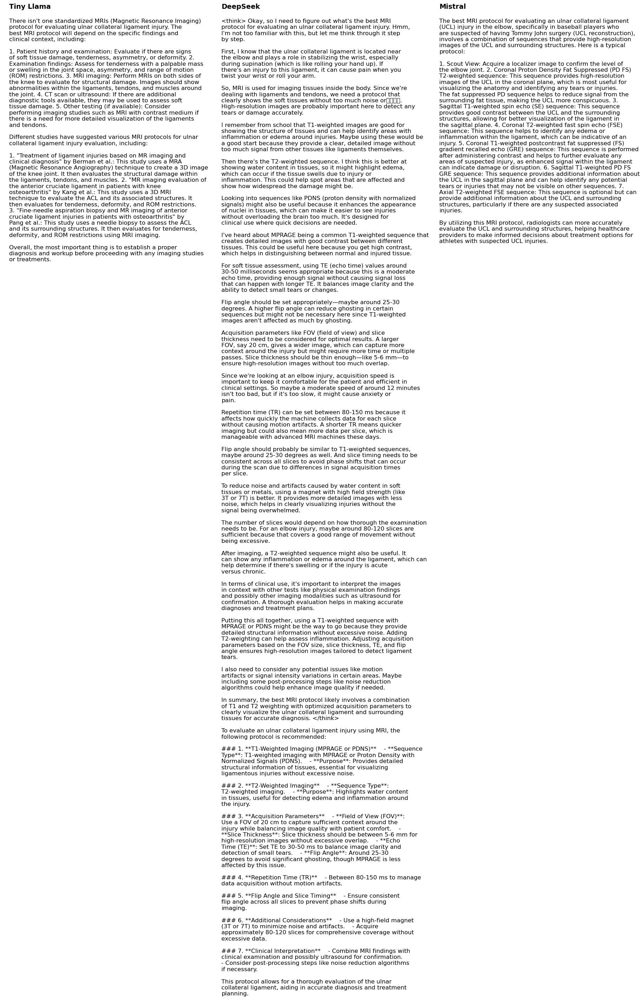

In [146]:
prmt_num = 4

# PROMPT
fig, ax = plt.subplots(figsize=(2, 0.25))
ax.text(0.01, 1.05, 'Prompt ' + (str(prmt_num)) + ": " + prompts[prmt_num-1], fontsize=14, weight='bold')
ax.axis('off')
plt.show()

# RESPONSES
fig, ax = plt.subplots(figsize=(20, 6))

# Text blocks and positions
titles = ["Tiny Llama", "DeepSeek", "Mistral"]
texts = [output4[0], output4[1], output4[2]]
x_positions = [0.01, 0.40, 0.80]  # adjust as needed


for x, title, text in zip(x_positions, titles, texts):
    ax.text(x, 1.05, title, fontsize=14, weight='bold')   # title
    ax.text(x, 0.99, text, fontsize=12, va='top')         # text

ax.axis('off')
plt.show()

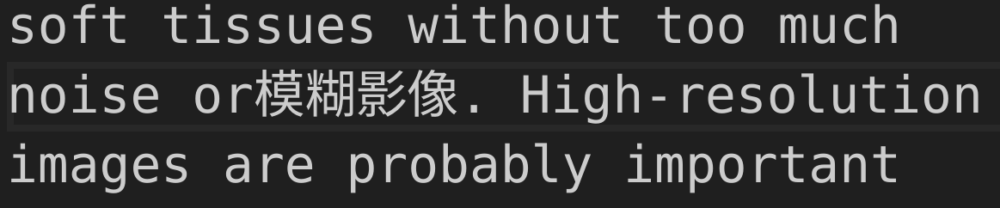

In [18]:
from IPython.display import Image 
Image(filename='DS_Chinese.png') # https://stackoverflow.com/questions/11854847/how-can-i-display-an-image-from-a-file-in-jupyter-notebook#11855133

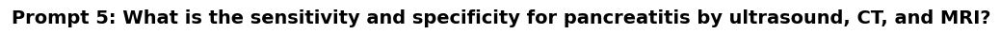

/home/mollie/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 24449 (\N{CJK UNIFIED IDEOGRAPH-5F81}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


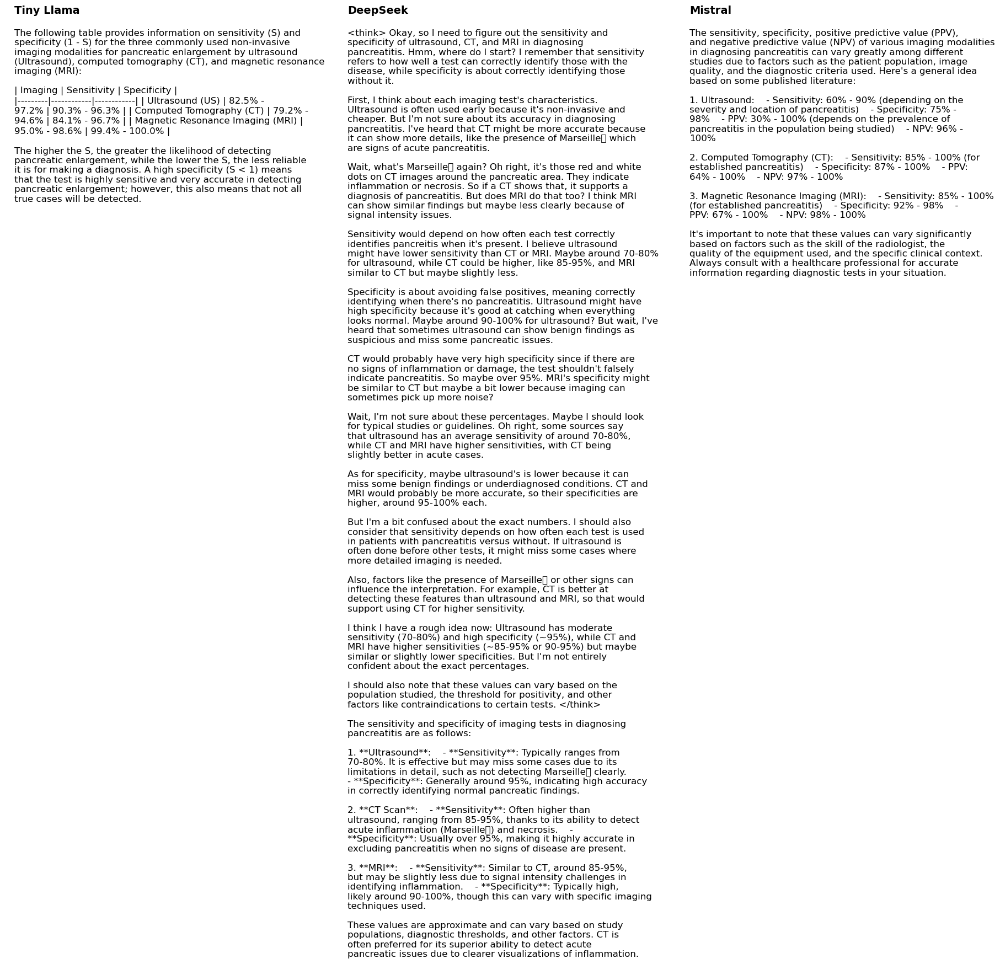

In [147]:
prmt_num = 5

# PROMPT
fig, ax = plt.subplots(figsize=(2, 0.25))
ax.text(0.01, 1.05, 'Prompt ' + (str(prmt_num)) + ": " + prompts[prmt_num-1], fontsize=14, weight='bold')
ax.axis('off')
plt.show()

# RESPONSES
fig, ax = plt.subplots(figsize=(20, 6))

# Text blocks and positions
titles = ["Tiny Llama", "DeepSeek", "Mistral"]
texts = [output5[0], output5[1], output5[2]]
x_positions = [0.01, 0.40, 0.80]  # adjust as needed


for x, title, text in zip(x_positions, titles, texts):
    ax.text(x, 1.05, title, fontsize=14, weight='bold')   # title
    ax.text(x, 0.99, text, fontsize=12, va='top')         # text

ax.axis('off')
plt.show()

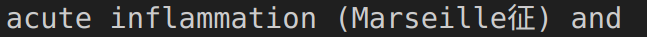

In [19]:
from IPython.display import Image 
Image(filename='DS_Chinese2.png')

# Stats for Focused Results

In [165]:
import pandas as pd

df_f = pd.read_csv("focused_results_all.csv")

print(df_f.head())

              model task                                             prompt  \
0  tinyllama:latest   Q1  What is differential diagnosis for retroperito...   
1  tinyllama:latest   Q2  What is differential diagnosis for combination...   
2  tinyllama:latest   Q3  What are common MRI artifacts and how are they...   
3  tinyllama:latest   Q4  What is the best MRI protocol to evaluate ulna...   
4  tinyllama:latest   Q5  What is the sensitivity and specificity for pa...   

   response_time_sec  cpu_used_percent  memory_used_MB  
0              26.60               9.4          735.93  
1              19.56              51.2           62.99  
2              31.68              53.4           69.75  
3              34.98              53.8        -4953.69  
4              18.74              54.2           84.90  


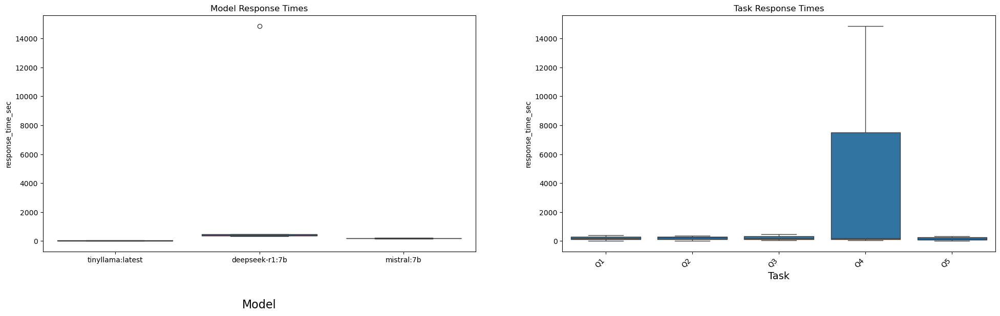

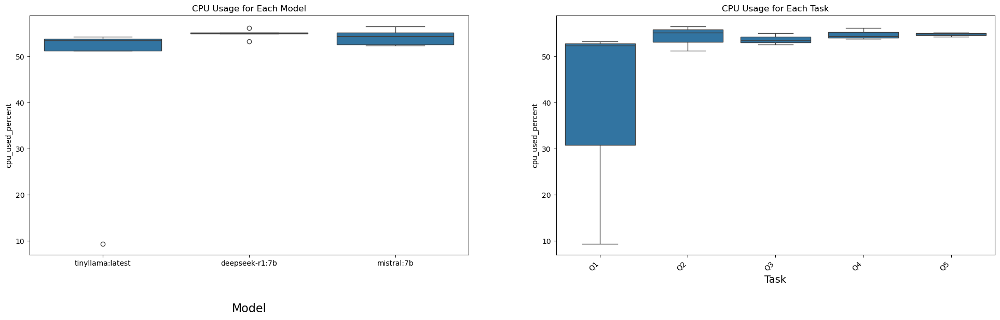

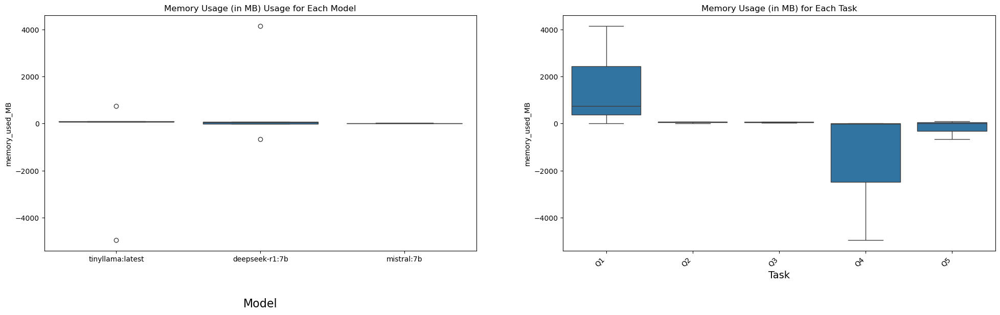

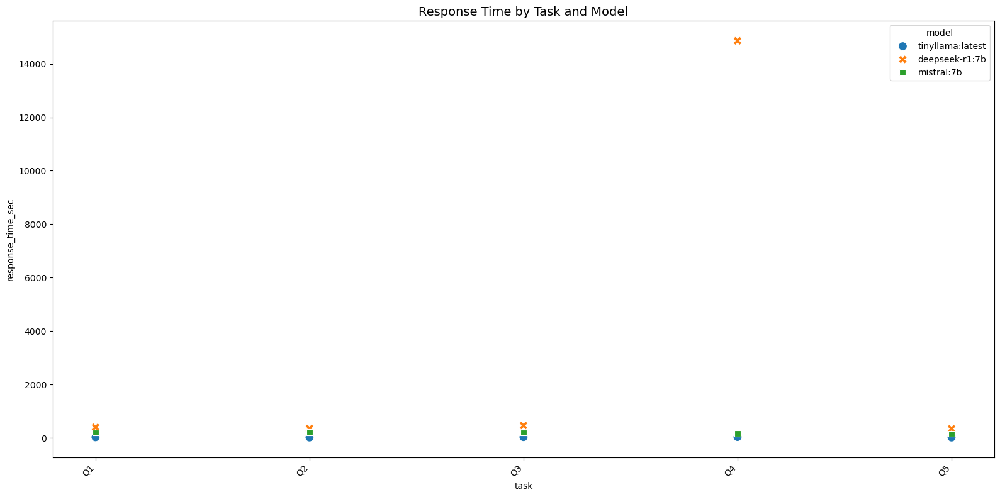

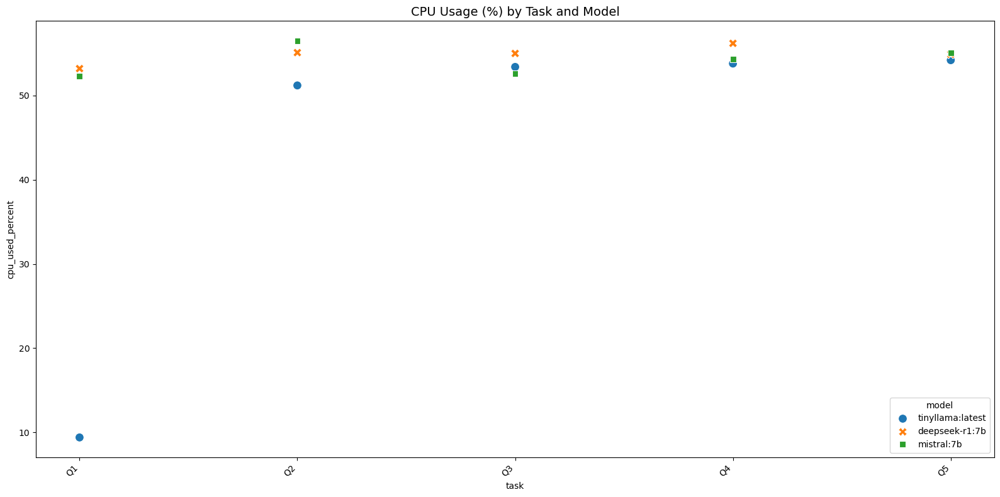

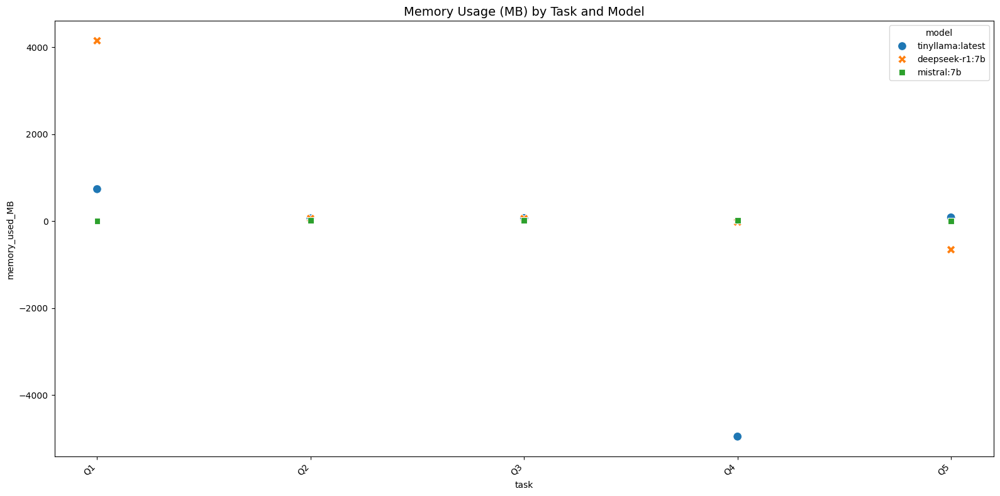

In [166]:
import matplotlib.pyplot as plt
import seaborn as sns

# plt.subplots(figsize=(24, 6))


plt.figure(figsize=(24, 6))

plt.subplot(1,2,1)
sns.boxplot(x="model", y="response_time_sec", data=df_f)
plt.title('Model Response Times')
plt.xlabel("Model", fontsize=16, labelpad=50)

plt.subplot(1,2,2)
sns.boxplot(x="task", y="response_time_sec", data=df_f),
plt.xticks(rotation=45,ha="right")
plt.title('Task Response Times')
plt.xlabel("Task", fontsize=14)

plt.show()

plt.figure(figsize=(24, 6))

plt.subplot(1,2,1)
sns.boxplot(x="model", y="cpu_used_percent", data=df_f)
plt.title('CPU Usage for Each Model')
plt.xlabel("Model", fontsize=16, labelpad=50)

plt.subplot(1,2,2)
sns.boxplot(x="task", y="cpu_used_percent", data=df_f),
plt.xticks(rotation=45,ha="right")
plt.title('CPU Usage for Each Task')
plt.xlabel("Task", fontsize=14)

plt.show()


plt.figure(figsize=(24, 6))

plt.subplot(1,2,1)
sns.boxplot(x="model", y="memory_used_MB", data=df_f)
plt.title('Memory Usage (in MB) Usage for Each Model')
plt.xlabel("Model", fontsize=16, labelpad=50)

plt.subplot(1,2,2)
sns.boxplot(x="task", y="memory_used_MB", data=df_f),
plt.xticks(rotation=45,ha="right")
plt.title('Memory Usage (in MB) for Each Task')
plt.xlabel("Task", fontsize=14)

plt.show()

import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(16, 8))
sns.scatterplot(data=df_f, x="task", y="response_time_sec", hue="model", style="model", s=100)

plt.xticks(rotation=45, ha="right")
plt.title("Response Time by Task and Model", fontsize=14)
plt.tight_layout()
plt.show()

plt.figure(figsize=(16, 8))
sns.scatterplot(data=df_f, x="task", y="cpu_used_percent", hue="model", style="model", s=100)

plt.xticks(rotation=45, ha="right")
plt.title("CPU Usage (%) by Task and Model", fontsize=14)
plt.tight_layout()
plt.show()

plt.figure(figsize=(16, 8))
sns.scatterplot(data=df_f, x="task", y="memory_used_MB", hue="model", style="model", s=100)

plt.xticks(rotation=45, ha="right")
plt.title("Memory Usage (MB) by Task and Model", fontsize=14)
plt.tight_layout()
plt.show()